## Evaluation & Exploration

In [1]:
import pandas as pd
import torch
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sentence_transformers import SentenceTransformer, LoggingHandler, losses, models, util
from sentence_transformers.readers import InputExample
from sentence_transformers.evaluation import EmbeddingSimilarityEvaluator

### Explore data

In [23]:
# prepare corpus
dataset = pd.read_csv('./data/raw_data.csv')
dataset.shape

(17055, 5)

In [174]:
# basic corpus analysis
corpus_label_counts = dataset.value_counts(['label'])
corpus_label_counts

label            
restaurant-search    3042
movie-search         2669
flight-search        2293
music-search         1527
pizza-order          1376
coffee-order         1260
movie-ticket         1213
auto-repair-appt     1098
food-order           1009
ride-book             997
restaurant-book       571
dtype: int64

In [243]:
# generate per-label data for cleaning
for label in corpus_label_counts.index.tolist():
    label = label[0]
    df = dataset[dataset['label'] == label]
    df.to_csv("data_" + label+".csv")

#### Issues reported for each label's data:

1. auto-repair-appt: difference between "my car has an issue" vs. "my car has an issue please help book an appointment for it". Some dialogues (e.g. "looks like my maintenance lights are on" need inference to know that user actually wants a car appointment. How does an ML model learn that?). 10% corruption rate

2. coffee-order: 6% corruption rate
3. food-order: to make similar queries more explicit, cleaned out things like "I wanna get some food" (could be both food-order, or restaurant reservation, or restaurant-search). Also eliminated things like "That sounds great, I'll order two." Since we only look at single query and not dialog context.

general other issues: 
- hypothetical dialogues are very flowery, real dialog assistant dialogues are much more curt

Potential ideas:
1. use QA/websearch model: what user asks is strongly correlated to world knowledge, e.g. JLo => music
2. use inference model: e.g. "I'm hungry => find restaurants"

### Data Split

In [248]:
train_data_labels = ['auto-repair-appt', 'coffee-order', 'flight-search', 'food-order', 'movie-search', 'ride-book']
test_data_labels = ['auto-repair-appt', 'coffee-order', 'flight-search', 'food-order', 'hotel-search', 'movie-search', 'music-search', 'ride-book']
# test_data_labels = ['auto-repair-appt', 'coffee-order', 'flight-search', 'restaurant-search', 'movie-ticket', 'food-order', 'restaurant-book', 'movie-search', 'music-search', 'ride-book', 'pizza-order']
# train_data_labels = test_data_labels

In [516]:
# # old data split: all labels in test corpus are also present in training corpus
# train_samples, dev_samples, test_samples = [], [], []
# for f in clean_data_labels:
#     filename = "./data/clean_csv/data_" + f + ".csv"
#     df = pd.read_csv(filename)[:900]
#     train_samples.append(df[:300])  
#     dev_samples.append(df[300 : 350])
#     test_samples.append(df[350:])
# train_corpus = pd.concat(train_samples)
# dev_corpus = pd.concat(dev_samples)
# test_corpus = pd.concat(test_samples)
# print("train corpus size: ", train_corpus.shape)
# print("dev corpus size: ", dev_corpus.shape)
# print("test corpus size: ", test_corpus.shape)

In [328]:
# improve data split:
train_samples, dev_samples, test_samples = [], [], []
for f in test_data_labels:
    filename = "./data/clean_csv/data_" + f + ".csv"
    df = pd.read_csv(filename)[:900]
    if f in train_data_labels:
        train_samples.append(df[:360])
        dev_samples.append(df[360:430])
        test_samples.append(df[430:])
    else:
        test_samples.append(df[:470])
        dev_samples.append(df[470:540])
train_corpus = pd.concat(train_samples)
dev_corpus = pd.concat(dev_samples)
test_corpus = pd.concat(test_samples)
print("train corpus size: ", train_corpus.shape)
print("dev corpus size: ", dev_corpus.shape)
print("test corpus size: ", test_corpus.shape)

train corpus size:  (2160, 4)
dev corpus size:  (560, 4)
test corpus size:  (3760, 4)


In [191]:
# filename = "./data/clean_csv/data_" + "restaurant-book" + ".csv"
# df = pd.read_csv(filename)[:900]
# test_samples.append(df[:470-141])
# test_corpus = pd.concat(test_samples)
# test_corpus.shape

(5170, 6)

### Knowledge Testing

Premise: does having world knowledge on entities help improve performance of model? 

In [94]:
import spacy
spacy_model = spacy.load("en_core_web_sm")

In [95]:
masking_map = {
 'EVENT': 'entity0',
 'FAC': 'entity1',
 'GPE': 'entity2',
 'LOC': 'entity3',
 'NORP': 'entity4',
 'ORG': 'entity5',
 'PERSON': 'entity6',
 'PRODUCT': 'entity7',
 'WORK_OF_ART': 'entity8'}

In [96]:
def mask_entity(u):
    doc = spacy_model(u)
    idxs = [0]
    masks = []
    ret = ""
    for ent in doc.ents:
        if ent.label_ in masking_map:
            idxs.append(ent.start_char)
            idxs.append(ent.end_char)
            masks.append(masking_map[ent.label_])
    if (len(idxs) > 1 and len(masks) > 0):
        for i in range(0, len(idxs) - 1, 2):
            ret = ret + u[idxs[i] : idxs[i + 1]] + masks[int(i / 2)]
        ret += u[idxs[-1] :]
        return ret
    else :
        return u

In [274]:
# if corrupted dataset:
train_corpus['utterance'] = train_corpus['utterance'].apply(mask_entity)
test_corpus['utterance'] = test_corpus['utterance'].apply(mask_entity)

In [246]:
mask_entity("Play something by Kendrick Lamar.")

'Play something by entity6.'

### NER Preprocessing

Premise: having knowledge of entity could help understand these sentences better. Can we leverage NER to somehow improve model performance? 

In [312]:
def concat_entity(u):
    doc = spacy_model(u)
    idxs = [0]
    labels = []
    ret = ""
    for ent in doc.ents:
        if ent.label_ in masking_map:
            idxs.append(ent.start_char)
            idxs.append(ent.end_char)
            labels.append(ent.label_)
    if (len(idxs) > 1 and len(labels) > 0):
        for i in range(0, len(idxs) - 1, 2):
            ret = ret + u[idxs[i] : idxs[i + 1]] + labels[int(i / 2)] + " / " + u[idxs[i + 1] : idxs[i + 2]]
        ret += u[idxs[-1] :]
#         print(ret)
        return ret
    else :
        return u

In [327]:
# if ner tagging:
train_corpus['utterance'] = train_corpus['utterance'].apply(concat_entity)
# test_corpus['utterance'] = test_corpus['utterance'].apply(concat_entity)

In [4]:
# create training sentence pairs
train_pair_corpus = []
train_corpus = train_corpus.sample(frac=1) # randomize order first
# first, create similar pairs
for label in train_data_labels:
    same_label_data = train_corpus[train_corpus['label'] == label].reset_index(drop=True)
    utterance_list = same_label_data['utterance']
    for i in range(len(utterance_list) - 1):
        for j in range(i + 1, len(utterance_list)):
            utter1, utter2 = utterance_list[i], utterance_list[j]
            if (utter1 != utter2):
                inp_example = InputExample(texts=[utter1, utter2], label=1.0)   # TODO: should we use baseline model score as similarity score?
                train_pair_corpus.append(inp_example)
    print(len(train_pair_corpus))
num_sim_pairs = len(train_pair_corpus)
print("Number of similar pairs in training data: ", num_sim_pairs)
# then, create dissimilar pairs
for idx in range(len(train_data_labels) - 1):
    same_label_data = train_corpus[train_corpus['label'] == train_data_labels[idx]].reset_index(drop=True)[:180]
    diff_label_data = train_corpus[train_corpus['label'].isin(train_data_labels[idx + 1:])].reset_index(drop=True)[:180]
    for utter1 in same_label_data['utterance']:
        for utter2 in diff_label_data['utterance']:
            inp_example = InputExample(texts=[utter1, utter2], label=0.2)   # TODO: should we use baseline model score as similarity score?
            train_pair_corpus.append(inp_example)
train_pair_corpus = pd.Series(train_pair_corpus).sample(frac=1)
print("Number of dissimilar pairs in training data: ", len(train_pair_corpus) - num_sim_pairs)
print("total training data size: ", len(train_pair_corpus))

64620
129240
193860
258480
323100
387720
Number of similar pairs in training data:  387720
Number of dissimilar pairs in training data:  162000
total training data size:  549720


In [5]:
# create dev sentence pairs
dev_pair_corpus = []
dev_corpus = dev_corpus.sample(frac=1) # randomize order first
# first, create similar pairs
for label in test_data_labels:
    same_label_data = dev_corpus[dev_corpus['label'] == label].reset_index(drop=True)
    utterance_list = same_label_data['utterance']
    for i in range(len(utterance_list) - 1):
        for j in range(i + 1, len(utterance_list)):
            utter1, utter2 = utterance_list[i], utterance_list[j]
            if (utter1 != utter2):
                inp_example = InputExample(texts=[utter1, utter2], label=1.0)   # TODO: should we use baseline model score as similarity score?
                dev_pair_corpus.append(inp_example)
    print(len(dev_pair_corpus))
num_sim_dev_pairs = len(dev_pair_corpus)
print("Number of similar pairs in dev data: ", num_sim_dev_pairs)
# then, create dissimilar pairs
for idx in range(len(test_data_labels) - 1):
    same_label_data = dev_corpus[dev_corpus['label'] == test_data_labels[idx]].reset_index(drop=True)[:25]
    diff_label_data = dev_corpus[dev_corpus['label'].isin(test_data_labels[idx + 1:])].reset_index(drop=True)[:25]
    for utter1 in same_label_data['utterance']:
        for utter2 in diff_label_data['utterance']:
            inp_example = InputExample(texts=[utter1, utter2], label=0.2)   # TODO: should we use baseline model score as similarity score?
            dev_pair_corpus.append(inp_example)
dev_pair_corpus = pd.Series(dev_pair_corpus).sample(frac=1)
print("Number of dissimilar pairs in dev data: ", len(dev_pair_corpus) - num_sim_dev_pairs)
print("total validation data size: ", len(dev_pair_corpus))

2415
4830
7245
9660
12075
14490
16905
19320
21735
Number of similar pairs in dev data:  21735
Number of dissimilar pairs in dev data:  5000
total validation data size:  26735


In [6]:
print(train_pair_corpus[100])

<InputExample> label: 1.0, texts: I need to bring my car to the mechanic; Hey, my car is due for its 50k mile check up. Can you make an appointment for me?


In [333]:
test_corpus = test_corpus.reset_index(drop=True)
print(test_corpus.shape)
print(test_corpus['label'].value_counts())
test_corpus.head(5)

(3760, 4)
flight-search       470
coffee-order        470
music-search        470
ride-book           470
movie-search        470
food-order          470
hotel-search        470
auto-repair-appt    470
Name: label, dtype: int64


,instruction_id,conversation_id,utterance,label
0,auto-repair-appt-1,dlg-6b8daf9b-d4c6-4d74-84dc-6fe71d3ac535,Can you schedule an appointment to have my car...,auto-repair-appt
1,auto-repair-appt-1,dlg-6b9a9ba6-52ec-40f5-98f1-36237f13463c,"Hi, Jeff. Could you make a car appointment for...",auto-repair-appt
2,auto-repair-appt-1,dlg-6d1a74e4-a2c6-4039-8ad9-ef6c3fcb02c8,I need to see if I can get in right away. It s...,auto-repair-appt
3,auto-repair-appt-1,dlg-6d1df0ce-2923-4c67-a0c2-a27a757e5980,"Hello, I would like to schedule an appointment...",auto-repair-appt
4,auto-repair-appt-1,dlg-6d2f42bd-bb1a-4611-a89f-415d5188c609,Hey! Can you book me an appointment at Intelli...,auto-repair-appt


### Model Evaluation

In [213]:
# # load baseline model
# baseline_model = SentenceTransformer('paraphrase-distilroberta-base-v1')
# test_corpus_embeddings = baseline_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
# test_corpus_embeddings.shape

torch.Size([5170, 768])

In [225]:
# or, use custom model
# crude_model = SentenceTransformer('./models/crude')
# test_corpus_embeddings = crude_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)

In [251]:
# # or, use custom model
# finetune_model = SentenceTransformer('./models/finetune')
# test_corpus_embeddings = finetune_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
# test_corpus_embeddings.shape

torch.Size([3760, 768])

In [276]:
# # or, use custom model
# finetune_model = SentenceTransformer('./models/qa')
# test_corpus_embeddings = finetune_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
# test_corpus_embeddings.shape

torch.Size([3760, 768])

In [299]:
# # or, use custom model
# finetune_model = SentenceTransformer('./models/finetune_corrupted')
# test_corpus_embeddings = finetune_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
# test_corpus_embeddings.shape

torch.Size([3760, 768])

In [288]:
# # # or, use custom model
# finetune_model = SentenceTransformer('./models/qa_corrupted')
# test_corpus_embeddings = finetune_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
# test_corpus_embeddings.shape

torch.Size([3760, 768])

In [166]:
# # or, use custom model
# finetune_model = SentenceTransformer('./models/bert_ner')
# test_corpus_embeddings = finetune_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
# test_corpus_embeddings.shape

torch.Size([3760, 768])

In [43]:
# # or, use custom model
# finetune_model = SentenceTransformer('./models/qa_bert_ner')
# test_corpus_embeddings = finetune_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
# test_corpus_embeddings.shape

torch.Size([4230, 768])

In [329]:
# or, use custom model
finetune_model = SentenceTransformer('./models/roberta_ner')
test_corpus_embeddings = finetune_model.encode(test_corpus['utterance'].tolist(), convert_to_tensor=True)
test_corpus_embeddings.shape

torch.Size([3760, 768])

In [334]:
test_corpus_dist = test_corpus['label'].value_counts()
test_corpus_dist

flight-search       470
coffee-order        470
music-search        470
ride-book           470
movie-search        470
food-order          470
hotel-search        470
auto-repair-appt    470
Name: label, dtype: int64

In [335]:
test_corpus.index

RangeIndex(start=0, stop=3760, step=1)

In [336]:
# Find the closest k sentences of the corpus for each query sentence based on cosine similarity
top_k = 470 # is this something we should tune for? Currently try to capture all possible results
# top_k = min(5, len(corpus))
results = []
for i in range(len(test_corpus)):
#     query_embedding = baseline_model.encode(query, convert_to_tensor=True)
    query_embedding = test_corpus_embeddings[i]
    query = test_corpus['utterance'][i]

    # We use cosine-similarity and torch.topk to find the highest 5 scores
    cos_scores = util.pytorch_cos_sim(query_embedding, test_corpus_embeddings)[0]
    top_results = torch.topk(cos_scores, k=top_k, sorted=True) # top one query is input itself
    print(cos_scores.shape)
    print(top_results[0].shape)
    results.append(top_results)

    print("\n\n======================\n\n")
    print("Query:", query)
    
    print("\nTop 5 most similar sentences in corpus:")
    for score, idx in zip(top_results[0][:5], top_results[1][:5]):
        print(score, idx.item())
        print(test_corpus['utterance'][idx.item()], "(Score: {:.4f})".format(score))
    
    print("\nTop 5 least similar sentences in corpus:")
    for score, idx in zip(top_results[0][-4:], top_results[1][-4:]):
        print(test_corpus['utterance'][idx.item()], "(Score: {:.4f})".format(score))

print(len(results))

torch.Size([3760])
torch.Size([470])




Query: Can you schedule an appointment to have my car looked at?

Top 5 most similar sentences in corpus:
tensor(1.0000) 0
Can you schedule an appointment to have my car looked at? (Score: 1.0000)
tensor(0.9984) 110
Hey, can I schedule an appointment for my car to be looked at? (Score: 0.9984)
tensor(0.9984) 73
Hey, can you set up an appointment for me to have my car looked at this week? (Score: 0.9984)
tensor(0.9980) 436
I need to schedule an appointment to get my car looked at. (Score: 0.9980)
tensor(0.9979) 298
I need to make an appointment to have my car looked at. (Score: 0.9979)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7179)
Hey, my car got stolen and I need a ride. (Score: 0.6375)
Home to carwash , with Uber X (Score: 0.6305)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6159)


tensor(1.) 16
I need to set up an appointment to get my brakes looked at (Score: 1.0000)
tensor(0.9939) 332
I need to make an appointment to have my car looked at (Score: 0.9939)
tensor(0.9938) 217
I need to schedule an appointment for my car to perform its brakes. (Score: 0.9938)
tensor(0.9934) 114
Hey, I need to set up an appointment to get my car into the shop (Score: 0.9934)
tensor(0.9934) 105
Hi, I need to make an appointment to have my car looked at (Score: 0.9934)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7081)
Home to carwash , with Uber X (Score: 0.6335)
Hey, my car got stolen and I need a ride. (Score: 0.6313)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6046)
torch.Size([3760])
torch.Size([470])




Query: Hey, can you arrange an appointment with a car mechanic for me?

Top 5 most similar sentences in corpus:
tens

tensor(0.9958) 155
I need you to book an appointment to get some work done on my car. (Score: 0.9958)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7446)
Hey, my car got stolen and I need a ride. (Score: 0.6673)
Home to carwash , with Uber X (Score: 0.6578)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6416)
torch.Size([3760])
torch.Size([470])




Query: Hi, Angela? I need to make an appointment to get my car checked out as soon as possible.

Top 5 most similar sentences in corpus:
tensor(1.0000) 32
Hi, Angela? I need to make an appointment to get my car checked out as soon as possible. (Score: 1.0000)
tensor(0.9981) 291
Hi, I'd like to set up an appointment to get my car checked out. (Score: 0.9981)
tensor(0.9979) 343
Hey! I need you to schedule an appointment for me to have my car looked at.  (Score: 0.9979)
tensor(0.9977) 327

torch.Size([3760])
torch.Size([470])




Query: Hey can you make an appointment with Intelligent Auto Solutions for my car?

Top 5 most similar sentences in corpus:
tensor(1.0000) 49
Hey can you make an appointment with Intelligent Auto Solutions for my car? (Score: 1.0000)
tensor(0.9987) 338
I need an appointment with Intelligent Auto Solutions for my car. (Score: 0.9987)
tensor(0.9986) 455
Hey Tina, Can you make me an appointment with Intelligent Auto Solutions? (Score: 0.9986)
tensor(0.9985) 431
can you make an appointment for me at Intelligent Auto Solutions? (Score: 0.9985)
tensor(0.9985) 438
Hi, can you make appointment with Intelligent Auto Solutions? (Score: 0.9985)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7407)
Hey, my car got stolen and I need a ride. (Score: 0.6702)
Home to carwash , with Uber X (Score: 0.6634)
I was thinking about buying this used car, and was wondering if you would take a look at it for 

torch.Size([3760])
torch.Size([470])




Query: Hi I need to bring my car in to the shop

Top 5 most similar sentences in corpus:
tensor(1.0000) 66
Hi I need to bring my car in to the shop (Score: 1.0000)
tensor(0.9974) 365
Hey there. I need to get my car in to the shop to get it looked at. (Score: 0.9974)
tensor(0.9966) 277
Hey, I need to get my car into the shop relatively soon. (Score: 0.9966)
tensor(0.9965) 194
Hey, I need to get my car in to the shop. Can you schedule it for me? (Score: 0.9965)
tensor(0.9965) 90
Sally, I need to get my car in the shop. (Score: 0.9965)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7715)
Hey, my car got stolen and I need a ride. (Score: 0.7010)
Home to carwash , with Uber X (Score: 0.6898)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6704)
torch.Size([3760])
torch.Size([470])




Query: Hi, I

tensor(0.9975) 358
I want to make an appointment for my vehicle. (Score: 0.9975)
tensor(0.9974) 265
Good morning Renee. I need you to schedule an appointment for my vehicle? (Score: 0.9974)
tensor(0.9972) 21
I need to schedule an appointment for my vehicle (Score: 0.9972)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7671)
Hey, my car got stolen and I need a ride. (Score: 0.6923)
Home to carwash , with Uber X (Score: 0.6853)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6615)
torch.Size([3760])
torch.Size([470])




Query: Can I get an appoinment at Intelligent Auto Solutions?

Top 5 most similar sentences in corpus:
tensor(1.0000) 86
Can I get an appoinment at Intelligent Auto Solutions? (Score: 1.0000)
tensor(0.9947) 402
Hello is this, "Intelligent Auto Solutions" (Score: 0.9947)
tensor(0.9947) 234
Can you book me an appointmen

tensor(0.9989) 201
I need to schedule an appointment at Intelligent Auto Solutions. (Score: 0.9989)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7205)
Hey, my car got stolen and I need a ride. (Score: 0.6460)
Home to carwash , with Uber X (Score: 0.6404)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6197)
torch.Size([3760])
torch.Size([470])




Query: Hey assistant, I have a minor emergency with my car and need to have it looked at, I want to schedule an appointment at Intelligent Auto Solutions

Top 5 most similar sentences in corpus:
tensor(1.0000) 102
Hey assistant, I have a minor emergency with my car and need to have it looked at, I want to schedule an appointment at Intelligent Auto Solutions (Score: 1.0000)
tensor(0.9976) 364
Hey, can you make an appointment for me at Intelligent Auto Solutions? (Score: 0.9976)
tensor(0.

tensor(0.9923) 403
hi I'm driving and my car is making a weird noise can you make a repair appointment for me (Score: 0.9923)
tensor(0.9918) 275
Somethin's wrong with my car. It needs to be repaired immediately (Score: 0.9918)
tensor(0.9915) 88
Mary, something is wrong with my car. It's pulling to the left when I'm driving it. Can you schedule an appointment at Intelligent Auto Solutions tomorrow? (Score: 0.9915)
tensor(0.9912) 393
Hello John, I need you to book a service appointment for my car at Intelligent Auto Solutions. (Score: 0.9912)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7527)
Hey, my car got stolen and I need a ride. (Score: 0.6800)
Home to carwash , with Uber X (Score: 0.6685)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6567)
torch.Size([3760])
torch.Size([470])




Query: Hey Susie, my car's been acting weird.

tensor(0.9836) 446
Hi. I would like to bring in my car for a tune up. (Score: 0.9836)
tensor(0.9832) 192
i need to get a tune up on my car. (Score: 0.9832)
tensor(0.9820) 77
Hi, sorry if I don't sound the clearest, I'm driving. I've been noticing a jerking sensation from my car when braking; I think it may be the transmission. Can you please make an appointment to see the mechanic for me? (Score: 0.9820)

Top 5 least similar sentences in corpus:
hello I have a 2010 ford fusion and I need to get it repaired, can you help? (Score: 0.7780)
Hey, my car got stolen and I need a ride. (Score: 0.7334)
Home to carwash , with Uber X (Score: 0.7316)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6941)
torch.Size([3760])
torch.Size([470])




Query: Hey there, I need to take the van into the shop.

Top 5 most similar sentences in corpus:
tensor(1.0000) 136
Hey there, I need to take the van into the shop. (

torch.Size([3760])
torch.Size([470])




Query: I need some vehicle repairs and I was wondering if you could help me out setting up an appointment.

Top 5 most similar sentences in corpus:
tensor(1.) 153
I need some vehicle repairs and I was wondering if you could help me out setting up an appointment. (Score: 1.0000)
tensor(0.9948) 147
Hi Alexa, I need you to set up an appointment for a car repair. (Score: 0.9948)
tensor(0.9946) 258
Hello, I need an auto repair appointment. (Score: 0.9946)
tensor(0.9944) 447
Hello, I'm in need of auto repair service, and would like to make an appointment. (Score: 0.9944)
tensor(0.9944) 174
I need to schedule an appointment with a car mechanic. (Score: 0.9944)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7671)
Hey, my car got stolen and I need a ride. (Score: 0.6913)
Home to carwash , with Uber X (Score: 0.6818)
I was thinking about buying this used car, and was wondering if you would ta

tensor(1.0000) 171
I need to schedule a tune up for my car, something's wrong. (Score: 1.0000)
tensor(0.9977) 369
Hi, I need to book an appointment for a tune up for my car, please. (Score: 0.9977)
tensor(0.9937) 408
Hey! I'm driving and I need you to make an appointment for my car. (Score: 0.9937)
tensor(0.9929) 192
i need to get a tune up on my car. (Score: 0.9929)
tensor(0.9928) 242
Hey, I need to book an appointment with Intelligent Auto Solutions for my car. (Score: 0.9928)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7540)
Hey, my car got stolen and I need a ride. (Score: 0.6810)
Home to carwash , with Uber X (Score: 0.6792)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6497)
torch.Size([3760])
torch.Size([470])




Query: I really am having some issues with my 2016 Buick Enclave.

Top 5 most similar sentences in corpus:
t

torch.Size([3760])
torch.Size([470])




Query: Good morning, can you make an appointment for me to get my oil changed?

Top 5 most similar sentences in corpus:
tensor(1.0000) 188
Good morning, can you make an appointment for me to get my oil changed? (Score: 1.0000)
tensor(0.9956) 3
Hello, I would like to schedule an appointment to get an oil change? (Score: 0.9956)
tensor(0.9946) 462
Hi, I'm wondering if I can schedule an appointment for an oil change and tune up? (Score: 0.9946)
tensor(0.9933) 404
Hi, I would like to schedule an appointment for an oil change. (Score: 0.9933)
tensor(0.9907) 286
Hey Google, Can you schedule a repair appointment for my car? I think my oil might be leaking. (Score: 0.9907)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7076)
Home to carwash , with Uber X (Score: 0.6300)
Hey, my car got stolen and I need a ride. (Score: 0.6280)
I was thinking about buying this used car, and was wondering if 

torch.Size([3760])
torch.Size([470])




Query: Hello, I would like you to book an appointment to have my car repaired

Top 5 most similar sentences in corpus:
tensor(1.0000) 207
Hello, I would like you to book an appointment to have my car repaired (Score: 1.0000)
tensor(0.9980) 363
I need you to schedule an appointment to get my car fixed please (Score: 0.9980)
tensor(0.9980) 241
Hi. Can you please help me book an appointment to get my car fixed? (Score: 0.9980)
tensor(0.9978) 3745
Hi, I need to schedule an appointment with car repair. (Score: 0.9978)
tensor(0.9977) 108
Hi, I really need to make an appointment for car repair. (Score: 0.9977)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7368)
Hey, my car got stolen and I need a ride. (Score: 0.6591)
Home to carwash , with Uber X (Score: 0.6479)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problem

Hi assistant! Need to get my car into Intelligent Auto Solutions asap (Score: 1.0000)
tensor(0.9968) 441
Hi I would like to send my car to Intelligent Auto Solutions. (Score: 0.9968)
tensor(0.9967) 49
Hey can you make an appointment with Intelligent Auto Solutions for my car? (Score: 0.9967)
tensor(0.9967) 25
Hey, can you call Intelligent Auto Solutions and setup an appointment for my car? (Score: 0.9967)
tensor(0.9967) 140
Hey Sean, It's Marcus. Can you get me an appointment at Intelligent Auto Solutions? (Score: 0.9967)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7504)
Hey, my car got stolen and I need a ride. (Score: 0.6800)
Home to carwash , with Uber X (Score: 0.6748)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6564)
torch.Size([3760])
torch.Size([470])




Query: Hey Emily, can you set up an appointment at a local auto 

torch.Size([3760])
torch.Size([470])




Query: I need to schedule an appointment for my car

Top 5 most similar sentences in corpus:
tensor(1.0000) 244
I need to schedule an appointment for my car (Score: 1.0000)
tensor(0.9995) 341
Hi I need to schedule an appointment for my car (Score: 0.9995)
tensor(0.9992) 203
I want to book an appointment for my car (Score: 0.9992)
tensor(0.9991) 256
i want to schedule an appointment for my car (Score: 0.9991)
tensor(0.9991) 48
Hi, I want to schedule an appointment for my car (Score: 0.9991)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7271)
Hey, my car got stolen and I need a ride. (Score: 0.6479)
Home to carwash , with Uber X (Score: 0.6414)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6194)
torch.Size([3760])
torch.Size([470])




Query: I need to get a car book appointment please

Top 

torch.Size([3760])
torch.Size([470])




Query: Hi, I would like to make an appointment for my 2016 Nissan Maxima

Top 5 most similar sentences in corpus:
tensor(1.0000) 259
Hi, I would like to make an appointment for my 2016 Nissan Maxima (Score: 1.0000)
tensor(0.9873) 303
Haley, I was driving the company's Chevy Traverse and the check engine light started flashing. It's a new car. Can you make an appointment at the Intelligent Auto Solutions? (Score: 0.9873)
tensor(0.9866) 247
I need my 2012 Kia Forte worked on by a professional at Intelligent Auto Solutions. (Score: 0.9866)
tensor(0.9858) 1
Hi, Jeff. Could you make a car appointment for me? (Score: 0.9858)
tensor(0.9856) 278
Hey I need to make an appointment at the dealership for my Jeep. (Score: 0.9856)

Top 5 least similar sentences in corpus:
Need to get my breaks looked at. (Score: 0.7595)
Home to carwash , with Uber X (Score: 0.7357)
Hey, my car got stolen and I need a ride. (Score: 0.7351)
I was thinking about buying this used

torch.Size([3760])
torch.Size([470])




Query: Hey I need to make an appointment at the dealership for my Jeep.

Top 5 most similar sentences in corpus:
tensor(1.0000) 278
Hey I need to make an appointment at the dealership for my Jeep. (Score: 1.0000)
tensor(0.9939) 408
Hey! I'm driving and I need you to make an appointment for my car. (Score: 0.9939)
tensor(0.9938) 393
Hello John, I need you to book a service appointment for my car at Intelligent Auto Solutions. (Score: 0.9938)
tensor(0.9938) 200
Hey, I'm driving and need you to book an appointment with a mechanic for me. (Score: 0.9938)
tensor(0.9937) 109
When you get a chance can you please make an appointment for me to bring my car to the mechanic. (Score: 0.9937)

Top 5 least similar sentences in corpus:
Need to get my breaks looked at. (Score: 0.7758)
Hey, my car got stolen and I need a ride. (Score: 0.7101)
Home to carwash , with Uber X (Score: 0.7032)
I was thinking about buying this used car, and was wondering if you would t

torch.Size([3760])
torch.Size([470])




Query: I want to schedule an appointment for my car at Intelligent Auto Solutions

Top 5 most similar sentences in corpus:
tensor(1.0000) 296
I want to schedule an appointment for my car at Intelligent Auto Solutions (Score: 1.0000)
tensor(0.9996) 410
I need to make an appointment for my car at Intelligent Auto Solutions (Score: 0.9996)
tensor(0.9990) 201
I need to schedule an appointment at Intelligent Auto Solutions. (Score: 0.9990)
tensor(0.9989) 205
Hey, I need to schedule an appointment at Intelligent Auto Solutions (Score: 0.9989)
tensor(0.9988) 380
Hello, I need to schedule an appointment at Intelligent Auto Solutions (Score: 0.9988)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7283)
Hey, my car got stolen and I need a ride. (Score: 0.6520)
Home to carwash , with Uber X (Score: 0.6469)
I was thinking about buying this used car, and was wondering if you would take a look at 

torch.Size([3760])
torch.Size([470])




Query: I need to get my car repaired.

Top 5 most similar sentences in corpus:
tensor(1.0000) 313
I need to get my car repaired. (Score: 1.0000)
tensor(0.9988) 426
Hi, I need to get my car repaired. (Score: 0.9988)
tensor(0.9970) 355
Hello, I need to get my car repaired? (Score: 0.9970)
tensor(0.9964) 38
Hello, I need to take my car to get it repaired. (Score: 0.9964)
tensor(0.9951) 76
I need to schedule a repair appointment for my car. (Score: 0.9951)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7416)
Hey, my car got stolen and I need a ride. (Score: 0.6677)
Home to carwash , with Uber X (Score: 0.6558)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6468)
torch.Size([3760])
torch.Size([470])




Query: Id like to bring my car in for an appointment. 

Top 5 most similar sentences in corpus

torch.Size([3760])
torch.Size([470])




Query: Can you make an appointment with Intelligent Auto Solutions ASAP?

Top 5 most similar sentences in corpus:
tensor(1.0000) 326
Can you make an appointment with Intelligent Auto Solutions ASAP? (Score: 1.0000)
tensor(0.9990) 438
Hi, can you make appointment with Intelligent Auto Solutions? (Score: 0.9990)
tensor(0.9982) 419
Can you make me an appointment at Intelligent Auto Solutions? (Score: 0.9982)
tensor(0.9980) 397
Hi I need to make an appointment with Intelligent Auto Solutions (Score: 0.9980)
tensor(0.9979) 81
Can you get me an appointment at Intelligent Auto Solutions? (Score: 0.9979)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7371)
Hey, my car got stolen and I need a ride. (Score: 0.6670)
Home to carwash , with Uber X (Score: 0.6619)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Sco

tensor(0.9980) 445
Hey, can you book an appointment for me to bring my car in? I need to see a mechanic. (Score: 0.9980)
tensor(0.9979) 9
Hello, can you please make me an appointment with the mechanic for my car? (Score: 0.9979)
tensor(0.9978) 241
Hi. Can you please help me book an appointment to get my car fixed? (Score: 0.9978)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7351)
Hey, my car got stolen and I need a ride. (Score: 0.6585)
Home to carwash , with Uber X (Score: 0.6494)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6347)
torch.Size([3760])
torch.Size([470])




Query: Hey, Susan. Sorry to bother you but I need you to set up an appointment for me to take my car in. 

Top 5 most similar sentences in corpus:
tensor(1.0000) 340
Hey, Susan. Sorry to bother you but I need you to set up an appointment for me to take my car 

tensor(0.9940) 432
Hey Carrie, I need you to check the availability at Intelligent Auto Solutions for me; there is something not right with my car. (Score: 0.9940)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7565)
Hey, my car got stolen and I need a ride. (Score: 0.6825)
Home to carwash , with Uber X (Score: 0.6804)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6657)
torch.Size([3760])
torch.Size([470])




Query: I would like to schedule an appointment at Intelligent Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.0000) 353
I would like to schedule an appointment at Intelligent Auto Solutions. (Score: 1.0000)
tensor(0.9994) 201
I need to schedule an appointment at Intelligent Auto Solutions. (Score: 0.9994)
tensor(0.9993) 414
I would like to schedule an appointment with Intelligent Auto Solutions. (Score: 0.9

I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7677)
Hey, my car got stolen and I need a ride. (Score: 0.6961)
Home to carwash , with Uber X (Score: 0.6835)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6710)
torch.Size([3760])
torch.Size([470])




Query: Hello, I need to make an appointment at a mechanic shop. My car is making a funny noise when I turn on the air conditioner.

Top 5 most similar sentences in corpus:
tensor(1.0000) 366
Hello, I need to make an appointment at a mechanic shop. My car is making a funny noise when I turn on the air conditioner. (Score: 1.0000)
tensor(0.9964) 383
I need to make an appointment to get my car fixed at Intelligent Auto Solutions (Score: 0.9964)
tensor(0.9961) 228
I need to make an appointment to get my car serviced at Intelligent Auto Solutions. (Score: 0.9961)
tensor(0.9959) 413
If possible, I would like to schedule an appointme

torch.Size([3760])
torch.Size([470])




Query: Hi, I need to have my car serviced at the dealership. 

Top 5 most similar sentences in corpus:
tensor(1.) 379
Hi, I need to have my car serviced at the dealership.  (Score: 1.0000)
tensor(0.9961) 126
I need to get my car in for servicing. (Score: 0.9961)
tensor(0.9944) 469
Hey I need to get my car fixed (Score: 0.9944)
tensor(0.9939) 20
Hey I need to get my car into the mechanic ASAP! (Score: 0.9939)
tensor(0.9939) 157
Hello assistant. I think my car is in need of some servicing, can you set up an appointment for me?  (Score: 0.9939)

Top 5 least similar sentences in corpus:
Need to get my breaks looked at. (Score: 0.7758)
Hey, my car got stolen and I need a ride. (Score: 0.7142)
Home to carwash , with Uber X (Score: 0.7015)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6939)
torch.Size([3760])
torch.Size([470])




Query: Hello, I need to sched

tensor(0.9926) 17
Hey, can you arrange an appointment with a car mechanic for me? (Score: 0.9926)
tensor(0.9923) 43
Hey! I need to take my car into a mechanic ASAP. (Score: 0.9923)

Top 5 least similar sentences in corpus:
Need to get my breaks looked at. (Score: 0.7762)
Hey, my car got stolen and I need a ride. (Score: 0.7555)
Home to carwash , with Uber X (Score: 0.7416)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7255)
torch.Size([3760])
torch.Size([470])




Query: I have alot of warning lights on including my check engine light. I need to take it in for service

Top 5 most similar sentences in corpus:
tensor(1.0000) 396
I have alot of warning lights on including my check engine light. I need to take it in for service (Score: 1.0000)
tensor(0.9839) 437
Hey! I think I need to go to the auto shop. The check engine light keeps coming on and I hear a sputter. Can you help me out? I'm current

tensor(0.9970) 343
Hey! I need you to schedule an appointment for me to have my car looked at.  (Score: 0.9970)
tensor(0.9969) 420
I'd like to schedule an appointment for my car. (Score: 0.9969)
tensor(0.9969) 203
I want to book an appointment for my car (Score: 0.9969)
tensor(0.9966) 256
i want to schedule an appointment for my car (Score: 0.9966)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7285)
Hey, my car got stolen and I need a ride. (Score: 0.6454)
Home to carwash , with Uber X (Score: 0.6412)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6271)
torch.Size([3760])
torch.Size([470])




Query: I would like to schedule an appointment with Intelligent Auto Solutions.

Top 5 most similar sentences in corpus:
tensor(1.0000) 414
I would like to schedule an appointment with Intelligent Auto Solutions. (Score: 1.0000)
tensor(0.999

torch.Size([3760])
torch.Size([470])




Query: Can I get an appointment today at Intelligent Auto Solutions?

Top 5 most similar sentences in corpus:
tensor(1.) 427
Can I get an appointment today at Intelligent Auto Solutions? (Score: 1.0000)
tensor(0.9990) 81
Can you get me an appointment at Intelligent Auto Solutions? (Score: 0.9990)
tensor(0.9987) 419
Can you make me an appointment at Intelligent Auto Solutions? (Score: 0.9987)
tensor(0.9987) 431
can you make an appointment for me at Intelligent Auto Solutions? (Score: 0.9987)
tensor(0.9986) 78
Hello, can you book an appointment for me at Intelligent Auto Solutions? (Score: 0.9986)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7429)
Hey, my car got stolen and I need a ride. (Score: 0.6685)
Home to carwash , with Uber X (Score: 0.6646)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Scor

torch.Size([3760])
torch.Size([470])




Query: Hey, can you book an appointment for me to bring my car in? I need to see a mechanic.

Top 5 most similar sentences in corpus:
tensor(1.) 445
Hey, can you book an appointment for me to bring my car in? I need to see a mechanic. (Score: 1.0000)
tensor(0.9984) 62
I need you to book an appointment for my car to go to the mechanic. (Score: 0.9984)
tensor(0.9980) 339
Hi, can you help me set up an appointment to take my car to the mechanic? (Score: 0.9980)
tensor(0.9976) 241
Hi. Can you please help me book an appointment to get my car fixed? (Score: 0.9976)
tensor(0.9973) 416
I need you to book me an appointment to have my car worked on. (Score: 0.9973)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7379)
Hey, my car got stolen and I need a ride. (Score: 0.6611)
Home to carwash , with Uber X (Score: 0.6505)
I was thinking about buying this used car, and was wondering if you would t

torch.Size([3760])
torch.Size([470])




Query: Hey my car is having a stutter call the mechanic for me.

Top 5 most similar sentences in corpus:
tensor(1.0000) 463
Hey my car is having a stutter call the mechanic for me. (Score: 1.0000)
tensor(0.9903) 469
Hey I need to get my car fixed (Score: 0.9903)
tensor(0.9894) 20
Hey I need to get my car into the mechanic ASAP! (Score: 0.9894)
tensor(0.9893) 106
Hi I need to get my car into the repair shop (Score: 0.9893)
tensor(0.9893) 157
Hello assistant. I think my car is in need of some servicing, can you set up an appointment for me?  (Score: 0.9893)

Top 5 least similar sentences in corpus:
Need to get my breaks looked at. (Score: 0.7963)
Hey, my car got stolen and I need a ride. (Score: 0.7382)
Home to carwash , with Uber X (Score: 0.7258)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.6957)
torch.Size([3760])
torch.Size([470])




Query: I need t

tensor(0.9984) 779
I want to place an order for some Starbucks. (Score: 0.9984)
tensor(0.9981) 760
Hi, I'd like to make an order at Starbucks. (Score: 0.9981)
tensor(0.9978) 823
Hey assistant, I need to place an order from Starbucks. (Score: 0.9978)

Top 5 least similar sentences in corpus:
Can you place an order at Peets?  (Score: 0.8490)
Hi! I'm in the car on the way to the office. Can you please order me some coffee? I'll pick it up on my way. (Score: 0.8475)
Hi, I need a coffee before that movie. (Score: 0.8369)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8305)
torch.Size([3760])
torch.Size([470])




Query: Hey can you order a coffee from Peet's for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 478
Hey can you order a coffee from Peet's for me? (Score: 1.0000)
tensor(0.9987) 646
Hey can you order me a coffee from Barista's? (Score: 0.9987)
tensor(0.9986) 737
Can you order a coffee for me from Peets? (Score: 0.9986)
tensor(0.9985) 795
Hey t

tensor(0.9973) 797
Good morning. Can you order me a drink from Starbucks for pickup? (Score: 0.9973)

Top 5 least similar sentences in corpus:
will you put in an order for me at Peets? (Score: 0.8507)
Hi, I need a coffee before that movie. (Score: 0.8453)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8329)
Can you place an order at Peets?  (Score: 0.8319)
torch.Size([3760])
torch.Size([470])




Query: I want to order a coffee from Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 492
I want to order a coffee from Starbucks. (Score: 1.0000)
tensor(0.9991) 785
I'd like to get a coffee from Starbucks. (Score: 0.9991)
tensor(0.9990) 770
I'd like to buy a coffee from Starbucks. (Score: 0.9990)
tensor(0.9990) 852
Hi, I want to order a coffee from Starbucks (Score: 0.9990)
tensor(0.9990) 506
Please order a coffee from Starbucks for me. (Score: 0.9990)

Top 5 least similar sentences in corpus:
will you put in an order for me at Peets? (Score: 0.8399)

torch.Size([3760])
torch.Size([470])




Query: Please order a coffee from Starbucks for me.

Top 5 most similar sentences in corpus:
tensor(1.0000) 506
Please order a coffee from Starbucks for me. (Score: 1.0000)
tensor(0.9990) 492
I want to order a coffee from Starbucks. (Score: 0.9990)
tensor(0.9988) 647
Hey can you order a coffee from Starbucks for me? (Score: 0.9988)
tensor(0.9988) 549
Could you order me a coffee from Starbucks? (Score: 0.9988)
tensor(0.9986) 787
Good morning. Can you order a coffee from Starbucks for me? (Score: 0.9986)

Top 5 least similar sentences in corpus:
will you put in an order for me at Peets? (Score: 0.8416)
Hi, I need a coffee before that movie. (Score: 0.8390)
Can you place an order at Peets?  (Score: 0.8235)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8220)
torch.Size([3760])
torch.Size([470])




Query: Please order a decafe Venti Caramel Macchiato

Top 5 most similar sentences in corpus:
tensor(1.0000) 507
Please order a

torch.Size([3760])
torch.Size([470])




Query: Can you get me a latte from starbucks

Top 5 most similar sentences in corpus:
tensor(1.0000) 520
Can you get me a latte from starbucks (Score: 1.0000)
tensor(0.9960) 616
Hi can you order me a drink from starbucks (Score: 0.9960)
tensor(0.9959) 834
can you please order me a drink from starbucks (Score: 0.9959)
tensor(0.9951) 876
Hey, can you pick me up a drink from starbucks. (Score: 0.9951)
tensor(0.9946) 594
will you go get me a coffee from starbucks (Score: 0.9946)

Top 5 least similar sentences in corpus:
I'd like to order two grande Vanilla lattes, please. (Score: 0.8236)
will you put in an order for me at Peets? (Score: 0.8187)
Hey, can you play something by Evergreen? (Score: 0.8180)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8175)
torch.Size([3760])
torch.Size([470])




Query: I need you to order a drink for me at one of the nearby coffee shops.

Top 5 most similar sentences in corpus:
tensor(1.0000) 

torch.Size([3760])
torch.Size([470])




Query: Hey, I would like an order from Starbucks, would you mind assisting me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 538
Hey, I would like an order from Starbucks, would you mind assisting me? (Score: 1.0000)
tensor(0.9980) 588
Hey, could you please order me something from Starbucks? (Score: 0.9980)
tensor(0.9980) 615
Good morning. Can you take down a Starbucks order for pickup? (Score: 0.9980)
tensor(0.9980) 939
Hello, will you place an order for me with Starbucks? (Score: 0.9980)
tensor(0.9978) 825
Hi, could you place a pick up order from Starbucks for me? (Score: 0.9978)

Top 5 least similar sentences in corpus:
Can you place an order at Peets?  (Score: 0.8537)
Hi! I'm in the car on the way to the office. Can you please order me some coffee? I'll pick it up on my way. (Score: 0.8534)
Hi, I need a coffee before that movie. (Score: 0.8354)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8350)
torch.Size

torch.Size([3760])
torch.Size([470])




Query: Can you place an order at Peets? 

Top 5 most similar sentences in corpus:
tensor(1.0000) 550
Can you place an order at Peets?  (Score: 1.0000)
tensor(0.9841) 589
will you put in an order for me at Peets? (Score: 0.9841)
tensor(0.9753) 771
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.9753)
tensor(0.9728) 753
I'd like to order two grande Vanilla lattes, please. (Score: 0.9728)
tensor(0.9724) 784
Hey can i get a gingerbread Latte? (Score: 0.9724)

Top 5 least similar sentences in corpus:
Hi Ben i'm in the mood of drinking a coffee from Starbucks how about you? (Score: 0.8032)
Google, can you order me a coffee drink (Score: 0.8031)
Can you get me a coffee from Starbucks? (Score: 0.8029)
Hey Julian , could you get me a coffee please? (Score: 0.8024)
torch.Size([3760])
torch.Size([470])




Query: Hi Yes? Peter? I need you to order a Starbucks Capuccino, can you?

Top 5 most similar sentences in corpus:
tensor(

torch.Size([3760])
torch.Size([470])




Query: Hi, I want to order a coffee from Peet's.

Top 5 most similar sentences in corpus:
tensor(1.0000) 564
Hi, I want to order a coffee from Peet's. (Score: 1.0000)
tensor(0.9985) 795
Hey there, can you order a coffee for me from Peets? (Score: 0.9985)
tensor(0.9984) 724
I'd like to order a coffee from Starbuck's. (Score: 0.9984)
tensor(0.9984) 857
Hey, I'd like to order a coffee from Peet's Coffee. (Score: 0.9984)
tensor(0.9983) 935
I want to order some coffee from Peets. (Score: 0.9983)

Top 5 least similar sentences in corpus:
Hey, could you see if there are any Ubers around the Jim Beam Stillhouse in Clermont Kentucky? (Score: 0.8498)
Hi! I'm in the car on the way to the office. Can you please order me some coffee? I'll pick it up on my way. (Score: 0.8415)
Hi, I need a coffee before that movie. (Score: 0.8311)
Hey can i get a gingerbread Latte? (Score: 0.8298)
torch.Size([3760])
torch.Size([470])




Query: Hi, Sally, I'd like you to orde

tensor(0.9963) 934
Hi there, can you order a coffee mocha from starbucks (Score: 0.9963)
tensor(0.9962) 544
I need a grande latte with room from Starbucks. (Score: 0.9962)

Top 5 least similar sentences in corpus:
Hi, I need a coffee before that movie. (Score: 0.8417)
will you put in an order for me at Peets? (Score: 0.8331)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8171)
Can you place an order at Peets?  (Score: 0.8140)
torch.Size([3760])
torch.Size([470])




Query: Hi, can you please order me a coffee for pick up?

Top 5 most similar sentences in corpus:
tensor(1.0000) 579
Hi, can you please order me a coffee for pick up? (Score: 1.0000)
tensor(0.9990) 929
Hey, can you order a coffee for me for pick up? (Score: 0.9990)
tensor(0.9981) 717
Hey, can you order me a coffee? (Score: 0.9981)
tensor(0.9981) 766
Hi Jess, can you order a coffee for me, please. (Score: 0.9981)
tensor(0.9980) 867
Hello there! Could you place a coffee order for pick up for me? (Scor

Hey, I would like an order from Starbucks, would you mind assisting me? (Score: 0.9970)
tensor(0.9969) 914
I need you to place an order for me at Starbucks. (Score: 0.9969)

Top 5 least similar sentences in corpus:
Hey, could you see if there are any Ubers around the Jim Beam Stillhouse in Clermont Kentucky? (Score: 0.8561)
Hi! I'm in the car on the way to the office. Can you please order me some coffee? I'll pick it up on my way. (Score: 0.8534)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8353)
Hi, I need a coffee before that movie. (Score: 0.8308)
torch.Size([3760])
torch.Size([470])




Query: Hey can you grab me a venti double chocolate chip frap from Starbucks? Please make sure there’s no coffee in it.

Top 5 most similar sentences in corpus:
tensor(1.) 597
Hey can you grab me a venti double chocolate chip frap from Starbucks? Please make sure there’s no coffee in it. (Score: 1.0000)
tensor(0.9950) 557
Hello, how are you? Will you place an order for me 

torch.Size([3760])
torch.Size([470])




Query: Hey Google, order me a coffee drink from peets

Top 5 most similar sentences in corpus:
tensor(1.0000) 610
Hey Google, order me a coffee drink from peets (Score: 1.0000)
tensor(0.9978) 742
Google, can you order me a coffee drink (Score: 0.9978)
tensor(0.9966) 594
will you go get me a coffee from starbucks (Score: 0.9966)
tensor(0.9965) 934
Hi there, can you order a coffee mocha from starbucks (Score: 0.9965)
tensor(0.9964) 875
Can you order me a coffee from Peets please (Score: 0.9964)

Top 5 least similar sentences in corpus:
I'd like to order two grande Vanilla lattes, please. (Score: 0.8273)
will you put in an order for me at Peets? (Score: 0.8248)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8145)
Can you place an order at Peets?  (Score: 0.8033)
torch.Size([3760])
torch.Size([470])




Query: I think Im feeling coffee.

Top 5 most similar sentences in corpus:
tensor(1.0000) 611
I think Im feeling coffee. (S

torch.Size([3760])
torch.Size([470])




Query: Can I get a Grande cafe latte from Starbucks, please

Top 5 most similar sentences in corpus:
tensor(1.0000) 623
Can I get a Grande cafe latte from Starbucks, please (Score: 1.0000)
tensor(0.9953) 613
Could you please call in a cafe mocha from Starbucks for me? (Score: 0.9953)
tensor(0.9948) 864
Hey would you fetch me a coffee from Starbucks please? (Score: 0.9948)
tensor(0.9947) 915
Hey, will you order me a drink from Starbucks? (Score: 0.9947)
tensor(0.9947) 767
Hey can you order me a coffee from Starbucks, please? (Score: 0.9947)

Top 5 least similar sentences in corpus:
I'd like to order two grande Vanilla lattes, please. (Score: 0.8355)
will you put in an order for me at Peets? (Score: 0.8304)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8229)
Hey, can you play something by Evergreen? (Score: 0.8158)
torch.Size([3760])
torch.Size([470])




Query: Can we’ve a caffe americano for two, please?

Top 5 most sim

torch.Size([3760])
torch.Size([470])




Query: Please, Mary, do mind ordering coffee from Starbucks?

Top 5 most similar sentences in corpus:
tensor(1.0000) 641
Please, Mary, do mind ordering coffee from Starbucks? (Score: 1.0000)
tensor(0.9983) 540
Hi, I want to order a coffee from Starbucks please. (Score: 0.9983)
tensor(0.9982) 787
Good morning. Can you order a coffee from Starbucks for me? (Score: 0.9982)
tensor(0.9981) 835
Hey Alicia, can you order me a coffee from Starbucks? (Score: 0.9981)
tensor(0.9979) 647
Hey can you order a coffee from Starbucks for me? (Score: 0.9979)

Top 5 least similar sentences in corpus:
Hi, I need a coffee before that movie. (Score: 0.8467)
will you put in an order for me at Peets? (Score: 0.8455)
Can you place an order at Peets?  (Score: 0.8278)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8241)
torch.Size([3760])
torch.Size([470])




Query: I'd like to order a tall chai with almond milk from Starbucks

Top 5 most similar

torch.Size([3760])
torch.Size([470])




Query: Haley, I need to pick up a coffee drink at the Starbucks near Boston Common.

Top 5 most similar sentences in corpus:
tensor(1.0000) 656
Haley, I need to pick up a coffee drink at the Starbucks near Boston Common. (Score: 1.0000)
tensor(0.9962) 606
I need to order a coffee from the Starbucks on college road in Henderson (Score: 0.9962)
tensor(0.9962) 609
Jenna, I need you to call in a coffee order at Starbucks. (Score: 0.9962)
tensor(0.9957) 783
I want to order a coffee drink at Starbucks (Score: 0.9957)
tensor(0.9957) 711
Can you stop at Starbucks and get me coffee? (Score: 0.9957)

Top 5 least similar sentences in corpus:
I'd like to order two grande Vanilla lattes, please. (Score: 0.8209)
will you put in an order for me at Peets? (Score: 0.8166)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8118)
Hey, can you play something by Evergreen? (Score: 0.7981)
torch.Size([3760])
torch.Size([470])




Query: Please go

torch.Size([3760])
torch.Size([470])




Query: Hi there, I want to order a drink from Peets on 7th Street in Los Angeles.

Top 5 most similar sentences in corpus:
tensor(1.0000) 670
Hi there, I want to order a drink from Peets on 7th Street in Los Angeles. (Score: 1.0000)
tensor(0.9944) 863
Hi, can you order me a drink from Peets? (Score: 0.9944)
tensor(0.9930) 539
I want to order a drink from Peet's  (Score: 0.9930)
tensor(0.9919) 545
I need to order a drink from Peet's (Score: 0.9919)
tensor(0.9890) 697
Hey there, do you have time to grab me a drink at Peets? (Score: 0.9890)

Top 5 least similar sentences in corpus:
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.8774)
Hello, yes I need to have my turck seviced. (Score: 0.8766)
Hello, I would like to order a Caffè Americano (Score: 0.8759)
Play some coffee house music for me. (Score: 0.8716)
torch.Size([3760])
torch.Size([470])




Query: Can you please order me a coffee from Starbucks?

Top 5 most simi

torch.Size([3760])
torch.Size([470])




Query: I'm downtown. I'll be at starbucks soon, order me coffee to pick up

Top 5 most similar sentences in corpus:
tensor(1.0000) 684
I'm downtown. I'll be at starbucks soon, order me coffee to pick up (Score: 1.0000)
tensor(0.9971) 705
I'd like to get a coffee from starbucks today (Score: 0.9971)
tensor(0.9970) 609
Jenna, I need you to call in a coffee order at Starbucks. (Score: 0.9970)
tensor(0.9970) 691
I would like you to go to starbucks and get me a coffee (Score: 0.9970)
tensor(0.9969) 594
will you go get me a coffee from starbucks (Score: 0.9969)

Top 5 least similar sentences in corpus:
I'd like to order two grande Vanilla lattes, please. (Score: 0.8386)
will you put in an order for me at Peets? (Score: 0.8373)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8238)
Can you place an order at Peets?  (Score: 0.8158)
torch.Size([3760])
torch.Size([470])




Query: Hey, I'm on my way in to the office and I was hoping

torch.Size([3760])
torch.Size([470])




Query: Hey there, do you have time to grab me a drink at Peets?

Top 5 most similar sentences in corpus:
tensor(1.) 697
Hey there, do you have time to grab me a drink at Peets? (Score: 1.0000)
tensor(0.9947) 863
Hi, can you order me a drink from Peets? (Score: 0.9947)
tensor(0.9937) 618
I think I want a peet's drink today (Score: 0.9937)
tensor(0.9929) 799
Morning, Curt, can I ask you a favor? Could you order me a drink at Peet's? I have a meeting in 10 minutes and I'm dying for something. (Score: 0.9929)
tensor(0.9926) 545
I need to order a drink from Peet's (Score: 0.9926)

Top 5 least similar sentences in corpus:
Hey, could you see if there are any Ubers around the Jim Beam Stillhouse in Clermont Kentucky? (Score: 0.8675)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8575)
Hi! I'm in the car on the way to the office. Can you please order me some coffee? I'll pick it up on my way. (Score: 0.8547)
Hey can i get a ginge

tensor(0.9950) 775
Hi. Can you give me a hand ordering some coffee? (Score: 0.9950)
tensor(0.9948) 696
I would like you to place a order for a coffee drink for me. (Score: 0.9948)

Top 5 least similar sentences in corpus:
Can you place an order at Peets?  (Score: 0.8539)
Hi! I'm in the car on the way to the office. Can you please order me some coffee? I'll pick it up on my way. (Score: 0.8486)
Hey can i get a gingerbread Latte? (Score: 0.8369)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8346)
torch.Size([3760])
torch.Size([470])




Query: Can you order me a drink from Pete's Coffee?

Top 5 most similar sentences in corpus:
tensor(1.0000) 709
Can you order me a drink from Pete's Coffee? (Score: 1.0000)
tensor(0.9982) 833
Hi can you order me a drink from Petes Coffee? (Score: 0.9982)
tensor(0.9975) 808
Hi. Can you order me a drink from Peet's Coffee for me? (Score: 0.9975)
tensor(0.9970) 646
Hey can you order me a coffee from Barista's? (Score: 0.9970)
tensor

tensor(1.0000) 726
Can you order a coffee drink from Starbucks for me? (Score: 1.0000)
tensor(0.9989) 757
Hello! Could you order me a coffee drink from Starbucks? (Score: 0.9989)
tensor(0.9989) 814
Hello, can you order some coffee drinks from Starbucks for me? (Score: 0.9989)
tensor(0.9988) 549
Could you order me a coffee from Starbucks? (Score: 0.9988)
tensor(0.9988) 647
Hey can you order a coffee from Starbucks for me? (Score: 0.9988)

Top 5 least similar sentences in corpus:
I'd like to order two grande Vanilla lattes, please. (Score: 0.8383)
will you put in an order for me at Peets? (Score: 0.8325)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8198)
Can you place an order at Peets?  (Score: 0.8135)
torch.Size([3760])
torch.Size([470])




Query: Hi, I'm going to need to place a pick up order for Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 727
Hi, I'm going to need to place a pick up order for Starbucks. (Score: 1.0000)
tensor(0.9969)

tensor(1.0000) 744
Hi, can you grab me a coffee from Starbucks? (Score: 1.0000)
tensor(0.9997) 732
Hi Jack, can you grab me a coffee from Starbucks? (Score: 0.9997)
tensor(0.9994) 680
Hey, can you get me a coffee from Starbucks? (Score: 0.9994)
tensor(0.9992) 671
Can you please order me a coffee from Starbucks? (Score: 0.9992)
tensor(0.9992) 767
Hey can you order me a coffee from Starbucks, please? (Score: 0.9992)

Top 5 least similar sentences in corpus:
I'd like to order two grande Vanilla lattes, please. (Score: 0.8408)
will you put in an order for me at Peets? (Score: 0.8342)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8208)
Can you place an order at Peets?  (Score: 0.8163)
torch.Size([3760])
torch.Size([470])




Query: Hello assistant. I would like to place a coffee drink order.

Top 5 most similar sentences in corpus:
tensor(1.0000) 745
Hello assistant. I would like to place a coffee drink order. (Score: 1.0000)
tensor(0.9980) 855
Hi, I need you to pl

Can you place an order at Peets?  (Score: 0.8516)
Hi, I need a coffee before that movie. (Score: 0.8439)
Hi! I'm in the car on the way to the office. Can you please order me some coffee? I'll pick it up on my way. (Score: 0.8437)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8354)
torch.Size([3760])
torch.Size([470])




Query: Hi Assistant, I'd like to order a drink from Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 761
Hi Assistant, I'd like to order a drink from Starbucks. (Score: 1.0000)
tensor(0.9994) 516
Hi, I'd like to order a drink from Starbucks. (Score: 0.9994)
tensor(0.9991) 706
Hi, I'd like to order a drink from Starbucks! (Score: 0.9991)
tensor(0.9987) 924
Hey, would you be able to order me a drink from Starbucks? (Score: 0.9987)
tensor(0.9986) 811
Hey! I would like you to order me a drink from Starbucks. (Score: 0.9986)

Top 5 least similar sentences in corpus:
Hi! I'm in the car on the way to the office. Can you please order

tensor(0.9967) 929
Hey, can you order a coffee for me for pick up? (Score: 0.9967)
tensor(0.9965) 496
Hey, can you order a coffee for me? (Score: 0.9965)

Top 5 least similar sentences in corpus:
Hi! I'm in the car on the way to the office. Can you please order me some coffee? I'll pick it up on my way. (Score: 0.8475)
Hi, I need a coffee before that movie. (Score: 0.8308)
Can you place an order at Peets?  (Score: 0.8308)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8155)
torch.Size([3760])
torch.Size([470])




Query: Hi. Can you give me a hand ordering some coffee?

Top 5 most similar sentences in corpus:
tensor(1.0000) 775
Hi. Can you give me a hand ordering some coffee? (Score: 1.0000)
tensor(0.9982) 619
Hi! Could you place an order for coffee for me? (Score: 0.9982)
tensor(0.9980) 704
Hey, would you mind ordering some coffee for me? (Score: 0.9980)
tensor(0.9978) 497
Hello, I am tired! Are you available to order some coffee for me? (Score: 0.9978)
tensor

torch.Size([3760])
torch.Size([470])




Query: Hey, can you pick me up some Starbucks?

Top 5 most similar sentences in corpus:
tensor(1.) 791
Hey, can you pick me up some Starbucks? (Score: 1.0000)
tensor(0.9986) 678
Can you go get me some Starbucks? (Score: 0.9986)
tensor(0.9981) 937
Hey, I would like you to pick up Starbucks for me. (Score: 0.9981)
tensor(0.9980) 806
Hey, could you place an order with Starbucks? (Score: 0.9980)
tensor(0.9977) 639
Hey, can you place an order at Starbucks for me? (Score: 0.9977)

Top 5 least similar sentences in corpus:
will you put in an order for me at Peets? (Score: 0.8481)
Hi, I need a coffee before that movie. (Score: 0.8430)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8313)
Can you place an order at Peets?  (Score: 0.8281)
torch.Size([3760])
torch.Size([470])




Query: Hey, I would like a Caramel Macchiato from Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 792
Hey, I would like a Caramel Macchia

tensor(0.9963) 590
Where is the nearest Starbucks? I need a coffee. (Score: 0.9963)
tensor(0.9962) 864
Hey would you fetch me a coffee from Starbucks please? (Score: 0.9962)
tensor(0.9962) 937
Hey, I would like you to pick up Starbucks for me. (Score: 0.9962)
tensor(0.9959) 897
 Hello, can you run by Starbucks and pick up a coffee for me?  (Score: 0.9959)

Top 5 least similar sentences in corpus:
I'd like to order two grande Vanilla lattes, please. (Score: 0.8337)
will you put in an order for me at Peets? (Score: 0.8323)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8291)
Hey, can you play something by Evergreen? (Score: 0.8175)
torch.Size([3760])
torch.Size([470])




Query: Hi. Can you order me a drink from Peet's Coffee for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 808
Hi. Can you order me a drink from Peet's Coffee for me? (Score: 1.0000)
tensor(0.9979) 833
Hi can you order me a drink from Petes Coffee? (Score: 0.9979)
tensor(0.9975) 709


tensor(0.9963) 737
Can you order a coffee for me from Peets? (Score: 0.9963)
tensor(0.9962) 935
I want to order some coffee from Peets. (Score: 0.9962)
tensor(0.9961) 564
Hi, I want to order a coffee from Peet's. (Score: 0.9961)
tensor(0.9959) 724
I'd like to order a coffee from Starbuck's. (Score: 0.9959)

Top 5 least similar sentences in corpus:
Hi! I'm in the car on the way to the office. Can you please order me some coffee? I'll pick it up on my way. (Score: 0.8459)
Hi, I need a coffee before that movie. (Score: 0.8382)
Can you place an order at Peets?  (Score: 0.8357)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8180)
torch.Size([3760])
torch.Size([470])




Query: Hello, I would like to order one of your drinks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 821
Hello, I would like to order one of your drinks. (Score: 1.0000)
tensor(0.9840) 890
Google can you order me an iced mocha? (Score: 0.9840)
tensor(0.9839) 598
Hello, I would like a Venti

torch.Size([3760])
torch.Size([470])




Query: Hi Ann. I would like to have Starbucks coffee . Could you please assist me with that? 

Top 5 most similar sentences in corpus:
tensor(1.0000) 837
Hi Ann. I would like to have Starbucks coffee . Could you please assist me with that?  (Score: 1.0000)
tensor(0.9977) 769
Hello Peter, I would like to order a coffee from Starbucks. (Score: 0.9977)
tensor(0.9975) 540
Hi, I want to order a coffee from Starbucks please. (Score: 0.9975)
tensor(0.9974) 749
Hello! I'd like to get a coffee from Starbucks. (Score: 0.9974)
tensor(0.9973) 886
Hi, I'd like to order a coffee from Starbucks (Score: 0.9973)

Top 5 least similar sentences in corpus:
will you put in an order for me at Peets? (Score: 0.8422)
Hi, I need a coffee before that movie. (Score: 0.8341)
Can you place an order at Peets?  (Score: 0.8252)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8150)
torch.Size([3760])
torch.Size([470])




Query: Hey. I'd like a Starbucks

torch.Size([3760])
torch.Size([470])




Query: Hey. Can you stop by Starbucks on Glenwood in Raleigh for?

Top 5 most similar sentences in corpus:
tensor(1.0000) 856
Hey. Can you stop by Starbucks on Glenwood in Raleigh for? (Score: 1.0000)
tensor(0.9942) 781
Can you get me a Starbucks? (Score: 0.9942)
tensor(0.9920) 711
Can you stop at Starbucks and get me coffee? (Score: 0.9920)
tensor(0.9920) 629
Hey, I want you to call the Starbucks located on Main Street in New York City. (Score: 0.9920)
tensor(0.9918) 807
Hey, on your way in today could you swing by Starbucks? I am in desperate need of coffee. (Score: 0.9918)

Top 5 least similar sentences in corpus:
will you put in an order for me at Peets? (Score: 0.8182)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8153)
I'd like to order two grande Vanilla lattes, please. (Score: 0.8134)
Hey, can you play something by Evergreen? (Score: 0.8124)
torch.Size([3760])
torch.Size([470])




Query: Hey, I'd like to order 

tensor(0.9965) 615
Good morning. Can you take down a Starbucks order for pickup? (Score: 0.9965)
tensor(0.9958) 806
Hey, could you place an order with Starbucks? (Score: 0.9958)
tensor(0.9957) 823
Hey assistant, I need to place an order from Starbucks. (Score: 0.9957)

Top 5 least similar sentences in corpus:
Hey, could you see if there are any Ubers around the Jim Beam Stillhouse in Clermont Kentucky? (Score: 0.8520)
Can you place an order at Peets?  (Score: 0.8490)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8272)
Hi, I need a coffee before that movie. (Score: 0.8205)
torch.Size([3760])
torch.Size([470])




Query: Can you order me a coffee from Peets please

Top 5 most similar sentences in corpus:
tensor(1.0000) 875
Can you order me a coffee from Peets please (Score: 1.0000)
tensor(0.9982) 793
Hello, can you order a coffee drink from Peets for me? (Score: 0.9982)
tensor(0.9980) 737
Can you order a coffee for me from Peets? (Score: 0.9980)
tensor(0.9978) 5

tensor(0.9840) 821
Hello, I would like to order one of your drinks. (Score: 0.9840)
tensor(0.9807) 524
I'd like a grande caramel cloud macchiato for pick up. (Score: 0.9807)

Top 5 least similar sentences in corpus:
Hey, i am on my way out for a meeting, however i missed my morning coffee. (Score: 0.8794)
Hey assistant, I would love to hear some coffeehouse music. Something kind of mellow, I guess. (Score: 0.8781)
Hello Assistant. I was looking to place an order. Can you help me with that? (Score: 0.8781)
Assistant, I need some caffeine! Can you help? (Score: 0.8779)
torch.Size([3760])
torch.Size([470])




Query: Can you order a coffee for me from Starbucks?

Top 5 most similar sentences in corpus:
tensor(1.0000) 891
Can you order a coffee for me from Starbucks? (Score: 1.0000)
tensor(0.9992) 647
Hey can you order a coffee from Starbucks for me? (Score: 0.9992)
tensor(0.9990) 787
Good morning. Can you order a coffee from Starbucks for me? (Score: 0.9990)
tensor(0.9990) 632
Hi, can you

torch.Size([3760])
torch.Size([470])




Query: Hi there. I'd like to order a COFFEE DRINK from Starbucks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 909
Hi there. I'd like to order a COFFEE DRINK from Starbucks. (Score: 1.0000)
tensor(0.9983) 840
I want to order a COFFEE DRINK from Starbucks. (Score: 0.9983)
tensor(0.9948) 499
Hello, I'd like to make a coffee order for Dublin Krogers Starbucks. (Score: 0.9948)
tensor(0.9942) 621
Hello, I would like to order a Caffè Latte from Starbucks. (Score: 0.9942)
tensor(0.9939) 536
Hi there, I'd like to place a coffee order from Starbucks that I can pick up. (Score: 0.9939)

Top 5 least similar sentences in corpus:
Hey, could you see if there are any Ubers around the Jim Beam Stillhouse in Clermont Kentucky? (Score: 0.8546)
Hi! I'm in the car on the way to the office. Can you please order me some coffee? I'll pick it up on my way. (Score: 0.8462)
Hey can i get a gingerbread Latte? (Score: 0.8400)
Hello, yes I need to have my turck s

tensor(0.9975) 736
I want to order a Starbucks coffee for pickup. (Score: 0.9975)
tensor(0.9974) 902
I need you to place an order for Starbucks for me. (Score: 0.9974)

Top 5 least similar sentences in corpus:
Hi! I'm in the car on the way to the office. Can you please order me some coffee? I'll pick it up on my way. (Score: 0.8526)
Can you place an order at Peets?  (Score: 0.8430)
Hi, I need a coffee before that movie. (Score: 0.8422)
I would like to hear some music by the Red Hot Chili Peppers. (Score: 0.8338)
torch.Size([3760])
torch.Size([470])




Query: I would like to order a drink from Starbucks 

Top 5 most similar sentences in corpus:
tensor(1.0000) 926
I would like to order a drink from Starbucks  (Score: 1.0000)
tensor(0.9980) 526
I would like you to order me a drink from Starbucks please (Score: 0.9980)
tensor(0.9980) 706
Hi, I'd like to order a drink from Starbucks! (Score: 0.9980)
tensor(0.9979) 473
Can you order me a drink from Starbucks? (Score: 0.9979)
tensor(0.9979) 

torch.Size([3760])
torch.Size([470])




Query: Hello, I'm looking for a round trip airline flight from San Francisco to Salt Lake City.

Top 5 most similar sentences in corpus:
tensor(1.0000) 940
Hello, I'm looking for a round trip airline flight from San Francisco to Salt Lake City. (Score: 1.0000)
tensor(0.9978) 1207
Hello, I'd like to book a round-trip commercial airline flight from San Francisco to the Bahamas. (Score: 0.9978)
tensor(0.9976) 1152
Hi, I'm looking for a round-trip airline flight from New York City to Paris leaving today and coming back on June 19th. (Score: 0.9976)
tensor(0.9973) 1169
Yes, I'd like to book a round-trip commercial airline flight from San Francisco to Salt Lake City. (Score: 0.9973)
tensor(0.9973) 1266
Hello. I'd like to find a round trip for commercial airline flight from Los Angeles Denver. (Score: 0.9973)

Top 5 least similar sentences in corpus:
I need to go to Houston then to Orlando and then back to Los Angeles. (Score: 0.9176)
Hello. I would li

torch.Size([3760])
torch.Size([470])




Query: I'd would like help in finding a flight to the United Kingdom.

Top 5 most similar sentences in corpus:
tensor(1.0000) 958
I'd would like help in finding a flight to the United Kingdom. (Score: 1.0000)
tensor(0.9974) 1086
I would like help finding a flight to Rome, Italy, please. (Score: 0.9974)
tensor(0.9973) 1253
Hello. I would like help finding a flight to Rome in Italy. (Score: 0.9973)
tensor(0.9971) 1020
I would like help finding a flight to England. (Score: 0.9971)
tensor(0.9969) 1409
Hi, I would like help finding a flight to Paris, France. (Score: 0.9969)

Top 5 least similar sentences in corpus:
I'm coming from San Francisco to Jamaica. (Score: 0.9159)
Hello. I would like to go to hotel. (Score: 0.9150)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9029)
Oh good. I'd like to go to Baltimore. (Score: 0.8964)
torch.Size([3760])
torch.Size([470])




Query: Hi, I need help booking a round trip flight, Please.

Top 5 most

torch.Size([3760])
torch.Size([470])




Query: I'm trying to find a flight to Augusta, Maine.

Top 5 most similar sentences in corpus:
tensor(1.0000) 976
I'm trying to find a flight to Augusta, Maine. (Score: 1.0000)
tensor(0.9987) 1223
I want to find a flight to Maine. (Score: 0.9987)
tensor(0.9974) 1359
I'd like help finding a flight to Sacramento. (Score: 0.9974)
tensor(0.9973) 1209
I would like help finding a flight to Fresno, California. (Score: 0.9973)
tensor(0.9973) 1126
Hello, I need help finding a flight to Jacksonville. (Score: 0.9973)

Top 5 least similar sentences in corpus:
I need to go to Houston then to Orlando and then back to Los Angeles. (Score: 0.9263)
I'm coming from San Francisco to Jamaica. (Score: 0.9244)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9202)
Oh good. I'd like to go to Baltimore. (Score: 0.9101)
torch.Size([3760])
torch.Size([470])




Query: I need a flight to Hawaii.

Top 5 most similar sentences in corpus:
tensor(1.0000) 977
I need 

tensor(0.9983) 1002
Hi, I am looking for the cheapest round trip commercial airline flight from SFO to LAX. (Score: 0.9983)
tensor(0.9973) 1333
I'd like to find a round trip commercial airline flight from the USA to Madrid. (Score: 0.9973)
tensor(0.9968) 1153
Hi, I'd like a round-trip commercial airline flight from Seattle to Denver leaving today and returning in 4 days. (Score: 0.9968)
tensor(0.9967) 1207
Hello, I'd like to book a round-trip commercial airline flight from San Francisco to the Bahamas. (Score: 0.9967)

Top 5 least similar sentences in corpus:
Hello. I would like to go to hotel. (Score: 0.9100)
I'm coming from San Francisco to Jamaica. (Score: 0.9052)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9002)
Oh good. I'd like to go to Baltimore. (Score: 0.8870)
torch.Size([3760])
torch.Size([470])




Query: Hello. I'd like to book a round-trip flight from San Francisco to Denver. I'll be leaving today and coming back on the 10th, and I'd like to depart in the ev

torch.Size([3760])
torch.Size([470])




Query: I would like help finding a flight to San Diego.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1005
I would like help finding a flight to San Diego. (Score: 1.0000)
tensor(0.9998) 974
I would like help finding a flight to San Francisco. (Score: 0.9998)
tensor(0.9993) 1032
I'd like help finding a flight to Los Angeles. (Score: 0.9993)
tensor(0.9991) 993
I would like help finding a flight to New Jersey. (Score: 0.9991)
tensor(0.9990) 1239
I'd like help finding a flight from Seattle to Chicago. (Score: 0.9990)

Top 5 least similar sentences in corpus:
Hello. I would like to go to hotel. (Score: 0.9228)
I'm coming from San Francisco to Jamaica. (Score: 0.9203)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9138)
Oh good. I'd like to go to Baltimore. (Score: 0.9034)
torch.Size([3760])
torch.Size([470])




Query: I'm flying out of Los Angeles. Need to go to Houston then to Orlando, and then from Orlando I need to come bac

tensor(1.0000) 1023
I need help finding a flight from Sacramento to Chicago. (Score: 1.0000)
tensor(0.9993) 1383
I need help finding a flight from San Francisco to Chicago. (Score: 0.9993)
tensor(0.9993) 1340
I need help finding a flight from Los Angeles to Denver. (Score: 0.9993)
tensor(0.9988) 1359
I'd like help finding a flight to Sacramento. (Score: 0.9988)
tensor(0.9985) 1230
I'd like help finding a flight to Sacramento, California. (Score: 0.9985)

Top 5 least similar sentences in corpus:
Hello. I would like to go to hotel. (Score: 0.9316)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9283)
I'm coming from San Francisco to Jamaica. (Score: 0.9256)
Oh good. I'd like to go to Baltimore. (Score: 0.9123)
torch.Size([3760])
torch.Size([470])




Query: Hello. I would like to book a trip to Philadelphia, Pennsylvania, on July 2nd, 2017.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1024
Hello. I would like to book a trip to Philadelphia, Pennsylvania, on July 2nd

tensor(0.9953) 1094
I need to find a flight from Seattle to Denver. (Score: 0.9953)

Top 5 least similar sentences in corpus:
Hello. I would like to go to hotel. (Score: 0.9196)
I'm coming from San Francisco to Jamaica. (Score: 0.9146)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9124)
Oh good. I'd like to go to Baltimore. (Score: 0.9043)
torch.Size([3760])
torch.Size([470])




Query: I will be leaving Los Angeles and heading to Houston. I need to leave today and return in 3 days. I need the earliest-possible flight today and I would also like a early flight when I come back in 3 days.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1042
I will be leaving Los Angeles and heading to Houston. I need to leave today and return in 3 days. I need the earliest-possible flight today and I would also like a early flight when I come back in 3 days. (Score: 1.0000)
tensor(0.9964) 1134
Hi, I'm looking for a round-trip commercial flight from Houston to Amsterdam. I want to le

torch.Size([3760])
torch.Size([470])




Query: Can you help me find a flight to Orlando, Florida, please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1060
Can you help me find a flight to Orlando, Florida, please? (Score: 1.0000)
tensor(0.9972) 1137
Can you help me find a flight to Washington DC, please? (Score: 0.9972)
tensor(0.9966) 1373
Hello. I need to get a flight to Orlando, Florida. (Score: 0.9966)
tensor(0.9966) 1254
I need a flight to Miami, Florida, please. (Score: 0.9966)
tensor(0.9955) 1070
I would like to find a flight to Orlando, Florida. (Score: 0.9955)

Top 5 least similar sentences in corpus:
I need to go to Houston then to Orlando and then back to Los Angeles. (Score: 0.9309)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9300)
I'm coming from San Francisco to Jamaica. (Score: 0.9190)
Oh good. I'd like to go to Baltimore. (Score: 0.9162)
torch.Size([3760])
torch.Size([470])




Query: Hi, I'd like some help booking a round trip flight, please.

torch.Size([3760])
torch.Size([470])




Query: Hello, I need a flight, round-trip.

Top 5 most similar sentences in corpus:
tensor(1.) 1077
Hello, I need a flight, round-trip. (Score: 1.0000)
tensor(0.9985) 1231
Hello. I need a round-trip flight. (Score: 0.9985)
tensor(0.9974) 1357
Hi, I need a flight to San Francisco, please. (Score: 0.9974)
tensor(0.9964) 1080
Hello, I need a flight to London, please. (Score: 0.9964)
tensor(0.9963) 1163
Yes. I need a roundtrip commercial airline flight, please. Can you help me? (Score: 0.9963)

Top 5 least similar sentences in corpus:
Thank you. I need to go from Seattle to Chicago. (Score: 0.9371)
I need to go to Houston then to Orlando and then back to Los Angeles. (Score: 0.9324)
I'm coming from San Francisco to Jamaica. (Score: 0.9286)
Oh good. I'd like to go to Baltimore. (Score: 0.9191)
torch.Size([3760])
torch.Size([470])




Query: Hi. I need help finding a flight to Oakland, California.

Top 5 most similar sentences in corpus:
tensor(1.) 10

tensor(0.9968) 1327
Yes, I would like to find a flight to London, England. (Score: 0.9968)
tensor(0.9965) 1197
Hello, I'd like to help with finding a flight from LA to Paris. (Score: 0.9965)
tensor(0.9964) 971
Hi, I would like to book a flight to Paris. (Score: 0.9964)
tensor(0.9964) 1216
Yes. I need to find a commercial flight for a work trip next week in France. (Score: 0.9964)

Top 5 least similar sentences in corpus:
I'm currently in Seattle and I'm trying to get a plane ticket to Houston and back, so a two way round-trip, rather. I want to leave today, June 22nd, 2017. I want to get back here on June 27th. I'm planning on wanting to leave as soon as possible because I need to get out early if there are any early rides available still. (Score: 0.9013)
Hello. I would like to go to hotel. (Score: 0.9003)
Thank you. I need to go from Seattle to Chicago. (Score: 0.8866)
Oh good. I'd like to go to Baltimore. (Score: 0.8838)
torch.Size([3760])
torch.Size([470])




Query: Hi, Would you l

torch.Size([3760])
torch.Size([470])




Query: Hello, I'd like to find a flight to Miami for the 5th of May.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1105
Hello, I'd like to find a flight to Miami for the 5th of May. (Score: 1.0000)
tensor(0.9972) 1238
Hi. I would like help in finding a flight to Miami, Florida. (Score: 0.9972)
tensor(0.9969) 1128
Yes, looking for a round-trip flight to Jacksonville, Florida. I'd like to leave Sunday morning. (Score: 0.9969)
tensor(0.9969) 1046
Sorry, I'm looking for a flight from Seattle to Boston, Massachusetts. I would like to leave on Saturday if possible. (Score: 0.9969)
tensor(0.9969) 1008
I would like help finding a flight to Honolulu. (Score: 0.9969)

Top 5 least similar sentences in corpus:
I'm coming from San Francisco to Jamaica. (Score: 0.9143)
Hello. I would like to go to hotel. (Score: 0.9121)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9018)
Oh good. I'd like to go to Baltimore. (Score: 0.8976)
torch.Size([

tensor(1.0000) 1123
Hi. I'm looking for a commercial flight. I'm in Sacramento, and I'm going to Denver, and I'll be there for 2 days. (Score: 1.0000)
tensor(0.9965) 1221
Hi, I'm looking for a flight. I'm in Los Angeles and I want to go to Chicago. (Score: 0.9965)
tensor(0.9959) 1369
Yeah, I'm looking for a round-trip flight from Los Angeles to Houston, I will be leaving today and coming back on September 17th, I need both the flights as late as possible. (Score: 0.9959)
tensor(0.9955) 1222
I'm looking for a round-trip commercial airline flight. (Score: 0.9955)
tensor(0.9955) 1052
Hi. I need a a flight to Seattle. I'd like to fly out of Laguardia. (Score: 0.9955)

Top 5 least similar sentences in corpus:
I'm coming from San Francisco to Jamaica. (Score: 0.9144)
Hello. I would like to go to hotel. (Score: 0.9135)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9024)
Oh good. I'd like to go to Baltimore. (Score: 0.8937)
torch.Size([3760])
torch.Size([470])




Query: Hello. I 

torch.Size([3760])
torch.Size([470])




Query: I would like help finding a flight to Glasgow.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1142
I would like help finding a flight to Glasgow. (Score: 1.0000)
tensor(0.9993) 1356
I would like help finding a flight to Dublin. (Score: 0.9993)
tensor(0.9989) 1020
I would like help finding a flight to England. (Score: 0.9989)
tensor(0.9989) 1131
I would like your help finding a flight to London. (Score: 0.9989)
tensor(0.9987) 1184
Hello. I'd like help in finding a flight to London. (Score: 0.9987)

Top 5 least similar sentences in corpus:
Hello. I would like to go to hotel. (Score: 0.9132)
I'm coming from San Francisco to Jamaica. (Score: 0.9091)
Thank you. I need to go from Seattle to Chicago. (Score: 0.8992)
Oh good. I'd like to go to Baltimore. (Score: 0.8919)
torch.Size([3760])
torch.Size([470])




Query: Hi. I'm looking to book a flight on July 10th to London, England. I'm going to see a friend.

Top 5 most similar sentences

tensor(1.0000) 1159
Hi, I need help in finding a flight to Berlin, Germany. (Score: 1.0000)
tensor(0.9990) 947
Hi. I would like help finding a flight to Berlin, Germany. (Score: 0.9990)
tensor(0.9986) 967
Hi, I need help finding a flight to Hamburg, Germany, please. (Score: 0.9986)
tensor(0.9983) 1196
Hi. I'm looking to find a flight to Berlin, Germany. (Score: 0.9983)
tensor(0.9972) 961
I would like help finding a flight to Munich, Germany. (Score: 0.9972)

Top 5 least similar sentences in corpus:
I'm coming from San Francisco to Jamaica. (Score: 0.9133)
Hello. I would like to go to hotel. (Score: 0.9116)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9016)
Oh good. I'd like to go to Baltimore. (Score: 0.8918)
torch.Size([3760])
torch.Size([470])




Query: Good evening. I need a round trip commercial airline flight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1160
Good evening. I need a round trip commercial airline flight. (Score: 1.0000)
tensor(0.9953) 1077


tensor(0.9979) 948
Hello.I'd like help finding a flight from Seattle to Chicago. (Score: 0.9979)
tensor(0.9978) 972
I'd like to book a flight to San Francisco. (Score: 0.9978)
tensor(0.9977) 1228
Yeah, I'd like to book a flight from Los Angeles to Houston. (Score: 0.9977)
tensor(0.9975) 1364
Hi, I would like to schedule a flight to Miami, Florida. (Score: 0.9975)

Top 5 least similar sentences in corpus:
Hello. I would like to go to hotel. (Score: 0.9242)
I'm coming from San Francisco to Jamaica. (Score: 0.9188)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9156)
Oh good. I'd like to go to Baltimore. (Score: 0.9043)
torch.Size([3760])
torch.Size([470])




Query: Hi. I would like help in finding a flight to Paris.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1174
Hi. I would like help in finding a flight to Paris. (Score: 1.0000)
tensor(0.9993) 1297
I would like help in finding a flight to Paris. (Score: 0.9993)
tensor(0.9993) 1407
Hi, I'd like help finding a fl

tensor(0.9988) 1124
Hello. I would like help in finding a flight to Oslo. (Score: 0.9988)
tensor(0.9986) 1249
I would like help finding a flight to Italy. (Score: 0.9986)
tensor(0.9986) 1075
I would like help finding a flight to Rome. (Score: 0.9986)

Top 5 least similar sentences in corpus:
Hello. I would like to go to hotel. (Score: 0.9164)
I'm coming from San Francisco to Jamaica. (Score: 0.9131)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9042)
Oh good. I'd like to go to Baltimore. (Score: 0.8950)
torch.Size([3760])
torch.Size([470])




Query: Hi, I'm looking for a flight to Berlin, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1187
Hi, I'm looking for a flight to Berlin, please. (Score: 1.0000)
tensor(0.9980) 1104
Hi. I would like help finding a flight to Berlin. (Score: 0.9980)
tensor(0.9978) 956
Hi. I'm looking for a flight to San Francisco. (Score: 0.9978)
tensor(0.9978) 949
Hello. I'd like help finding a flight to Amsterdam. (Score: 0.9978)
te

torch.Size([3760])
torch.Size([470])




Query: I need help booking a flight, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1201
I need help booking a flight, please. (Score: 1.0000)
tensor(0.9994) 1370
I need help in booking a flight, please. (Score: 0.9994)
tensor(0.9984) 1408
Hi, I need help booking a flight. (Score: 0.9984)
tensor(0.9977) 1154
I need help finding a flight, please. (Score: 0.9977)
tensor(0.9968) 1262
I need help with booking a round-trip flight, please. (Score: 0.9968)

Top 5 least similar sentences in corpus:
Thank you. I need to go from Seattle to Chicago. (Score: 0.9250)
I need to go to Houston then to Orlando and then back to Los Angeles. (Score: 0.9249)
I'm coming from San Francisco to Jamaica. (Score: 0.9164)
Hi. I'm looking for the cheapest round-trip commercial ticket. (Score: 0.9118)
torch.Size([3760])
torch.Size([470])




Query: I really need to find a flight to Pittsburgh, Pennsylvania, please.

Top 5 most similar sentences in corpus:
t

torch.Size([3760])
torch.Size([470])




Query: Hi, I would like you to help to find a flight, please. I'm trying to get to Gulf Shores, Alabama, you know, the East Coast.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1215
Hi, I would like you to help to find a flight, please. I'm trying to get to Gulf Shores, Alabama, you know, the East Coast. (Score: 1.0000)
tensor(0.9925) 1008
I would like help finding a flight to Honolulu. (Score: 0.9925)
tensor(0.9923) 1238
Hi. I would like help in finding a flight to Miami, Florida. (Score: 0.9923)
tensor(0.9920) 1317
I would like help in finding a flight to Greece. (Score: 0.9920)
tensor(0.9919) 1123
Hi. I'm looking for a commercial flight. I'm in Sacramento, and I'm going to Denver, and I'll be there for 2 days. (Score: 0.9919)

Top 5 least similar sentences in corpus:
I'm coming from San Francisco to Jamaica. (Score: 0.9100)
Hello. I would like to go to hotel. (Score: 0.9063)
Oh good. I'd like to go to Baltimore. (Score: 0.8907)
Than

torch.Size([3760])
torch.Size([470])




Query: Hi. Today, I need help putting together a round-trip flight from Sacramento to Salt Lake City, Utah.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1229
Hi. Today, I need help putting together a round-trip flight from Sacramento to Salt Lake City, Utah. (Score: 1.0000)
tensor(0.9981) 1326
Hi. Today, I need your help in putting together a round-trip flight from Seattle to Chicago. (Score: 0.9981)
tensor(0.9974) 1240
Hi. Today I need your help booking a round-trip flight from Los Angeles, California to Denver, Colorado. (Score: 0.9974)
tensor(0.9974) 1130
Hi! Today, I need your help booking a round-trip flight from Seattle to Chicago. (Score: 0.9974)
tensor(0.9974) 1022
Hi, i was wondering if you could help me book a round-trip flight, from Sacramento to Salt Lake. (Score: 0.9974)

Top 5 least similar sentences in corpus:
I need to go to Houston then to Orlando and then back to Los Angeles. (Score: 0.9233)
I'm coming from San Franc

torch.Size([3760])
torch.Size([470])




Query: Hi. I would like to book a round-trip commercial airline flight from Los Angeles, California to Denver, Colorado. And I would like it to depart today and return in 2 days. I would like the departure time for return. And depart to be as latest as possible.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1244
Hi. I would like to book a round-trip commercial airline flight from Los Angeles, California to Denver, Colorado. And I would like it to depart today and return in 2 days. I would like the departure time for return. And depart to be as latest as possible. (Score: 1.0000)
tensor(0.9984) 992
Hi, I wanted to find a round-trip commercial airline flight departing from San Francisco and arriving at Denver, Colorado. I want it to depart today and return in 4 days. (Score: 0.9984)
tensor(0.9974) 1232
Good. Thank you so much. Looking to find a round-trip commercial airline flight. And I'm travelling from Los Angeles to Salt Lake City an

tensor(1.0000) 1257
I would like help finding a flight to Barcelona. (Score: 1.0000)
tensor(0.9989) 1356
I would like help finding a flight to Dublin. (Score: 0.9989)
tensor(0.9987) 1036
I would like help finding a flight to Amsterdam. (Score: 0.9987)
tensor(0.9986) 1075
I would like help finding a flight to Rome. (Score: 0.9986)
tensor(0.9984) 1142
I would like help finding a flight to Glasgow. (Score: 0.9984)

Top 5 least similar sentences in corpus:
Hello. I would like to go to hotel. (Score: 0.9201)
I'm coming from San Francisco to Jamaica. (Score: 0.9141)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9072)
Oh good. I'd like to go to Baltimore. (Score: 0.8975)
torch.Size([3760])
torch.Size([470])




Query: Hi assistant. I want a flight to Tacoma, Washington.

Top 5 most similar sentences in corpus:
tensor(1.) 1258
Hi assistant. I want a flight to Tacoma, Washington. (Score: 1.0000)
tensor(0.9963) 1146
Hi. I need a flight to New York City. (Score: 0.9963)
tensor(0.9959

tensor(0.9981) 1061
Hi, I'd like some help booking a round trip flight, please. (Score: 0.9981)
tensor(0.9977) 959
Hi, I need help booking a round trip flight, Please. (Score: 0.9977)
tensor(0.9972) 1179
Hi. I need help booking a round-trip commercial airline flight. (Score: 0.9972)

Top 5 least similar sentences in corpus:
I need to go to Houston then to Orlando and then back to Los Angeles. (Score: 0.9274)
I'm coming from San Francisco to Jamaica. (Score: 0.9220)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9215)
Oh good. I'd like to go to Baltimore. (Score: 0.9069)
torch.Size([3760])
torch.Size([470])




Query: Hi. I would like to find a round-trip flight from Seattle to New York City. Can you help me with that?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1275
Hi. I would like to find a round-trip flight from Seattle to New York City. Can you help me with that? (Score: 1.0000)
tensor(0.9973) 1279
Hello, I need help finding a round-trip flight from JFK to S

torch.Size([3760])
torch.Size([470])




Query: Hello. I'd like to take a flight to Paris, France.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1292
Hello. I'd like to take a flight to Paris, France. (Score: 1.0000)
tensor(0.9983) 1338
Hello. I would like help finding a flight to Paris, France. (Score: 0.9983)
tensor(0.9979) 1409
Hi, I would like help finding a flight to Paris, France. (Score: 0.9979)
tensor(0.9978) 1316
Hi, I'd like to book a flight to Paris, France. (Score: 0.9978)
tensor(0.9970) 1253
Hello. I would like help finding a flight to Rome in Italy. (Score: 0.9970)

Top 5 least similar sentences in corpus:
Hello. I would like to go to hotel. (Score: 0.9174)
I'm coming from San Francisco to Jamaica. (Score: 0.9166)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9076)
Oh good. I'd like to go to Baltimore. (Score: 0.8994)
torch.Size([3760])
torch.Size([470])




Query: Hi, I need help finding a flight to Miami.

Top 5 most similar sentences in corpus:
t

Yeah, I need to book a round-trip flight from San Francisco to Chicago. (Score: 0.9979)
tensor(0.9979) 1101
I need to book a round-trip flight from San Francisco to Houston. (Score: 0.9979)
tensor(0.9977) 1280
Hi, I need to book a flight from Houston, a round-trip flight from Houston to Amsterdam. (Score: 0.9977)

Top 5 least similar sentences in corpus:
I'm coming from San Francisco to Jamaica. (Score: 0.9124)
Hello. I would like to go to hotel. (Score: 0.9099)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9021)
Oh good. I'd like to go to Baltimore. (Score: 0.8906)
torch.Size([3760])
torch.Size([470])




Query: I need to book a round trip flight from Seattle to Miami.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1306
I need to book a round trip flight from Seattle to Miami. (Score: 1.0000)
tensor(0.9977) 1280
Hi, I need to book a flight from Houston, a round-trip flight from Houston to Amsterdam. (Score: 0.9977)
tensor(0.9977) 1101
I need to book a round-trip 

torch.Size([3760])
torch.Size([470])




Query: Hi Assistant, I'd like to book a trip to Rome to visit my cousin.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1319
Hi Assistant, I'd like to book a trip to Rome to visit my cousin. (Score: 1.0000)
tensor(0.9913) 1192
Hi, I'd like help booking a round trip from Houston to Berlin. (Score: 0.9913)
tensor(0.9907) 1250
Hi. I'd like to take a round trip from Seattle to Miami. (Score: 0.9907)
tensor(0.9880) 1024
Hello. I would like to book a trip to Philadelphia, Pennsylvania, on July 2nd, 2017. (Score: 0.9880)
tensor(0.9865) 1037
I'd like a round trip ticket from New York to Berlin. (Score: 0.9865)

Top 5 least similar sentences in corpus:
Oh good. I'd like to go to Baltimore. (Score: 0.9485)
I need to go to Houston then to Orlando and then back to Los Angeles. (Score: 0.9443)
I'm coming from San Francisco to Jamaica. (Score: 0.9412)
I'm currently in Seattle and I'm trying to get a plane ticket to Houston and back, so a two way roun

torch.Size([3760])
torch.Size([470])




Query: Hello. I would like help finding a flight to Paris, France.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1338
Hello. I would like help finding a flight to Paris, France. (Score: 1.0000)
tensor(0.9997) 1409
Hi, I would like help finding a flight to Paris, France. (Score: 0.9997)
tensor(0.9989) 1253
Hello. I would like help finding a flight to Rome in Italy. (Score: 0.9989)
tensor(0.9983) 1292
Hello. I'd like to take a flight to Paris, France. (Score: 0.9983)
tensor(0.9983) 947
Hi. I would like help finding a flight to Berlin, Germany. (Score: 0.9983)

Top 5 least similar sentences in corpus:
I'm coming from San Francisco to Jamaica. (Score: 0.9161)
Hello. I would like to go to hotel. (Score: 0.9149)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9037)
Oh good. I'd like to go to Baltimore. (Score: 0.8951)
torch.Size([3760])
torch.Size([470])




Query: Can you help me get a flight? I'm going from San Francisco to Hous

tensor(0.9961) 1035
I would like to schedule a round-trip commercial airline flight from Los Angeles to New York City. (Score: 0.9961)

Top 5 least similar sentences in corpus:
Hello. I would like to go to hotel. (Score: 0.9155)
I'm coming from San Francisco to Jamaica. (Score: 0.9128)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9126)
Oh good. I'd like to go to Baltimore. (Score: 0.8978)
torch.Size([3760])
torch.Size([470])




Query: I would like help finding a flight to Dublin.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1356
I would like help finding a flight to Dublin. (Score: 1.0000)
tensor(0.9993) 1142
I would like help finding a flight to Glasgow. (Score: 0.9993)
tensor(0.9991) 1075
I would like help finding a flight to Rome. (Score: 0.9991)
tensor(0.9990) 1020
I would like help finding a flight to England. (Score: 0.9990)
tensor(0.9990) 1036
I would like help finding a flight to Amsterdam. (Score: 0.9990)

Top 5 least similar sentences in corpus:
Hell

tensor(0.9990) 1206
Hi, I'm looking for the cheapest round-trip flight from Sacramento to Seattle. (Score: 0.9990)
tensor(0.9988) 1392
Hi. I'm looking for the cheapest roundtrip flight from San Francisco to Seattle. (Score: 0.9988)
tensor(0.9977) 1177
Hi, I'd like to book a round-trip flight from Sacramento to Houston. (Score: 0.9977)
tensor(0.9973) 1213
I need to book a round-trip flight from Sacramento to Houston. (Score: 0.9973)

Top 5 least similar sentences in corpus:
Thank you. I need to go from Seattle to Chicago. (Score: 0.9297)
Hello. I would like to go to hotel. (Score: 0.9273)
I'm coming from San Francisco to Jamaica. (Score: 0.9256)
Oh good. I'd like to go to Baltimore. (Score: 0.9107)
torch.Size([3760])
torch.Size([470])




Query: Search for roundtrip flights between Seattle and San Francisco, Sacramento.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1368
Search for roundtrip flights between Seattle and San Francisco, Sacramento. (Score: 1.0000)
tensor(0.9949) 1

torch.Size([3760])
torch.Size([470])




Query: I need flight to Los Angeles, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1382
I need flight to Los Angeles, California. (Score: 1.0000)
tensor(0.9977) 1365
I need a flight to Los Angeles. (Score: 0.9977)
tensor(0.9967) 1287
I need a flight from San Francisco to London. (Score: 0.9967)
tensor(0.9967) 1219
I need a flight from Seattle to Denver. (Score: 0.9967)
tensor(0.9963) 970
I need a flight from LA to Amsterdam. (Score: 0.9963)

Top 5 least similar sentences in corpus:
Hello. I would like to go to hotel. (Score: 0.9267)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9252)
I'm coming from San Francisco to Jamaica. (Score: 0.9245)
Oh good. I'd like to go to Baltimore. (Score: 0.9093)
torch.Size([3760])
torch.Size([470])




Query: I need help finding a flight from San Francisco to Chicago.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1383
I need help finding a flight from San Francisco to C

tensor(0.9974) 1408
Hi, I need help booking a flight. (Score: 0.9974)
tensor(0.9970) 1012
I would want help in booking a flight from Sacramento to Chicago. (Score: 0.9970)
tensor(0.9969) 959
Hi, I need help booking a round trip flight, Please. (Score: 0.9969)

Top 5 least similar sentences in corpus:
I need to go to Houston then to Orlando and then back to Los Angeles. (Score: 0.9298)
Thank you. I need to go from Seattle to Chicago. (Score: 0.9247)
I'm coming from San Francisco to Jamaica. (Score: 0.9194)
Oh good. I'd like to go to Baltimore. (Score: 0.9121)
torch.Size([3760])
torch.Size([470])




Query: Hi, I'd like to book a flight from LA to Madrid.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1401
Hi, I'd like to book a flight from LA to Madrid. (Score: 1.0000)
tensor(0.9982) 1386
Hi, I'm looking to book a flight from Miami to Amsterdam. (Score: 0.9982)
tensor(0.9978) 1228
Yeah, I'd like to book a flight from Los Angeles to Houston. (Score: 0.9978)
tensor(0.9975) 943
I 

tensor(1.0000) 1419
Hi, I'd like to reorder the same thing the same food I had last weekend. (Score: 1.0000)
tensor(0.9950) 1806
Yeah, I'd like to reorder my meal from Casa Sanchez, please. (Score: 0.9950)
tensor(0.9944) 1593
Hi, today I need your help ordering the same food for takeout that I ordered last week. I'm looking to order from Crepe's or Crepe Fun-Tastic. (Score: 0.9944)
tensor(0.9943) 1815
Hi, I'd like to place an order for takeout. I'm looking for hot dogs. (Score: 0.9943)
tensor(0.9942) 1707
Yeah, I'm ordering food for take out for two people, please. I'm looking for Gyros. (Score: 0.9942)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.8031)
I need to make an order from Casa Sanchez. (Score: 0.7991)
Takedown the order for Gyros. (Score: 0.7611)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.7055)
torch.Size([3760])
torch.Size([470])




Query: Hi. Today I need your

tensor(1.0000) 1437
I'd like to order the same thing I ordered last week from Larry's Grill, please. (Score: 1.0000)
tensor(0.9974) 1562
Hi, I wanted to reorder my order from last week at Larry's Grill. (Score: 0.9974)
tensor(0.9939) 1417
Hi, I was wanting to order some food from Casa Sanchez. (Score: 0.9939)
tensor(0.9938) 1806
Yeah, I'd like to reorder my meal from Casa Sanchez, please. (Score: 0.9938)
tensor(0.9938) 1857
Hi there, I was wanting to order some food from Larry's Grill. (Score: 0.9938)

Top 5 least similar sentences in corpus:
I need to make an order from Casa Sanchez. (Score: 0.8417)
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.8352)
Takedown the order for Gyros. (Score: 0.8046)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.7539)
torch.Size([3760])
torch.Size([470])




Query: Hi. I'd like help ordering some takeout.

Top 5 most similar sentences in corpus:
tensor(1.) 1438
Hi. I'd like help ordering 

tensor(0.9965) 1737
Hi Assistant. I would like to order some Italian food for two people for take out. Can you help me? (Score: 0.9965)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.7836)
I need to make an order from Casa Sanchez. (Score: 0.7776)
Takedown the order for Gyros. (Score: 0.7367)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.6826)
torch.Size([3760])
torch.Size([470])




Query: Yeah, I was wondering if you could help me to order some take out food for an Indian food.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1455
Yeah, I was wondering if you could help me to order some take out food for an Indian food. (Score: 1.0000)
tensor(0.9978) 1506
Hello assistant. I'm looking to order Indian food for two people for takeout. (Score: 0.9978)
tensor(0.9974) 1689
I would like to order some take out food. Can you help me order some Indian food? (Score: 0.9974)
tenso

torch.Size([3760])
torch.Size([470])




Query: Hi assistant. I'd like to order some takeout food for three people. I'd like to order some Chinese food, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1468
Hi assistant. I'd like to order some takeout food for three people. I'd like to order some Chinese food, please. (Score: 1.0000)
tensor(0.9984) 1471
Hi. I'd like to order food for a takeout for two people, and i'm looking for Chinese food. (Score: 0.9984)
tensor(0.9984) 1453
Hello assistant. I'd like to order some takeout food for three people and I'd like to order poke food. (Score: 0.9984)
tensor(0.9980) 1723
Hi Assistant, I need help with ordering takeout food for one person, and I'd like to order some Greek food. (Score: 0.9980)
tensor(0.9980) 1601
I would like to order take out Chinese food for three people, please. (Score: 0.9980)

Top 5 least similar sentences in corpus:
Hi, I wanted a breakfast burrito for one and I'd like it to have sausage, egg, cheese, and 

torch.Size([3760])
torch.Size([470])




Query: I'd like to order a take-out from the Indian restaurant.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1482
I'd like to order a take-out from the Indian restaurant. (Score: 1.0000)
tensor(0.9972) 1607
I'd like to place an order for take-out, please. (Score: 0.9972)
tensor(0.9970) 1527
Hello, I'd like to order for take-out, please. (Score: 0.9970)
tensor(0.9963) 1672
Hi. I'd like to order take-out for one person. (Score: 0.9963)
tensor(0.9963) 1612
I'd like to order take-out for one person, please. (Score: 0.9963)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.8085)
I need to make an order from Casa Sanchez. (Score: 0.8043)
Takedown the order for Gyros. (Score: 0.7657)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.7125)
torch.Size([3760])
torch.Size([470])




Query: Hi, I want you to take out order burritos for three peo

torch.Size([3760])
torch.Size([470])




Query: I would like to order the same meal from Sara's Pizza from the last week that I talked with you last.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1494
I would like to order the same meal from Sara's Pizza from the last week that I talked with you last. (Score: 1.0000)
tensor(0.9969) 1700
Hi, I ordered some food from Sarah's Pizza last weekend and I'd like to reorder the same thing. (Score: 0.9969)
tensor(0.9924) 1552
Hello, I like to take out some pizza at Steers Pizza. I'd like to repeat my last order. (Score: 0.9924)
tensor(0.9918) 1591
Hello, I'd like to reorder a meal from Crabs Fantastic. (Score: 0.9918)
tensor(0.9915) 1806
Yeah, I'd like to reorder my meal from Casa Sanchez, please. (Score: 0.9915)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.8258)
I need to make an order from Casa Sanchez. (Score: 0.8170)
Takedown the order for Gyros. (Score

tensor(0.9971) 1749
Hello. I need to order some breakfast burritos for one person. (Score: 0.9971)
tensor(0.9970) 1443
I'd like to place an order of burritos for breakfast, please. (Score: 0.9970)
tensor(0.9968) 1673
I would like to order breakfast burritos for take out. (Score: 0.9968)
tensor(0.9968) 1728
I need to make an order for three breakfast burritos. (Score: 0.9968)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.8016)
I need to make an order from Casa Sanchez. (Score: 0.7989)
Takedown the order for Gyros. (Score: 0.7552)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.7029)
torch.Size([3760])
torch.Size([470])




Query: Hello, I'd like to order food for take-out for two people. I would like to order one roast beef sandwich with cheddar cheese and one pastrami sandwich with coleslaw on top.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1512
Hello, I'd like to o

tensor(1.0000) 1526
Okay so, I was ordering for one and I would like chicken Parmesan with panna cotta for dessert. (Score: 1.0000)
tensor(0.9901) 1700
Hi, I ordered some food from Sarah's Pizza last weekend and I'd like to reorder the same thing. (Score: 0.9901)
tensor(0.9900) 1475
Hi. I'd like to order some food from Crepes Fantastic. (Score: 0.9900)
tensor(0.9892) 1435
Hi, I'd like to order your hot and sour soup. (Score: 0.9892)
tensor(0.9889) 1800
Hi. I was wanting to order some food from Krips. (Score: 0.9889)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.8364)
I need to make an order from Casa Sanchez. (Score: 0.8349)
Takedown the order for Gyros. (Score: 0.7919)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.7551)
torch.Size([3760])
torch.Size([470])




Query: Hello, I'd like to order for take-out, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1527
He

torch.Size([3760])
torch.Size([470])




Query: Hi, I'd like some help ordering some food for take out, Greek food.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1539
Hi, I'd like some help ordering some food for take out, Greek food. (Score: 1.0000)
tensor(0.9981) 1414
Hi. I like to order some Greek food for a take out for three people. (Score: 0.9981)
tensor(0.9981) 1574
Hello Assistant. I'd like to order take out food for three people. Italian food, please. (Score: 0.9981)
tensor(0.9978) 1588
I would like to order some Greek food for three people in take out. (Score: 0.9978)
tensor(0.9978) 1723
Hi Assistant, I need help with ordering takeout food for one person, and I'd like to order some Greek food. (Score: 0.9978)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.7786)
I need to make an order from Casa Sanchez. (Score: 0.7609)
Takedown the order for Gyros. (Score: 0.7181)
Hey, I was wondering if y

Hello, I would like to order soup for two people, please. (Score: 1.0000)
tensor(0.9985) 1609
Hi, I'd like to order soup for two people. (Score: 0.9985)
tensor(0.9977) 1619
I'd like to order some soup for two people. (Score: 0.9977)
tensor(0.9974) 1606
Hi. I'd like to order some soup. (Score: 0.9974)
tensor(0.9963) 1750
Hi. I'd like to place an order for takeout. I was hoping to get some soup, please. (Score: 0.9963)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.7908)
I need to make an order from Casa Sanchez. (Score: 0.7827)
Takedown the order for Gyros. (Score: 0.7408)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.6867)
torch.Size([3760])
torch.Size([470])




Query: Hi. Can I have Thai food for takeout for one person?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1550
Hi. Can I have Thai food for takeout for one person? (Score: 1.0000)
tensor(0.9968) 1643
Can you 

tensor(0.9954) 1619
I'd like to order some soup for two people. (Score: 0.9954)
tensor(0.9950) 1549
Hello, I would like to order soup for two people, please. (Score: 0.9950)
tensor(0.9950) 1435
Hi, I'd like to order your hot and sour soup. (Score: 0.9950)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.8176)
I need to make an order from Casa Sanchez. (Score: 0.8075)
Takedown the order for Gyros. (Score: 0.7657)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.7174)
torch.Size([3760])
torch.Size([470])




Query: Hi, I wanted to reorder my order from last week at Larry's Grill.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1562
Hi, I wanted to reorder my order from last week at Larry's Grill. (Score: 1.0000)
tensor(0.9974) 1437
I'd like to order the same thing I ordered last week from Larry's Grill, please. (Score: 0.9974)
tensor(0.9954) 1857
Hi there, I was wanting to ord

torch.Size([3760])
torch.Size([470])




Query: Hi, I would like to order takeout for three, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1578
Hi, I would like to order takeout for three, please. (Score: 1.0000)
tensor(0.9994) 1421
Hi. I'd like to order takeout for one person, please. (Score: 0.9994)
tensor(0.9991) 1834
Hi, I need to order takeout for three people, please. (Score: 0.9991)
tensor(0.9985) 1527
Hello, I'd like to order for take-out, please. (Score: 0.9985)
tensor(0.9984) 1612
I'd like to order take-out for one person, please. (Score: 0.9984)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.7958)
I need to make an order from Casa Sanchez. (Score: 0.7909)
Takedown the order for Gyros. (Score: 0.7479)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.6960)
torch.Size([3760])
torch.Size([470])




Query: I would like to place an order for pick-up.

Top 5 

tensor(0.9963) 1440
I'd like to order takeout Chinese food for one person, please. (Score: 0.9963)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.7876)
I need to make an order from Casa Sanchez. (Score: 0.7689)
Takedown the order for Gyros. (Score: 0.7312)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.6760)
torch.Size([3760])
torch.Size([470])




Query: I'd like to order burgers for two.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1598
I'd like to order burgers for two. (Score: 1.0000)
tensor(0.9988) 1738
Hi. I'd like to order burgers for two. (Score: 0.9988)
tensor(0.9975) 1514
I'd like to order burgers for takeout. (Score: 0.9975)
tensor(0.9969) 1718
Hello Assistant. I would like to order some burgers for two people please for take-out. (Score: 0.9969)
tensor(0.9965) 1519
Hello, I'd like to order burgers for three people. One veggie burger. (Score: 0.9965)

Top 5

torch.Size([3760])
torch.Size([470])




Query: Hello, I need to order take-out food for three people and I need some soup.

Top 5 most similar sentences in corpus:
tensor(1.) 1613
Hello, I need to order take-out food for three people and I need some soup. (Score: 1.0000)
tensor(0.9982) 1594
Hello, I just need to order take-out food for three people. I need to order some pork food. (Score: 0.9982)
tensor(0.9979) 1525
Hello, I'd like to order some food for takeout for one person. I'd actually like to order some soup. (Score: 0.9979)
tensor(0.9977) 1862
Hello. I'm looking for takeout food for three people and I need to order some pasta. (Score: 0.9977)
tensor(0.9975) 1546
Hi, I need take out food for three people, I'm looking for soup. (Score: 0.9975)

Top 5 least similar sentences in corpus:
Hi, I wanted a breakfast burrito for one and I'd like it to have sausage, egg, cheese, and hash browns, and then I'd also like a large coffee. (Score: 0.7783)
I need to make an order from Casa Sanch

tensor(0.9992) 1557
Hi, I would like to order quick food for takeout for one person, please. (Score: 0.9992)
tensor(0.9982) 1506
Hello assistant. I'm looking to order Indian food for two people for takeout. (Score: 0.9982)
tensor(0.9982) 1788
Hi, I'm trying to order food for takeout. (Score: 0.9982)
tensor(0.9981) 1639
I'd like to order a takeout for three people. Some Thai food, please. (Score: 0.9981)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.7853)
I need to make an order from Casa Sanchez. (Score: 0.7711)
Takedown the order for Gyros. (Score: 0.7268)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.6750)
torch.Size([3760])
torch.Size([470])




Query: Hi there, I need to order hot dogs for three people for take out, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1628
Hi there, I need to order hot dogs for three people for take out, please. (Score: 1.0000)


torch.Size([3760])
torch.Size([470])




Query: Hi, I want to get a breakfast burrito.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1650
Hi, I want to get a breakfast burrito. (Score: 1.0000)
tensor(0.9928) 1511
Hello. I need to order breakfast burritos. (Score: 0.9928)
tensor(0.9928) 1443
I'd like to place an order of burritos for breakfast, please. (Score: 0.9928)
tensor(0.9922) 1728
I need to make an order for three breakfast burritos. (Score: 0.9922)
tensor(0.9910) 1794
Hi, we are looking to buy some breakfast burritos. Can you help us with that? (Score: 0.9910)

Top 5 least similar sentences in corpus:
I need to make an order from Casa Sanchez. (Score: 0.8405)
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.8296)
Takedown the order for Gyros. (Score: 0.7998)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.7553)
torch.Size([3760])
torch.Size([470])




Query: Can I get a Carne Asada breakfast burrito, pleas

torch.Size([3760])
torch.Size([470])




Query: Hi. I would like to order food for takeout for three people. The type of food I'm looking at is Breakfast Burritos.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1667
Hi. I would like to order food for takeout for three people. The type of food I'm looking at is Breakfast Burritos. (Score: 1.0000)
tensor(0.9969) 1444
I am looking to order some food for takeout for three people and I'd like to order some breakfast burritos. (Score: 0.9969)
tensor(0.9964) 1592
Hi, I'd like to order take out for a good breakfast burrito. For one person I don't know if I mention that. (Score: 0.9964)
tensor(0.9964) 1663
Hello. I need to order takeout for three people. I'm looking to order some pasta. (Score: 0.9964)
tensor(0.9963) 1593
Hi, today I need your help ordering the same food for takeout that I ordered last week. I'm looking to order from Crepe's or Crepe Fun-Tastic. (Score: 0.9963)

Top 5 least similar sentences in corpus:
(s) Hi. I need t

torch.Size([3760])
torch.Size([470])




Query: Hi Assistant, I'm looking to order some take out food and I'm trying to order some burgers.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1686
Hi Assistant, I'm looking to order some take out food and I'm trying to order some burgers. (Score: 1.0000)
tensor(0.9977) 1766
Hi. I'm looking to order some takeout food. I'd like burgers. (Score: 0.9977)
tensor(0.9973) 1420
Hi. Today I need your help finding some food for two people to get for takeout. I'm looking to get some burgers. (Score: 0.9973)
tensor(0.9971) 1547
Hi Assistant, I'm looking to order some take-out food for just one person and I'd like to order some Mexican food, please. (Score: 0.9971)
tensor(0.9971) 1569
Hello Assistant, I'd like to order some take out food for two people and I'd like to order some gyros. (Score: 0.9971)

Top 5 least similar sentences in corpus:
Hi, I wanted a breakfast burrito for one and I'd like it to have sausage, egg, cheese, and hash browns, 

torch.Size([3760])
torch.Size([470])




Query: Yeah, I want to order some food for take out.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1705
Yeah, I want to order some food for take out. (Score: 1.0000)
tensor(0.9980) 1798
Yeah, I want to order some Italian food for take out. (Score: 0.9980)
tensor(0.9979) 1454
Hi. I'd like to take out some food tonight. (Score: 0.9979)
tensor(0.9974) 1740
Hi, I wanted to order food for takeout. (Score: 0.9974)
tensor(0.9973) 1716
Hi. I'd like to order take out for two people. (Score: 0.9973)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.7810)
I need to make an order from Casa Sanchez. (Score: 0.7722)
Takedown the order for Gyros. (Score: 0.7321)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.6737)
torch.Size([3760])
torch.Size([470])




Query: Are you ready to retake my order? This is for two people. So, I need one green gazpach

torch.Size([3760])
torch.Size([470])




Query: Hi, I'm looking for takeout for three people, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1724
Hi, I'm looking for takeout for three people, please. (Score: 1.0000)
tensor(0.9995) 1714
Hi. I'm looking to takeout for three people, please. (Score: 0.9995)
tensor(0.9980) 1834
Hi, I need to order takeout for three people, please. (Score: 0.9980)
tensor(0.9978) 1421
Hi. I'd like to order takeout for one person, please. (Score: 0.9978)
tensor(0.9978) 1578
Hi, I would like to order takeout for three, please. (Score: 0.9978)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.7951)
I need to make an order from Casa Sanchez. (Score: 0.7852)
Takedown the order for Gyros. (Score: 0.7420)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.6904)
torch.Size([3760])
torch.Size([470])




Query: I'd like to order Indian take out for two

tensor(0.9963) 1570
Hi, I need to order takeout for three people. (Score: 0.9963)
tensor(0.9962) 1471
Hi. I'd like to order food for a takeout for two people, and i'm looking for Chinese food. (Score: 0.9962)
tensor(0.9961) 1812
Hello. I'd like to order takeout for one person. (Score: 0.9961)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.7883)
I need to make an order from Casa Sanchez. (Score: 0.7820)
Takedown the order for Gyros. (Score: 0.7390)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.6824)
torch.Size([3760])
torch.Size([470])




Query: Hi, I'd like to get some Gyros.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1744
Hi, I'd like to get some Gyros. (Score: 1.0000)
tensor(0.9868) 1493
Hi, I am looking to order some Gyros. (Score: 0.9868)
tensor(0.9575) 1683
Hey, can I get some gyros? (Score: 0.9575)
tensor(0.9548) 1412
I need to make an order from Casa Sanche

torch.Size([3760])
torch.Size([470])




Query: Hi, can I order some pasta for my wife and I?

Top 5 most similar sentences in corpus:
tensor(1.0000) 1763
Hi, can I order some pasta for my wife and I? (Score: 1.0000)
tensor(0.9958) 1572
Hello assistant. I'd like to order some pasta, please. (Score: 0.9958)
tensor(0.9956) 1648
Hi, I want to get some pasta. (Score: 0.9956)
tensor(0.9936) 1822
Hey, I am so lonely that I feel like ordering pasta for two people tonight and pretend someone else is eating with me. Can you help me order some pasta? (Score: 0.9936)
tensor(0.9931) 1664
I want to order pasta, take out for three people, please. (Score: 0.9931)

Top 5 least similar sentences in corpus:
Hi, I wanted a breakfast burrito for one and I'd like it to have sausage, egg, cheese, and hash browns, and then I'd also like a large coffee. (Score: 0.8061)
I need to make an order from Casa Sanchez. (Score: 0.7901)
Takedown the order for Gyros. (Score: 0.7445)
Hey, I was wondering if you could ord

torch.Size([3760])
torch.Size([470])




Query: I'd like to order some food.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1782
I'd like to order some food. (Score: 1.0000)
tensor(0.9992) 1534
Hi. I would like to order some food. (Score: 0.9992)
tensor(0.9979) 1820
I'd like to order some food for one person. (Score: 0.9979)
tensor(0.9970) 1705
Yeah, I want to order some food for take out. (Score: 0.9970)
tensor(0.9966) 1442
Hi, I'd like to order some food for three people. (Score: 0.9966)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.7967)
I need to make an order from Casa Sanchez. (Score: 0.7926)
Takedown the order for Gyros. (Score: 0.7529)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.6940)
torch.Size([3760])
torch.Size([470])




Query: I need to get takeout for today.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1783
I need to get takeout for today. (

tensor(1.0000) 1801
Hi, I'd like to place takeout for two people. (Score: 1.0000)
tensor(0.9985) 1456
Hi. I want to order takeout for two people. (Score: 0.9985)
tensor(0.9981) 1570
Hi, I need to order takeout for three people. (Score: 0.9981)
tensor(0.9981) 1812
Hello. I'd like to order takeout for one person. (Score: 0.9981)
tensor(0.9978) 1714
Hi. I'm looking to takeout for three people, please. (Score: 0.9978)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.7818)
I need to make an order from Casa Sanchez. (Score: 0.7718)
Takedown the order for Gyros. (Score: 0.7265)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.6754)
torch.Size([3760])
torch.Size([470])




Query: Hi. I'd like to reorder what I had from Crete's Fantastic last weekend.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1802
Hi. I'd like to reorder what I had from Crete's Fantastic last weekend. (Score: 1

tensor(1.0000) 1819
Hi, I'd like to get a barbecue takeout for three people. (Score: 1.0000)
tensor(0.9986) 1681
Hi. I'd like to order takeout barbecue for two people. (Score: 0.9986)
tensor(0.9978) 1584
I would like to order barbecue food for take-out for three people. (Score: 0.9978)
tensor(0.9977) 1502
Hi, I'd like to order a barbecue take out for three people. (Score: 0.9977)
tensor(0.9976) 1803
Hi. I was looking to order takeout for three, barbecue food. (Score: 0.9976)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.7889)
I need to make an order from Casa Sanchez. (Score: 0.7655)
Takedown the order for Gyros. (Score: 0.7305)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.6741)
torch.Size([3760])
torch.Size([470])




Query: I'd like to order some food for one person.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1820
I'd like to order some food for one person. (Sc

torch.Size([3760])
torch.Size([470])




Query: I'd like to order some Mexican takeout food tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1838
I'd like to order some Mexican takeout food tonight. (Score: 1.0000)
tensor(0.9980) 1434
I'd like to place an order for takeout food. (Score: 0.9980)
tensor(0.9977) 1530
I'd like to order some takeout food. (Score: 0.9977)
tensor(0.9971) 1773
Hi. I'd like to order takeout for Italian food. (Score: 0.9971)
tensor(0.9970) 1793
Hi, I want to order Mexican food for takeout, please. (Score: 0.9970)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.7986)
I need to make an order from Casa Sanchez. (Score: 0.7904)
Takedown the order for Gyros. (Score: 0.7501)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.6969)
torch.Size([3760])
torch.Size([470])




Query: Hi, I need to place some order for take out.

Top 5 most similar sentence

tensor(0.9954) 1562
Hi, I wanted to reorder my order from last week at Larry's Grill. (Score: 0.9954)
tensor(0.9952) 1446
Hi, I'm wondering if you could order some Mexican food for my girlfriend and me. (Score: 0.9952)
tensor(0.9950) 1432
Hi, I'd like to place a takeout order at Larry's Grill. (Score: 0.9950)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.8126)
I need to make an order from Casa Sanchez. (Score: 0.8082)
Takedown the order for Gyros. (Score: 0.7739)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.7188)
torch.Size([3760])
torch.Size([470])




Query: Hello, I'd like to order take-out burgers for three people.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1858
Hello, I'd like to order take-out burgers for three people. (Score: 1.0000)
tensor(0.9984) 1661
I'd like to order takeout burgers for two people. (Score: 0.9984)
tensor(0.9981) 1649
Hello. I'd like to

tensor(1.0000) 1876
Hi, I need to order Mexican food for three people. (Score: 1.0000)
tensor(0.9966) 1764
I would like to order some Mexican food. (Score: 0.9966)
tensor(0.9965) 1547
Hi Assistant, I'm looking to order some take-out food for just one person and I'd like to order some Mexican food, please. (Score: 0.9965)
tensor(0.9965) 1685
I need to takeout orders for three people, preferably Mexican food. Please, write this down. (Score: 0.9965)
tensor(0.9963) 1603
I need to order a food for takeout. (Score: 0.9963)

Top 5 least similar sentences in corpus:
(s) Hi. I need to go back to the order I was placing a half an hour ago. (Score: 0.8027)
I need to make an order from Casa Sanchez. (Score: 0.7963)
Takedown the order for Gyros. (Score: 0.7555)
Hey, I was wondering if you could order me a macchiato for pick up? (Score: 0.6971)
torch.Size([3760])
torch.Size([470])




Query: Hi there. I'd like to order burgers for two, takeout, please.

Top 5 most similar sentences in corpus:
tenso

tensor(0.9943) 2072
Hi, I'm looking for a hotel. (Score: 0.9943)

Top 5 least similar sentences in corpus:
Yeah, I want to get a round-trip to Barcelona. (Score: 0.8126)
Hi. Could you help me find a round-trip ticket from New York City to Puerto Rico? (Score: 0.8115)
Hi. I need to fly. (Score: 0.8112)
I need an airplane ticket to Paris, France. (Score: 0.8111)
torch.Size([3760])
torch.Size([470])




Query: Hi. I'd like help finding a hotel for my summer vacation.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1896
Hi. I'd like help finding a hotel for my summer vacation. (Score: 1.0000)
tensor(0.9981) 2321
Hi. I would like to find a hotel for my summer vacation. (Score: 0.9981)
tensor(0.9978) 2299
Hi, I would like to find a hotel for my summer vacation. (Score: 0.9978)
tensor(0.9977) 1958
Hi. I'd like to find a hotel for my summer vacation. (Score: 0.9977)
tensor(0.9975) 1970
Hello. I would like to find a hotel for my summer vacation. (Score: 0.9975)

Top 5 least similar sent

torch.Size([3760])
torch.Size([470])




Query: I'd like help finding a hotel in Nashville, Tennessee, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1915
I'd like help finding a hotel in Nashville, Tennessee, please. (Score: 1.0000)
tensor(0.9975) 1898
I'd like help in finding a hotel in Nashville, Tennessee, please. (Score: 0.9975)
tensor(0.9972) 1901
I'd like help finding a hotel in Nashville, Tennessee. (Score: 0.9972)
tensor(0.9968) 2144
I would like help finding a hotel in Nashville, Tennessee. (Score: 0.9968)
tensor(0.9964) 2071
Hello. I'd like help finding a hotel in Nashville, Tennessee. (Score: 0.9964)

Top 5 least similar sentences in corpus:
I need a flight to Miami, Florida, please. (Score: 0.8606)
I need a flight to Portland Oregon, can you help me with that? (Score: 0.8594)
Can you help me find a flight to Orlando, Florida, please? (Score: 0.8587)
Hello. I'd like to make a reservation at Pearl Hotel Murray for two people from May 30th to June 1st in St. 

torch.Size([3760])
torch.Size([470])




Query: I need to book a hotel in Nashville, Tennessee.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1935
I need to book a hotel in Nashville, Tennessee. (Score: 1.0000)
tensor(0.9951) 2195
I need to book a hotel in Salem, Oregon. (Score: 0.9951)
tensor(0.9940) 2305
I'd like to book a hotel in Nashville, Tennessee. (Score: 0.9940)
tensor(0.9937) 2343
I need to book a hotel in Madison, Wisconsin, please. (Score: 0.9937)
tensor(0.9937) 1959
I need to look for a hotel in Nashville, Tennessee. (Score: 0.9937)

Top 5 least similar sentences in corpus:
Hi. Could you help me find a round-trip ticket from New York City to Puerto Rico? (Score: 0.8543)
I like to find out more about the hotel Atlantis. (Score: 0.8511)
I need an airplane ticket to Paris, France. (Score: 0.8503)
Thank you so much. I need to go from Sacramento to Chicago. And I need to leave today and return in 4 days. (Score: 0.8496)
torch.Size([3760])
torch.Size([470])




Query: 

tensor(0.9308) 1881
Park City Peaks Hotel in Park City, Utah. I'd like to stay there from December 20th to December 27th, 2016. (Score: 0.9308)
tensor(0.9308) 2177
Park City Peaks hotel in Park City, Utah. (Score: 0.9308)

Top 5 least similar sentences in corpus:
Hi assistant. I'm looking for a movie to watch on Hulu Plus tonight from home. (Score: 0.7905)
Excellent, I'm looking for a crime movie that's based on a true story. (Score: 0.7904)
Hi, I'm looking to watch a movie at home or buy a movie. Can you help me find? (Score: 0.7904)
Hi. I'd like to get some help I'd like to find a movie to rent. Something that's probably sometime this released sometime this decade. And I'd like it to be a comedy. And I'd like it to be kind of like a feel good one. (Score: 0.7904)
torch.Size([3760])
torch.Size([470])




Query: Hi Assistant. I need to find a hotel in Madison, Wisconsin.

Top 5 most similar sentences in corpus:
tensor(1.) 1954
Hi Assistant. I need to find a hotel in Madison, Wisconsin.

Query: Hi. I'd like help finding a hotel in New York City.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1972
Hi. I'd like help finding a hotel in New York City. (Score: 1.0000)
tensor(0.9998) 2007
Hi, I'd like help finding a hotel in New York City. (Score: 0.9998)
tensor(0.9994) 2196
Hello, I'd like help finding a hotel in New York City. (Score: 0.9994)
tensor(0.9987) 1929
Hi, I'd like help in finding a hotel in New York City. (Score: 0.9987)
tensor(0.9978) 1910
I'd like help finding a hotel in New York City. (Score: 0.9978)

Top 5 least similar sentences in corpus:
Thank you so much. I need to go from Sacramento to Chicago. And I need to leave today and return in 4 days. (Score: 0.9014)
I would like to fly to Rome. (Score: 0.9013)
I need an airplane ticket to Paris, France. (Score: 0.9013)
I'm looking for a flight out of JFK to Sacramento, California. Can you help? (Score: 0.9012)
torch.Size([3760])
torch.Size([470])




Query: I would like to find out good hotels in my loc

torch.Size([3760])
torch.Size([470])




Query: I would like to find hotel for my summer vacation.

Top 5 most similar sentences in corpus:
tensor(1.0000) 1992
I would like to find hotel for my summer vacation. (Score: 1.0000)
tensor(0.9976) 2000
I would like help finding hotel for my summer vacation. (Score: 0.9976)
tensor(0.9952) 2100
Hello, I would like to find a hotel for my summer vacation. (Score: 0.9952)
tensor(0.9949) 2299
Hi, I would like to find a hotel for my summer vacation. (Score: 0.9949)
tensor(0.9948) 1970
Hello. I would like to find a hotel for my summer vacation. (Score: 0.9948)

Top 5 least similar sentences in corpus:
I'd like a round trip ticket from New York to Berlin. (Score: 0.8824)
We want to go to Carlsbad, California and we want to stay on the beach or very close to it, Within walking distance. (Score: 0.8821)
Hello, I need a flight. (Score: 0.8820)
Hi. I'd like to take a round trip from Seattle to Miami. (Score: 0.8820)
torch.Size([3760])
torch.Size([470])



torch.Size([3760])
torch.Size([470])




Query: Hi, I'd like to get help in finding a hotel in Laguna Beach, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2012
Hi, I'd like to get help in finding a hotel in Laguna Beach, California. (Score: 1.0000)
tensor(0.9961) 2329
Hi. I'd like help finding a hotel in Laguna Beach, California. (Score: 0.9961)
tensor(0.9959) 2149
Hi. I would like help finding a hotel in Laguna Beach, California. (Score: 0.9959)
tensor(0.9954) 2125
I would like help finding a hotel in Laguna Beach, California. (Score: 0.9954)
tensor(0.9951) 1883
Hi, I'd like to find a hotel in Laguna Beach, California. (Score: 0.9951)

Top 5 least similar sentences in corpus:
Hi, I'm looking for a room for two in St. Louis from May 25th through 28th. (Score: 0.8340)
I need a roundtrip ticket from JFK to Oakland, California. (Score: 0.8338)
Hi. Could you help me find a round-trip ticket from New York City to Puerto Rico? (Score: 0.8319)
I need a flight to Miami, F

torch.Size([3760])
torch.Size([470])




Query: Hi. Could you help me find a hotel in Salem, Oregon?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2032
Hi. Could you help me find a hotel in Salem, Oregon? (Score: 1.0000)
tensor(0.9967) 1894
Hi, I need help finding a hotel in Salem, Oregon. (Score: 0.9967)
tensor(0.9964) 2051
Hi, Can you help me find a hotel in San Francisco, California? (Score: 0.9964)
tensor(0.9958) 1982
I would like help finding a hotel in Salem, Oregon. (Score: 0.9958)
tensor(0.9958) 2076
Hi. Can you help me with finding a hotel in Madison, Wisconsin? (Score: 0.9958)

Top 5 least similar sentences in corpus:
We want to go to Carlsbad, California and we want to stay on the beach or very close to it, Within walking distance. (Score: 0.8760)
Looking for a one-way trip to Amsterdam. (Score: 0.8758)
I need an airplane ticket to Paris, France. (Score: 0.8757)
Hi. I'd like to take a round trip from Seattle to Miami. (Score: 0.8754)
torch.Size([3760])
torch.Size([

torch.Size([3760])
torch.Size([470])




Query: Hi Assistant. I'm looking to book a hotel in Palm Springs, California. Can you help me?

Top 5 most similar sentences in corpus:
tensor(1.) 2052
Hi Assistant. I'm looking to book a hotel in Palm Springs, California. Can you help me? (Score: 1.0000)
tensor(0.9931) 2009
Hi, I'd like help finding a hotel in Palm Springs, California. (Score: 0.9931)
tensor(0.9920) 2068
Hi. I would like help in finding a hotel in Palm Springs, California. (Score: 0.9920)
tensor(0.9904) 2315
Hi, I need to book a hotel in Palm Springs, California. (Score: 0.9904)
tensor(0.9903) 2013
Hi Assistant, I'd like help finding a hotel in San Francisco, California. (Score: 0.9903)

Top 5 least similar sentences in corpus:
Hi. Could you help me find a round-trip ticket from New York City to Puerto Rico? (Score: 0.8643)
I need help booking a flight, please. (Score: 0.8629)
Hi, I need a flight to San Francisco, please. (Score: 0.8609)
Hi. Can you help me to find a round-trip

tensor(1.) 2070
I'm going to stay in Austin, Texas. (Score: 1.0000)
tensor(0.9204) 988
Oh good. I'd like to go to Baltimore. (Score: 0.9204)
tensor(0.9201) 2091
I'm going to be traveling to Austin, Texas tonight and I need a place to stay. (Score: 0.9201)
tensor(0.9111) 2205
I'm going to San Francisco, California. (Score: 0.9111)
tensor(0.9054) 1907
I would like to stay in Sausalito, California during October 3rd to 20th. (Score: 0.9054)

Top 5 least similar sentences in corpus:
Hi. I'm trying to make a business flight to Boston, Massachusetts. (Score: 0.8374)
Hello. I would like help finding a flight to Houston, Texas. (Score: 0.8373)
I need to find a hotel room for July 2nd through the 6th in the Laguna Beach area. (Score: 0.8371)
I'd like help finding a flight to Sacramento, California. (Score: 0.8369)
torch.Size([3760])
torch.Size([470])




Query: Hello. I'd like help finding a hotel in Nashville, Tennessee.

Top 5 most similar sentences in corpus:
tensor(1.) 2071
Hello. I'd like 

tensor(0.9908) 2245
I need help in finding a hotel in St. Louis, Missouri. (Score: 0.9908)
tensor(0.9906) 2218
I would like to find a hotel in St. Louis, Missouri. (Score: 0.9906)

Top 5 least similar sentences in corpus:
Hi. Could you help me find a round-trip ticket from New York City to Puerto Rico? (Score: 0.8510)
I need a flight to Portland Oregon, can you help me with that? (Score: 0.8507)
Hi, I'd like to find about the hotel Frances Squaw Valley, California. (Score: 0.8493)
I need to set up a multi-leg trip. (Score: 0.8487)
torch.Size([3760])
torch.Size([470])




Query: I'm looking for a hotel in Nashville, Tennessee.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2087
I'm looking for a hotel in Nashville, Tennessee. (Score: 1.0000)
tensor(0.9975) 1959
I need to look for a hotel in Nashville, Tennessee. (Score: 0.9975)
tensor(0.9957) 1991
I need to find a hotel in Nashville, Tennessee. (Score: 0.9957)
tensor(0.9942) 2121
I need help finding a hotel in Nashville, Tennes

tensor(0.9952) 2185
Hi, I'm looking for a hotel in Madison, Wisconsin. (Score: 0.9952)
tensor(0.9948) 2276
Hello, I'm looking for a hotel in Nashville, Tennessee. (Score: 0.9948)
tensor(0.9939) 2241
Hi. I need help finding a hotel in Phoenix, Arizona. (Score: 0.9939)

Top 5 least similar sentences in corpus:
I need an airplane ticket to Paris, France. (Score: 0.8665)
I need a flight to Miami, Florida, please. (Score: 0.8663)
Can you help me find a flight to Orlando, Florida, please? (Score: 0.8638)
Hi. Can you help me to find a round-trip airline? (Score: 0.8637)
torch.Size([3760])
torch.Size([470])




Query: I'd like help finding a hotel in New Orleans, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2107
I'd like help finding a hotel in New Orleans, please. (Score: 1.0000)
tensor(0.9966) 1909
I'd like help finding a hotel in New Orleans. (Score: 0.9966)
tensor(0.9963) 1969
I'd like help finding a hotel in San Francisco, please. (Score: 0.9963)
tensor(0.9961) 2026
I'd

tensor(1.0000) 2126
I need help finding a hotel in New Orleans. (Score: 1.0000)
tensor(0.9967) 1909
I'd like help finding a hotel in New Orleans. (Score: 0.9967)
tensor(0.9955) 2298
I need help finding a hotel in Charlotte, North Carolina. (Score: 0.9955)
tensor(0.9954) 2310
I would like help finding a hotel in New Orleans. (Score: 0.9954)
tensor(0.9954) 2344
I need help in finding a hotel in Charlotte, North Carolina. (Score: 0.9954)

Top 5 least similar sentences in corpus:
Thank you so much. I need to go from Sacramento to Chicago. And I need to leave today and return in 4 days. (Score: 0.8574)
I need a flight to Portland Oregon, can you help me with that? (Score: 0.8555)
I need a flight to Miami, Florida, please. (Score: 0.8553)
Hi, I'd like to find about the hotel Frances Squaw Valley, California. (Score: 0.8533)
torch.Size([3760])
torch.Size([470])




Query: Hi! I'm looking for a place in Austin, Texas.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2127
Hi! I'm looking

torch.Size([3760])
torch.Size([470])




Query: I have like to find a hotel my summer vacations. I'd like to find out more information.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2146
I have like to find a hotel my summer vacations. I'd like to find out more information. (Score: 1.0000)
tensor(0.9898) 2089
I'd like to find a hotel for my summer vacation, Florida. (Score: 0.9898)
tensor(0.9891) 2212
I would to find out a hotel to stay at. (Score: 0.9891)
tensor(0.9884) 1904
I would like to find a hotel for my summer vacation. (Score: 0.9884)
tensor(0.9881) 2226
Hi. I want to find a hotel in Charlotte, North Carolina. (Score: 0.9881)

Top 5 least similar sentences in corpus:
Hi. Could you help me find a round-trip ticket from New York City to Puerto Rico? (Score: 0.8596)
I need a flight to Portland Oregon, can you help me with that? (Score: 0.8573)
I need an airplane ticket to Paris, France. (Score: 0.8568)
Thank you so much. I need to go from Sacramento to Chicago. And I ne

tensor(0.9948) 2003
Hi, I'd like help in finding a hotel in San Diego. (Score: 0.9948)

Top 5 least similar sentences in corpus:
I need help with booking a round-trip flight, please. (Score: 0.9041)
I really need to find a flight to Pittsburgh, Pennsylvania, please. (Score: 0.9036)
I need to find a flight to Los Angeles, California, please. (Score: 0.9034)
I need help finding a flight, please. (Score: 0.9033)
torch.Size([3760])
torch.Size([470])




Query: I need a hotel in San Francisco, California for July 5th through the 8th.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2166
I need a hotel in San Francisco, California for July 5th through the 8th. (Score: 1.0000)
tensor(0.9900) 2044
I need a hotel in Naples, Florida from June 20th to June 26th. (Score: 0.9900)
tensor(0.9859) 2268
Hey, looking for a hotel in San Francisco, California, please. (Score: 0.9859)
tensor(0.9854) 2152
Hi, can you find me a hotel in San Francisco, California area? (Score: 0.9854)
tensor(0.9843) 20

tensor(0.9954) 1950
Hello, I'm looking for a hotel in Phoenix, Arizona. (Score: 0.9954)
tensor(0.9954) 1938
Hi, I'm looking for a hotel in St. Louis, Missouri. (Score: 0.9954)
tensor(0.9954) 2238
Hello. I'm looking for a hotel in St. Louis, Missouri. (Score: 0.9954)
tensor(0.9953) 2267
Hi, I need to find a hotel in Madison, Wisconsin. (Score: 0.9953)

Top 5 least similar sentences in corpus:
Hi, I need a flight to San Francisco, please. (Score: 0.8612)
Hi. Can you help me to find a round-trip airline? (Score: 0.8610)
Can you help me find a flight to Orlando, Florida, please? (Score: 0.8606)
Great. I'm looking to spend between $100 to $500 a night. And I'm looking for a four star rated hotel. (Score: 0.8605)
torch.Size([3760])
torch.Size([470])




Query: Hi. I'd like to find a hotel in New Orleans.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2186
Hi. I'd like to find a hotel in New Orleans. (Score: 1.0000)
tensor(0.9981) 2311
Hi, I want to find a hotel in New Orleans. (Scor

tensor(0.9983) 2310
I would like help finding a hotel in New Orleans. (Score: 0.9983)

Top 5 least similar sentences in corpus:
Looking for a one-way trip to Amsterdam. (Score: 0.8842)
Yes. I need help booking a multi-city flight. (Score: 0.8839)
I'd like a round trip ticket from New York to Berlin. (Score: 0.8838)
I'm going to stay in Austin, Texas. (Score: 0.8833)
torch.Size([3760])
torch.Size([470])




Query: I'm going to San Francisco, California.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2205
I'm going to San Francisco, California. (Score: 1.0000)
tensor(0.9319) 988
Oh good. I'd like to go to Baltimore. (Score: 0.9319)
tensor(0.9285) 1334
I would like to go to New York City from Seattle, Washington. (Score: 0.9285)
tensor(0.9252) 1300
Thank you. I need to go from Seattle to Chicago. (Score: 0.9252)
tensor(0.9201) 1312
I would like to go to a city in Europe. (Score: 0.9201)

Top 5 least similar sentences in corpus:
I'm looking for a hotel in Naples, Florida that is c

tensor(0.9964) 1912
I would like help finding a hotel in Madison, Wisconsin. (Score: 0.9964)
tensor(0.9961) 2117
Hi Assistant, I need to find a hotel in Madison, Wisconsin. Can you help me? (Score: 0.9961)
tensor(0.9951) 1954
Hi Assistant. I need to find a hotel in Madison, Wisconsin. (Score: 0.9951)

Top 5 least similar sentences in corpus:
Thank you so much. I need to go from Sacramento to Chicago. And I need to leave today and return in 4 days. (Score: 0.8698)
Can you help me find a flight to Orlando, Florida, please? (Score: 0.8695)
I need an airplane ticket to Paris, France. (Score: 0.8682)
Hi, I need a flight to San Francisco, please. (Score: 0.8682)
torch.Size([3760])
torch.Size([470])




Query: Hi, I'd like help finding a hotel in New Orleans.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2224
Hi, I'd like help finding a hotel in New Orleans. (Score: 1.0000)
tensor(0.9997) 2181
Hello, I'd like help finding a hotel in New Orleans. (Score: 0.9997)
tensor(0.9996) 1974
H

tensor(0.8383) 2290
Hi, I'd like to find about the hotel Frances Squaw Valley, California. (Score: 0.8383)
tensor(0.8370) 2271
I'd like help find a new Hotel at Park City, Utah. (Score: 0.8370)

Top 5 least similar sentences in corpus:
I would like to go to a city in Europe. (Score: 0.6753)
I'm going to stay in Austin, Texas. (Score: 0.6653)
I'd like to find out more about the hotel, I plan to stay at Homeland final episode. (Score: 0.6586)
Oh good. I'd like to go to Baltimore. (Score: 0.6568)
torch.Size([3760])
torch.Size([470])




Query: Hey, Can you help me find a hotel in Salem?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2243
Hey, Can you help me find a hotel in Salem? (Score: 1.0000)
tensor(0.9909) 2017
Help me finding a hotel in St. Louis, Missouri. (Score: 0.9909)
tensor(0.9905) 2099
Hi, I need help finding a hotel in St.Louis Missouri (Score: 0.9905)
tensor(0.9904) 2061
Please help me find a hotel in Nashville, Tennessee. (Score: 0.9904)
tensor(0.9901) 1978
I'd li

tensor(1.0000) 2262
Hi. I'd like help finding a hotel in San Francisco from February 20th to February 25th. (Score: 1.0000)
tensor(0.9978) 1902
Hi, I'd like to help finding a hotel in San Diego from February 5th to February 7th. (Score: 0.9978)
tensor(0.9963) 2337
I'd like to have help finding a hotel in San Francisco. (Score: 0.9963)
tensor(0.9960) 2074
Hi, I would like to help with finding a hotel in San Francisco. (Score: 0.9960)
tensor(0.9960) 1941
Hi, I would like help in finding a hotel in San Francisco. (Score: 0.9960)

Top 5 least similar sentences in corpus:
Hi. I'm looking for a commercial flight to Spain, business class, non-stop. (Score: 0.8932)
I would like to fly to Rome. (Score: 0.8932)
Hi. I need help booking a flight to San Francisco, California on March 9th until the 13th. (Score: 0.8927)
I'm looking for a flight out of JFK to Sacramento, California. Can you help? (Score: 0.8926)
torch.Size([3760])
torch.Size([470])




Query: Hi, I want to find a hotel in Charlotte, 

torch.Size([3760])
torch.Size([470])




Query: Hi, I would like to find more about the hotel I plan to stay at.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2282
Hi, I would like to find more about the hotel I plan to stay at. (Score: 1.0000)
tensor(0.9978) 1946
Hi. I would like to find out more about the hotel I plan to stay at. (Score: 0.9978)
tensor(0.9975) 1999
I would like to find out more about the hotel I plan to stay at. (Score: 0.9975)
tensor(0.9962) 2101
I would like to find out more about the hotel I planned to stay at. (Score: 0.9962)
tensor(0.9958) 1995
I would like to find out more about a hotel I plan to stay at. (Score: 0.9958)

Top 5 least similar sentences in corpus:
Hi. I'd like to take a round trip from Seattle to Miami. (Score: 0.8249)
Hi! I'm looking for a place in Austin, Texas. (Score: 0.8232)
I would like to fly to Rome. (Score: 0.8230)
Hi. Could you help me find a round-trip ticket from New York City to Puerto Rico? (Score: 0.8219)
torch.Size([3760

tensor(0.9997) 2100
Hello, I would like to find a hotel for my summer vacation. (Score: 0.9997)
tensor(0.9997) 1958
Hi. I'd like to find a hotel for my summer vacation. (Score: 0.9997)

Top 5 least similar sentences in corpus:
I need an airplane ticket to Paris, France. (Score: 0.8805)
I'd like to start a hotel search. (Score: 0.8800)
Hello, I need a flight. (Score: 0.8776)
I'd like a round trip ticket from New York to Berlin. (Score: 0.8776)
torch.Size([3760])
torch.Size([470])




Query: I would like to find a hotel to stay at.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2300
I would like to find a hotel to stay at. (Score: 1.0000)
tensor(0.9969) 2212
I would to find out a hotel to stay at. (Score: 0.9969)
tensor(0.9928) 1970
Hello. I would like to find a hotel for my summer vacation. (Score: 0.9928)
tensor(0.9927) 2321
Hi. I would like to find a hotel for my summer vacation. (Score: 0.9927)
tensor(0.9927) 2288
I would like to find a hotel in San Diego, please. (Score: 0.

torch.Size([3760])
torch.Size([470])




Query: Hello, I need help with finding a hotel.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2319
Hello, I need help with finding a hotel. (Score: 1.0000)
tensor(0.9969) 1895
Hello, I need help in finding a hotel? (Score: 0.9969)
tensor(0.9964) 2160
Hi, I'd like help finding a hotel. (Score: 0.9964)
tensor(0.9958) 2198
I'd like you to help me find a hotel. (Score: 0.9958)
tensor(0.9958) 2254
Hi Assistant, I'd like help finding a hotel. (Score: 0.9958)

Top 5 least similar sentences in corpus:
Hi Assistant, I'd like to book a trip to Rome to visit my cousin. (Score: 0.8353)
Hi. Can you help me to find a round-trip airline? (Score: 0.8343)
I need a flight to Portland Oregon, can you help me with that? (Score: 0.8343)
Hi. I need to fly. (Score: 0.8335)
torch.Size([3760])
torch.Size([470])




Query: I want to book a hotel located in Naples, Florida of June this year, the coming year 2017, which has a good beach view and should be located

torch.Size([3760])
torch.Size([470])




Query: I'm looking for a hotel in New Orleans.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2339
I'm looking for a hotel in New Orleans. (Score: 1.0000)
tensor(0.9948) 2126
I need help finding a hotel in New Orleans. (Score: 0.9948)
tensor(0.9942) 1926
I'm looking for a hotel in St. Louis, Missouri. (Score: 0.9942)
tensor(0.9937) 2122
Looking for a hotel in New Orleans. (Score: 0.9937)
tensor(0.9937) 2279
I am looking for a hotel in St. Louis, Missouri. (Score: 0.9937)

Top 5 least similar sentences in corpus:
Yes. I want to fly out of LaGuardia, preferably United Airlines. (Score: 0.8388)
I need a roundtrip ticket from JFK to Oakland, California. (Score: 0.8381)
Thank you so much. I need to go from Sacramento to Chicago. And I need to leave today and return in 4 days. (Score: 0.8315)
Hello again! We are now traveling in Georgia, beautiful state! (Score: 0.8301)
torch.Size([3760])
torch.Size([470])




Query: I would like help finding

tensor(1.0000) 2359
I want to see film critic favorite movie. (Score: 1.0000)
tensor(0.9952) 2483
Hi. I'm looking for a movie to watch at home tonight. I want a film critic favorite. (Score: 0.9952)
tensor(0.9949) 2660
Hi, I was wondering if you could help me to find a movie to watch at home like a film critic favorite. (Score: 0.9949)
tensor(0.9946) 2413
Hello. I need to find a movie that's a horror-movie, film critic favorite based on a true story. (Score: 0.9946)
tensor(0.9946) 2389
I would like help finding a movie to watch in the theater. (Score: 0.9946)

Top 5 least similar sentences in corpus:
That's correct. I'd like to find a theater that's within 5 miles of downtown. (Score: 0.9644)
I'd like to hear something by Pat Benatar. (Score: 0.9605)
Hi, I'd like to rent a comedy tonight. (Score: 0.9595)
Could you play Mumford & Sons? (Score: 0.9578)
torch.Size([3760])
torch.Size([470])




Query: Yeah, I'm in Pasadena, California near the Rose Bowl. Looking for a movie to see tonight.

torch.Size([3760])
torch.Size([470])




Query: So I'm planning a movie night out. I'm in Seattle near the University of Washington and wanted to know if you could help me choose a movie to watch.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2379
So I'm planning a movie night out. I'm in Seattle near the University of Washington and wanted to know if you could help me choose a movie to watch. (Score: 1.0000)
tensor(0.9983) 2769
Hi, I'm planning a movie night out, and I'm near New York City near the Times Square, and I was trying to get your help to find a movie to watch in theater. (Score: 0.9983)
tensor(0.9980) 2730
Hello. I'm in Seattle near the University of Washington and I'm planning a movie night out. And I need to go see an action film. (Score: 0.9980)
tensor(0.9974) 2694
I'm looking to go to a movie tonight. I'm in Madison, Wisconsin, Near the near the University of Wisconsin. (Score: 0.9974)
tensor(0.9974) 2454
Hi, I'm in Davis, California and I was wondering if you

torch.Size([3760])
torch.Size([470])




Query: Hi. Today I need your help finding a movie to watch in the theater. Right now I'm staying in New York City near Times Square. I actually have a movie in mind. I'm looking to see Jumanji.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2399
Hi. Today I need your help finding a movie to watch in the theater. Right now I'm staying in New York City near Times Square. I actually have a movie in mind. I'm looking to see Jumanji. (Score: 1.0000)
tensor(0.9976) 2442
Hi. I'm in New York City near Times Square. I want to find a movie to go see tonight. (Score: 0.9976)
tensor(0.9976) 2502
Hello, I need help finding a movie to watch tonight and I'm in New York City near Times Square. (Score: 0.9976)
tensor(0.9976) 2585
Hi, I'm looking to see a movie tonight. I'm in Seattle, near the University of Washington. (Score: 0.9976)
tensor(0.9975) 2796
Hi, I'm looking to go see a movie. I'm in New York City near Times Square. (Score: 0.9975)

Top 5 le

tensor(0.9995) 2783
I would like help in finding a movie to go and see in a theater. (Score: 0.9995)

Top 5 least similar sentences in corpus:
Could you play Mumford & Sons? (Score: 0.9653)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9622)
I was thinking about something from Mayer Hawthorne. (Score: 0.9615)
I'd like to hear something by Pat Benatar. (Score: 0.9614)
torch.Size([3760])
torch.Size([470])




Query: Hello. I need a help in finding a horror movie to watch.

Top 5 most similar sentences in corpus:
tensor(1.) 2418
Hello. I need a help in finding a horror movie to watch. (Score: 1.0000)
tensor(0.9978) 2819
I'm trying to find a horror movie to watch in a theater tonight. Can you help me with that? (Score: 0.9978)
tensor(0.9974) 2711
I'm looking for a horror movie to watch at home tonight. Please, find something on Google Play. (Score: 0.9974)
tensor(0.9969) 2656
Hello. I need help finding a movie to see with my spouse. (Score: 0.9969)
tensor(0.9968) 24

tensor(0.9944) 2517
Hello. I'm looking for an uplifting thriller movie starring Brad Pitt that's available on Redbox. (Score: 0.9944)
tensor(0.9936) 2723
I need to find an audience favorite that's a historical movie involving Meryl Streep. (Score: 0.9936)
tensor(0.9934) 2715
I want to watch a movie with Matt Damon. (Score: 0.9934)
tensor(0.9931) 2717
I want a drama movie starring Tom Cruise. (Score: 0.9931)

Top 5 least similar sentences in corpus:
Hi, I'd like to rent a comedy tonight. (Score: 0.9639)
I'd like to hear something by Pat Benatar. (Score: 0.9633)
That's correct. I'd like to find a theater that's within 5 miles of downtown. (Score: 0.9633)
Could you play Mumford & Sons? (Score: 0.9590)
torch.Size([3760])
torch.Size([470])




Query: Hi, I'd like to rent a comedy tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2438
Hi, I'd like to rent a comedy tonight. (Score: 1.0000)
tensor(0.9924) 2802
I'm looking for a comedy, I think. (Score: 0.9924)
tensor(0.9837) 237

tensor(1.0000) 2457
I would need help in finding a place to watch a movie tonight. (Score: 1.0000)
tensor(0.9979) 2544
Hi. I need help finding a movie to go and watch tonight. (Score: 0.9979)
tensor(0.9977) 2636
I need you to help me in finding a movie to see tonight. (Score: 0.9977)
tensor(0.9974) 2650
I was wondering if you could help me find a movie to watch tonight at home. (Score: 0.9974)
tensor(0.9974) 2538
Hi, I'd like help finding a movie to watch at home tonight. (Score: 0.9974)

Top 5 least similar sentences in corpus:
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9666)
Could you play Mumford & Sons? (Score: 0.9649)
I'd like to hear something by Pat Benatar. (Score: 0.9647)
I was thinking about something from Mayer Hawthorne. (Score: 0.9613)
torch.Size([3760])
torch.Size([470])




Query: I need help finding a movie with Billy Crystal that's in the romance genre.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2458
I need help finding a movie w

torch.Size([3760])
torch.Size([470])




Query: Looking for marble comics or anything along that's similar rated PG 13 and make sure it's on Netflix, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2477
Looking for marble comics or anything along that's similar rated PG 13 and make sure it's on Netflix, please. (Score: 1.0000)
tensor(0.9933) 2569
Hi. Today, I need your help finding a movie to watch and rent at home. I'm looking for a fantasy type movie. I have one in mind and I'm wondering if it's available on Google Play. (Score: 0.9933)
tensor(0.9930) 2711
I'm looking for a horror movie to watch at home tonight. Please, find something on Google Play. (Score: 0.9930)
tensor(0.9929) 2709
Hello, I'm looking for a horror movie rated PG-13 that's available on Google Play. (Score: 0.9929)
tensor(0.9929) 2413
Hello. I need to find a movie that's a horror-movie, film critic favorite based on a true story. (Score: 0.9929)

Top 5 least similar sentences in corpus:
Hi, I'd like 

torch.Size([3760])
torch.Size([470])




Query: Hello. I'd like to go to a movie tonight.

Top 5 most similar sentences in corpus:
tensor(1.) 2497
Hello. I'd like to go to a movie tonight. (Score: 1.0000)
tensor(0.9989) 2721
Hi. I'd like to rent a movie tonight. (Score: 0.9989)
tensor(0.9982) 2615
Hi. I want to go to a movie. (Score: 0.9982)
tensor(0.9980) 2661
Hi. I want to find a movie to go see tonight. (Score: 0.9980)
tensor(0.9979) 2749
Hello. I would like to go to the movie. (Score: 0.9979)

Top 5 least similar sentences in corpus:
I'd like to hear something by Pat Benatar. (Score: 0.9672)
Could you play Mumford & Sons? (Score: 0.9667)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9660)
I was thinking about something from Mayer Hawthorne. (Score: 0.9623)
torch.Size([3760])
torch.Size([470])




Query: I am in Wisconcin near University of Wisconcin. And I want to see a movie tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2498
I am in Wisco

torch.Size([3760])
torch.Size([470])




Query: Hello. I would like to watch a movie at home, rent or buy. I'd like to see a thriller, that is a box-office hit. Can you give me two choices to choose from?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2516
Hello. I would like to watch a movie at home, rent or buy. I'd like to see a thriller, that is a box-office hit. Can you give me two choices to choose from? (Score: 1.0000)
tensor(0.9978) 2556
Hi, I'm looking to watch a movie at home or buy a movie. Can you help me find? (Score: 0.9978)
tensor(0.9978) 2703
Hi. I'm looking to watch a movie at home. I'm looking for suggestions. Anything specifically that was a hit at the box office that you might recommend? (Score: 0.9978)
tensor(0.9976) 2621
Hello. I'm looking for a movie to watch tonight at home. I was wondering if you could help me with that. And I was thinking about an action movie. How about something by John Woo? (Score: 0.9976)
tensor(0.9975) 2386
Hi, I was wondering if

torch.Size([3760])
torch.Size([470])




Query: Hi, I want to rent a movie at my place tonight. Can you find me movies directed by Judd Apatow?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2536
Hi, I want to rent a movie at my place tonight. Can you find me movies directed by Judd Apatow? (Score: 1.0000)
tensor(0.9979) 2765
Hello, I'd like some help finding a movie to rent. What I'm looking for is a movie probably within the last 5 years or so? (Score: 0.9979)
tensor(0.9977) 2777
I'm looking to rent a movie at home tonight. I'm looking for something that's kind of been like really heralded by critics. Can you help me? (Score: 0.9977)
tensor(0.9975) 2713
Hello. I want to see a movie for next Tuesday in Santa Barbara. Can you help me with that? (Score: 0.9975)
tensor(0.9975) 2757
Hello. I'm looking for a movie to watch at home tonight. Can you help me with that? (Score: 0.9975)

Top 5 least similar sentences in corpus:
Could you play Mumford & Sons? (Score: 0.9674)
I'd like to

torch.Size([3760])
torch.Size([470])




Query: Hi, I'm looking to watch a movie at home or buy a movie. Can you help me find?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2556
Hi, I'm looking to watch a movie at home or buy a movie. Can you help me find? (Score: 1.0000)
tensor(0.9985) 2625
Yeah. I was wondering if you could help me find a movie to watch at home tonight. (Score: 0.9985)
tensor(0.9985) 2551
Hi. I would like you to help with finding a movie to watch at the theater. (Score: 0.9985)
tensor(0.9985) 2594
Hi. I would like you to help me in finding a movie to watch in a theater. (Score: 0.9985)
tensor(0.9984) 2350
I'd like help finding a movie to watch at home tonight. (Score: 0.9984)

Top 5 least similar sentences in corpus:
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9663)
Could you play Mumford & Sons? (Score: 0.9657)
I'd like to hear something by Pat Benatar. (Score: 0.9607)
I was thinking about something from Mayer Hawthorne. (Score: 0

torch.Size([3760])
torch.Size([470])




Query: Is there any drama movies like romantic comedy?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2576
Is there any drama movies like romantic comedy? (Score: 1.0000)
tensor(0.9955) 2545
Yeah, I was looking to go see a movie tonight. I was thinking about a romantic comedy. Are there any romantic comedies playing this evening? (Score: 0.9955)
tensor(0.9947) 2426
Sure. I want to watch a thriller. Kind of like snowden and deep dorizon. I rarely see romantic comedies, so could you give me a list? And I want it to be a new movie. (Score: 0.9947)
tensor(0.9947) 2710
Are there any good comedy movies playing in Santa Barbara? (Score: 0.9947)
tensor(0.9945) 2643
I'm looking for a romantic comedy to watch in theaters tonight. (Score: 0.9945)

Top 5 least similar sentences in corpus:
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9661)
I was thinking about something from Mayer Hawthorne. (Score: 0.9630)
Could you play Mu

torch.Size([3760])
torch.Size([470])




Query: I'm looking for a historical movie that was a box office hit.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2596
I'm looking for a historical movie that was a box office hit. (Score: 1.0000)
tensor(0.9983) 2508
I'm looking for a historical movie. That's like a big box office hit. (Score: 0.9983)
tensor(0.9943) 2689
Hi, I'm looking for a movie to watch at home that's a box office hit. (Score: 0.9943)
tensor(0.9938) 2356
Yeah, I was thinking maybe a historical movie. Maybe something rated R. (Score: 0.9938)
tensor(0.9936) 2804
Hello, I need help finding a box office hit movie that's uplifting. (Score: 0.9936)

Top 5 least similar sentences in corpus:
I was thinking about something from Mayer Hawthorne. (Score: 0.9621)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9619)
Hi, I'd like to rent a comedy tonight. (Score: 0.9591)
I'd like to hear something by Pat Benatar. (Score: 0.9579)
torch.Size([3760])
torch.S

torch.Size([3760])
torch.Size([470])




Query: I'd like help finding a movie to watch.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2616
I'd like help finding a movie to watch. (Score: 1.0000)
tensor(0.9999) 2451
I would like help finding a movie to watch. (Score: 0.9999)
tensor(0.9998) 2388
I'd like help finding a movie to go watch. (Score: 0.9998)
tensor(0.9997) 2512
I'd like help finding a movie to go and watch. (Score: 0.9997)
tensor(0.9990) 2350
I'd like help finding a movie to watch at home tonight. (Score: 0.9990)

Top 5 least similar sentences in corpus:
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9677)
Could you play Mumford & Sons? (Score: 0.9645)
I'd like to hear something by Pat Benatar. (Score: 0.9641)
I was thinking about something from Mayer Hawthorne. (Score: 0.9634)
torch.Size([3760])
torch.Size([470])




Query: I would like help in finding a movie to go and see in the theater.

Top 5 most similar sentences in corpus:
tensor(1.000

torch.Size([3760])
torch.Size([470])




Query: I need you to help me in finding a movie to see tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2636
I need you to help me in finding a movie to see tonight. (Score: 1.0000)
tensor(0.9991) 2544
Hi. I need help finding a movie to go and watch tonight. (Score: 0.9991)
tensor(0.9988) 2404
Hi Assistant, I need help in finding a movie to go see tonight. (Score: 0.9988)
tensor(0.9983) 2675
Hi. I'd like help finding a movie to watch at home tonight. (Score: 0.9983)
tensor(0.9983) 2538
Hi, I'd like help finding a movie to watch at home tonight. (Score: 0.9983)

Top 5 least similar sentences in corpus:
Could you play Mumford & Sons? (Score: 0.9659)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9653)
I'd like to hear something by Pat Benatar. (Score: 0.9633)
I was thinking about something from Mayer Hawthorne. (Score: 0.9605)
torch.Size([3760])
torch.Size([470])




Query: I'd love to find a movie to rent or

torch.Size([3760])
torch.Size([470])




Query: Hello. I need help finding a movie to see with my spouse.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2656
Hello. I need help finding a movie to see with my spouse. (Score: 1.0000)
tensor(0.9983) 2739
I'd like help finding a movie to go see with my boyfriend. (Score: 0.9983)
tensor(0.9982) 2404
Hi Assistant, I need help in finding a movie to go see tonight. (Score: 0.9982)
tensor(0.9981) 2396
Hello. I need to find a a movie to watch at home. (Score: 0.9981)
tensor(0.9980) 2814
Hi. I would like the help finding a movie to go see with a friend. (Score: 0.9980)

Top 5 least similar sentences in corpus:
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9689)
Could you play Mumford & Sons? (Score: 0.9684)
I was thinking about something from Mayer Hawthorne. (Score: 0.9659)
I'd like to hear something by Pat Benatar. (Score: 0.9659)
torch.Size([3760])
torch.Size([470])




Query: Hey there, I'm at home tonight and

tensor(1.0000) 2675
Hi. I'd like help finding a movie to watch at home tonight. (Score: 1.0000)
tensor(0.9999) 2538
Hi, I'd like help finding a movie to watch at home tonight. (Score: 0.9999)
tensor(0.9995) 2647
Hi assistant. I'd like help finding a movie to watch at home tonight. (Score: 0.9995)
tensor(0.9992) 2574
Hi, I'd like help finding a movie to watch at home. (Score: 0.9992)
tensor(0.9991) 2544
Hi. I need help finding a movie to go and watch tonight. (Score: 0.9991)

Top 5 least similar sentences in corpus:
Could you play Mumford & Sons? (Score: 0.9672)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9672)
I'd like to hear something by Pat Benatar. (Score: 0.9643)
I was thinking about something from Mayer Hawthorne. (Score: 0.9603)
torch.Size([3760])
torch.Size([470])




Query: I would like to watch the movie that is not less than 2 hours.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2676
I would like to watch the movie that is not less than 2 

tensor(0.9978) 2585
Hi, I'm looking to see a movie tonight. I'm in Seattle, near the University of Washington. (Score: 0.9978)
tensor(0.9975) 2433
Hello, I'm looking for a movie to watch. I'm in Boulder, Colorado near the university. (Score: 0.9975)
tensor(0.9974) 2379
So I'm planning a movie night out. I'm in Seattle near the University of Washington and wanted to know if you could help me choose a movie to watch. (Score: 0.9974)

Top 5 least similar sentences in corpus:
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9652)
Could you play Mumford & Sons? (Score: 0.9624)
I was thinking about something from Mayer Hawthorne. (Score: 0.9621)
I'd like to hear something by Pat Benatar. (Score: 0.9589)
torch.Size([3760])
torch.Size([470])




Query: Yeah. Looking to see a movie tonight at home on iTunes, something like a Marvel comic superhero or something similar. But please make it rated R, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2695
Yeah. Loo

torch.Size([3760])
torch.Size([470])




Query: Yeah, I'm looking for a drama that my wife and I would both enjoy.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2714
Yeah, I'm looking for a drama that my wife and I would both enjoy. (Score: 1.0000)
tensor(0.9958) 2557
Alright. I'm looking for a drama with a little romance mix. (Score: 0.9958)
tensor(0.9931) 2628
Hello. I need help today finding a movie to go rent. I'm looking for a drama. (Score: 0.9931)
tensor(0.9928) 2476
Hi. I'm looking for a drama film to watch at home. (Score: 0.9928)
tensor(0.9921) 2597
Okay, I'd like to see a drama that starts sometime after 6:00 p.m. (Score: 0.9921)

Top 5 least similar sentences in corpus:
I'd like to hear something by Pat Benatar. (Score: 0.9607)
I was thinking about a mystery, but I'm in a time crunch, so I've only got 2 hours or less. (Score: 0.9604)
I'm looking for something that's going to be a box office hit. (Score: 0.9595)
Yeah. Could I hear something by Christina Aguilera? (

tensor(0.9939) 2351
Okay, I'm looking for a PG-13 science fiction movie, and I need the one that has the highest ratings. (Score: 0.9939)
tensor(0.9934) 2818
Hi, I would like to watch a movie something that's a mystery, but also nothing too depressing. (Score: 0.9934)
tensor(0.9933) 2528
Hello, I'm looking for a comedy movie starring Matt Damon that's not very mainstream. (Score: 0.9933)

Top 5 least similar sentences in corpus:
Hi, I'd like to rent a comedy tonight. (Score: 0.9631)
Yeah. Could I hear something by Christina Aguilera? (Score: 0.9619)
Could you play Mumford & Sons? (Score: 0.9571)
I was thinking about a mystery, but I'm in a time crunch, so I've only got 2 hours or less. (Score: 0.9558)
torch.Size([3760])
torch.Size([470])




Query: I would like to try romantic comedies.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2734
I would like to try romantic comedies. (Score: 1.0000)
tensor(0.9932) 2369
I would like to see a romance or a comedy or maybe drama, somethin

torch.Size([3760])
torch.Size([470])




Query: I'm in Davis, California, and I need to find a movie for tonight in a movie theater.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2753
I'm in Davis, California, and I need to find a movie for tonight in a movie theater. (Score: 1.0000)
tensor(0.9980) 2575
Hi. I'm in Chicago, Illinois and I'm looking for a movie to see in a theater. (Score: 0.9980)
tensor(0.9979) 2375
Hi. I'm in Davis, California and I would like to see a movie, that's out in theaters right now. (Score: 0.9979)
tensor(0.9978) 2424
Hi, I'm looking for a movie to see in a theater in Palm Springs, California. (Score: 0.9978)
tensor(0.9978) 2686
Hello, I want to go out to see a movie tonight, I'm in Davis, California. (Score: 0.9978)

Top 5 least similar sentences in corpus:
Could you play Mumford & Sons? (Score: 0.9662)
I was thinking about something from Mayer Hawthorne. (Score: 0.9623)
I'd like to hear something by Pat Benatar. (Score: 0.9619)
Well, I've heard of

torch.Size([3760])
torch.Size([470])




Query: Hi. I'd like to rent a movie under 2 hours tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2773
Hi. I'd like to rent a movie under 2 hours tonight. (Score: 1.0000)
tensor(0.9984) 2721
Hi. I'd like to rent a movie tonight. (Score: 0.9984)
tensor(0.9983) 2405
Hi, I'm looking for a movie to rent at home tonight. (Score: 0.9983)
tensor(0.9981) 2755
Hi there. I'm looking to rent a movie that lasts less than 2 hours. (Score: 0.9981)
tensor(0.9980) 2387
Hi, I'd like to rent a movie, probably on Google Play. (Score: 0.9980)

Top 5 least similar sentences in corpus:
Could you play Mumford & Sons? (Score: 0.9679)
I'd like to hear something by Pat Benatar. (Score: 0.9663)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9651)
Hi. I was wondering if you could play something by Jordan Lucas, please. (Score: 0.9626)
torch.Size([3760])
torch.Size([470])




Query: I would like to watch something that's an audience f

torch.Size([3760])
torch.Size([470])




Query: I'd like to see a comedy movie.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2792
I'd like to see a comedy movie. (Score: 1.0000)
tensor(0.9984) 2500
Hi, I am looking for a comedy movie. (Score: 0.9984)
tensor(0.9974) 2446
Hello. I would like to see a movie. (Score: 0.9974)
tensor(0.9974) 2407
I'm looking for a comedy movie to see. Something that's rated high. (Score: 0.9974)
tensor(0.9967) 2642
I want to see a movie tonight. (Score: 0.9967)

Top 5 least similar sentences in corpus:
I was thinking about something from Mayer Hawthorne. (Score: 0.9615)
Could you play Mumford & Sons? (Score: 0.9604)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9598)
I'd like to hear something by Pat Benatar. (Score: 0.9593)
torch.Size([3760])
torch.Size([470])




Query: Oh, I'm looking for a movie. Could you help me help me out with that?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2793
Oh, I'm looking for a m

torch.Size([3760])
torch.Size([470])




Query: Hi, I'm looking for a film to watch tonight.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2812
Hi, I'm looking for a film to watch tonight. (Score: 1.0000)
tensor(0.9981) 2661
Hi. I want to find a movie to go see tonight. (Score: 0.9981)
tensor(0.9981) 2683
Hi, I'm looking to go see a movie this weekend. (Score: 0.9981)
tensor(0.9978) 2727
Yes, I'm looking for a good movie to see tonight. (Score: 0.9978)
tensor(0.9977) 2640
Hello, I'm looking for a movie to watch at home. (Score: 0.9977)

Top 5 least similar sentences in corpus:
I'd like to hear something by Pat Benatar. (Score: 0.9609)
Well, I've heard of Bloodbath. I haven't heard of Amorphis. (Score: 0.9601)
I was thinking about something from Mayer Hawthorne. (Score: 0.9597)
Could you play Mumford & Sons? (Score: 0.9590)
torch.Size([3760])
torch.Size([470])




Query: Hi, I'm hoping you can help me find a good movie to watch at home. It needs to be on YouTube.

Top 5 most s

tensor(0.9969) 3219
I'd like help discovering some new music. (Score: 0.9969)
tensor(0.9953) 3187
Hello. I'd like some help finding some new music, Please. (Score: 0.9953)
tensor(0.9951) 2934
Hi, I would like some help discovering some new music. (Score: 0.9951)

Top 5 least similar sentences in corpus:
Hi. I need help renting a movie. (Score: 0.8046)
I'm in La Jolla near UC, San Diego and I need to find a movie tonight. (Score: 0.8044)
Hi, I'd like some assistance renting a movie to watch at home that is less than 2 hours long. (Score: 0.8041)
Hi, I'm looking for a movie to rent at home tonight. (Score: 0.8040)
torch.Size([3760])
torch.Size([470])




Query: Hello. Can you play something from The Cure, please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2832
Hello. Can you play something from The Cure, please? (Score: 1.0000)
tensor(0.9726) 2981
Hi, can you play something by Asem Shama? (Score: 0.9726)
tensor(0.9709) 2976
Hello. Can you play something by August Burns Red? 

tensor(0.9756) 3063
Yeah. Could I hear something by Christina Aguilera? (Score: 0.9756)
tensor(0.9748) 3004
I'd like to hear something from The Beatles, please. (Score: 0.9748)

Top 5 least similar sentences in corpus:
I'm trying to plan a movie night out. I'm in Tacoma, Washington near the University of Puget Sound. Do you know of any comedies that are playing right now? (Score: 0.9477)
I'd like a political movie that lasts less than 2 hours. (Score: 0.9477)
Well, My friend and I both had tough days at work today. So, We just want to go to the movies and get our minds off our, You know, The the hard work that we went through today and and just treat ourselves. We're thinking about going to see like an action movie, Thriller, Drama, That type of combination. What would you recommend? (Score: 0.9477)
I was thinking about a comedy, but I don't have a lot of time, so I need one that's under 2 hours long. (Score: 0.9476)
torch.Size([3760])
torch.Size([470])




Query: I'd like to hear some

tensor(0.9854) 2843
Could you play me a song by Moan? (Score: 0.9854)
tensor(0.9789) 3143
Can you play me a song by Madelyn Bailey? (Score: 0.9789)

Top 5 least similar sentences in corpus:
I would like to hear something by Tina Turner. (Score: 0.7326)
Play some hip hop. (Score: 0.7324)
I was thinking about something from Mayer Hawthorne. (Score: 0.7305)
I like to find out more about the hotel I want to play at the park city Peaks Hotel Park City Utah. (Score: 0.7279)
torch.Size([3760])
torch.Size([470])




Query: Hi, Can you play me a song by Taylor Swift?

Top 5 most similar sentences in corpus:
tensor(1.0000) 2869
Hi, Can you play me a song by Taylor Swift? (Score: 1.0000)
tensor(0.9961) 2868
Can you play me a song by Taylor Swift? (Score: 0.9961)
tensor(0.9917) 3008
Hello. Can you play a song by Taylor Swift? (Score: 0.9917)
tensor(0.9848) 2894
Hi. Can you play me a song by Selena Gomez? (Score: 0.9848)
tensor(0.9815) 3132
Hi. Can you play me a song by Johnny Cash? (Score: 0.9815)

torch.Size([3760])
torch.Size([470])




Query: Hello. I'd like to hear a song by Joanna Newsom.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2887
Hello. I'd like to hear a song by Joanna Newsom. (Score: 1.0000)
tensor(0.9901) 3035
Hi Assistant, I would love to hear a song by Macklemore. (Score: 0.9901)
tensor(0.9887) 2987
Hi. Can I hear a song by The Story So Far? (Score: 0.9887)
tensor(0.9875) 3021
Hello, I'd like to hear a song by Taylor Swift. (Score: 0.9875)
tensor(0.9863) 3222
Hi, I want you to suggest a song for me from the artist My Chemical Romance. (Score: 0.9863)

Top 5 least similar sentences in corpus:
Hello. What is a film critic favorite? (Score: 0.8377)
Yeah, I'm looking for a new release and one of my favorite actors is Tom Hanks. (Score: 0.8373)
I'm looking for anything, you know a romance movie. (Score: 0.8371)
I would like to try romantic comedies. (Score: 0.8370)
torch.Size([3760])
torch.Size([470])




Query: Hello. I'm looking for a song by Stone Sour.

torch.Size([3760])
torch.Size([470])




Query: Hi, I'd really love to hear some rock music.

Top 5 most similar sentences in corpus:
tensor(1.) 2905
Hi, I'd really love to hear some rock music. (Score: 1.0000)
tensor(0.9930) 2946
Hi assistant. I'd like to hear some rock music, please. (Score: 0.9930)
tensor(0.9790) 3093
I want to listen to some new some music. I'm into rock right now. So, Play me some. (Score: 0.9790)
tensor(0.9771) 2957
Hi, I would like to hear some music, similar to Madonna. Can you find me something? (Score: 0.9771)
tensor(0.9759) 3155
Hello, I'd like to hear some music by Michael Buble. (Score: 0.9759)

Top 5 least similar sentences in corpus:
Hello. What movies by Steven Spielberg do you have? (Score: 0.8209)
Some of my favorites to help you choose are, I really like horror movies. My favorite actor is Christopher Lee, and my favorite director is Wes Craven. (Score: 0.8207)
Hey there, I'm at home tonight and looking to spend some time watching a box office hit. S

torch.Size([3760])
torch.Size([470])




Query: I would love to hear some music by Michael Buble.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2925
I would love to hear some music by Michael Buble. (Score: 1.0000)
tensor(0.9937) 3155
Hello, I'd like to hear some music by Michael Buble. (Score: 0.9937)
tensor(0.9920) 3081
I would like to listen some music by George Jones. (Score: 0.9920)
tensor(0.9918) 2825
Hello Assistant, I would like to hear some music by Michael Buble. (Score: 0.9918)
tensor(0.9903) 2995
Hello, I'd like to hear some music by Billy Joel. (Score: 0.9903)

Top 5 least similar sentences in corpus:
I like horror movies and car movies. (Score: 0.8604)
Hi Assistant, I want to go to the movie. (Score: 0.8604)
Hello. I need to find a movie that's a horror-movie, film critic favorite based on a true story. (Score: 0.8603)
Hi. I'm in La Jolla near UC San Diego, and I was wondering if you could help me find a movie to watch tonight or go see at the theater. (Score: 0

tensor(0.9828) 2998
Hello. Today, I need your help finding music to listen. I'm looking for the song Eyesdown by Bonobo. (Score: 0.9828)

Top 5 least similar sentences in corpus:
Hi Assistant, I want to go to the movie. (Score: 0.8425)
Looking for marble comics or anything along that's similar rated PG 13 and make sure it's on Netflix, please. (Score: 0.8423)
Well, can you tell me what the top three rated movies that are out right now? (Score: 0.8419)
Well, I would like to see something that was a film critic favorite in the drama category and bonus points if it was directed by a woman. (Score: 0.8415)
torch.Size([3760])
torch.Size([470])




Query: I was looking to find some new music to listen to.

Top 5 most similar sentences in corpus:
tensor(1.) 2945
I was looking to find some new music to listen to. (Score: 1.0000)
tensor(0.9981) 3060
I'm looking to find new music to listen to. (Score: 0.9981)
tensor(0.9977) 3251
Hi, I was looking to find some new music to listen. (Score: 0.9977)

tensor(1.0000) 2964
I'm in the mood for some Reggae music. Can I listen to that, please? (Score: 1.0000)
tensor(0.9833) 3034
Hey, I'm looking for some music to listen to. Can you play something by John Denver? (Score: 0.9833)
tensor(0.9806) 2876
I'd like to listen to some music by Kiss. (Score: 0.9806)
tensor(0.9797) 3044
Hi. I want to hear some music. Can you play something by Krist Novoselic? (Score: 0.9797)
tensor(0.9791) 3036
Hi, I was wanting to listen to some music, I was thinking something by Confined. (Score: 0.9791)

Top 5 least similar sentences in corpus:
Are this movies available on Redbox? (Score: 0.7884)
Can you play Linkin Park In The end? (Score: 0.7880)
Hello, I'm looking for a horror movie rated PG-13 that's available on Google Play. (Score: 0.7874)
I need help finding a movie with Billy Crystal that's in the romance genre. (Score: 0.7873)
torch.Size([3760])
torch.Size([470])




Query: Hey assistant, I would love to hear some coffeehouse music. Something kind of mell

torch.Size([3760])
torch.Size([470])




Query: Hi. I'd like some help for browsing the music of The Beatles.

Top 5 most similar sentences in corpus:
tensor(1.0000) 2984
Hi. I'd like some help for browsing the music of The Beatles. (Score: 1.0000)
tensor(0.9931) 2866
I'd like some help browsing the music of The Beatles, please. (Score: 0.9931)
tensor(0.9762) 3073
I would like to hear a song from The Beatles. (Score: 0.9762)
tensor(0.9759) 2994
Hi. I'd like some help in browsing the music of Florence and the Machine. (Score: 0.9759)
tensor(0.9746) 2980
Hi, I'd like to listen to some music. I'm looking for something in the classical category. (Score: 0.9746)

Top 5 least similar sentences in corpus:
Hello, I need help finding a box office hit movie that's uplifting. (Score: 0.8573)
Hi, I'm in La Jolla, near UC San Diego. I'm looking for a movie. (Score: 0.8573)
Hi. I'd like help finding a movie to go see by myself. (Score: 0.8571)
Hello. I need a help in finding a horror movie to watch.

tensor(0.9360) 3245
Hey. I wonder if you would play me something by Janis Joplin. (Score: 0.9360)

Top 5 least similar sentences in corpus:
Can you play music by Tina Turner? (Score: 0.8877)
Well, My friend and I both had tough days at work today. So, We just want to go to the movies and get our minds off our, You know, The the hard work that we went through today and and just treat ourselves. We're thinking about going to see like an action movie, Thriller, Drama, That type of combination. What would you recommend? (Score: 0.8877)
Yes, I was wondering, if you could help me find a movie to watch tonight. (Score: 0.8877)
Is there any drama movies like romantic comedy? (Score: 0.8877)
torch.Size([3760])
torch.Size([470])




Query: I'd like to hear something from The Beatles, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3004
I'd like to hear something from The Beatles, please. (Score: 1.0000)
tensor(0.9911) 2837
How about something from The Beatles, please? (Score: 0.9

torch.Size([3760])
torch.Size([470])




Query: Can you play a John Lennon song called Starting Over, please?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3023
Can you play a John Lennon song called Starting Over, please? (Score: 1.0000)
tensor(0.9808) 2918
Can you play me a song by Mumford & Sons? (Score: 0.9808)
tensor(0.9789) 3196
Hi. I'd like to find some music by Johnny Cash. (Score: 0.9789)
tensor(0.9762) 3142
Hi. Today, I need some help finding music to listen to. Right now, I'm looking for a song by Yung Lean. It's called Hurt. (Score: 0.9762)
tensor(0.9759) 3045
I wonder if you would play for me a song by The Psychedelic Furs. (Score: 0.9759)

Top 5 least similar sentences in corpus:
Help me find recent movies which is directed by Rajkumar Hirani in Mumbai. (Score: 0.8412)
I like horror movies and car movies. (Score: 0.8410)
Looking for marble comics or anything along that's similar rated PG 13 and make sure it's on Netflix, please. (Score: 0.8409)
Hi, I'd like some

tensor(0.9852) 2902
I'd like to hear some music by Taylor Swift. (Score: 0.9852)
tensor(0.9851) 3266
Hello assistant. I would like to hear some music by Cyndi Lauper. (Score: 0.9851)

Top 5 least similar sentences in corpus:
Hi assistant, can you tell me about the movie When Harry Met Sally? (Score: 0.8202)
Hi, I'd like to rent a movie, probably on Google Play. (Score: 0.8197)
Help me find recent movies which is directed by Rajkumar Hirani in Mumbai. (Score: 0.8196)
I'm in La Jolla near UC, San Diego and I need to find a movie tonight. (Score: 0.8195)
torch.Size([3760])
torch.Size([470])




Query: I want to hear something by Owl City.

Top 5 most similar sentences in corpus:
tensor(1.) 3043
I want to hear something by Owl City. (Score: 1.0000)
tensor(0.9702) 3084
I would like to hear something by Joe Budden. (Score: 0.9702)
tensor(0.9659) 3223
Can you help me find All Along the Watchtower by? Oh, god! I forgot his name, Jimi Hendrix, gracious brain fart. (Score: 0.9659)
tensor(0.9631)

torch.Size([3760])
torch.Size([470])




Query: Can you play some music for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3062
Can you play some music for me? (Score: 1.0000)
tensor(0.9725) 2942
Hi. I was trying to find some music and I was wondering if you'd be able to help me with that. (Score: 0.9725)
tensor(0.9717) 3209
Hi. Can you play me some music by Prince? (Score: 0.9717)
tensor(0.9689) 2954
Could you play me some R&B music? (Score: 0.9689)
tensor(0.9623) 3205
Hi, please play some music from Nas. (Score: 0.9623)

Top 5 least similar sentences in corpus:
That's correct. I'd like to find a theater that's within 5 miles of downtown. (Score: 0.6707)
Play some coffee house music for me. (Score: 0.6707)
I'd like to hear Wavves. (Score: 0.6702)
Okay. That sounds great. Based on your recent movie going history let me recommend the musical romantic comedy Landing. (Score: 0.6693)
torch.Size([3760])
torch.Size([470])




Query: Yeah. Could I hear something by Christina Agu

torch.Size([3760])
torch.Size([470])




Query: Hi. I'd like some help listening to jazz music, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3082
Hi. I'd like some help listening to jazz music, please. (Score: 1.0000)
tensor(0.9740) 2946
Hi assistant. I'd like to hear some rock music, please. (Score: 0.9740)
tensor(0.9719) 2905
Hi, I'd really love to hear some rock music. (Score: 0.9719)
tensor(0.9712) 3020
Hi. I'd like to listen to some music. I like some Latin music. (Score: 0.9712)
tensor(0.9696) 2829
Hi, I would like to listen to some music. (Score: 0.9696)

Top 5 least similar sentences in corpus:
Hi Assistant, I need help in finding a movie to go see tonight. (Score: 0.7792)
Well, I would like to see something that was a film critic favorite in the drama category and bonus points if it was directed by a woman. (Score: 0.7792)
Hi, I'm in La Jolla, near UC San Diego. I'm looking for a movie. (Score: 0.7787)
I need help finding a movie with Billy Crystal that's in

torch.Size([3760])
torch.Size([470])




Query: Hi, I need some new music to listen to.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3102
Hi, I need some new music to listen to. (Score: 1.0000)
tensor(0.9890) 3091
Hello. I'm looking for some music to browse. (Score: 0.9890)
tensor(0.9883) 3286
Hi, I need help finding new music to listen to, please. (Score: 0.9883)
tensor(0.9883) 3161
Hi, I'd like you to help me find new music to listen to, please. (Score: 0.9883)
tensor(0.9873) 2959
Hello assistant. I'd like to find some music to listen to that would be new to me. (Score: 0.9873)

Top 5 least similar sentences in corpus:
I'd like to hear Wavves. (Score: 0.7491)
Are this movies available on Redbox? (Score: 0.7477)
Hi. I'm looking to see a movie at home tonight, please. I'm looking to watch it on iTunes. (Score: 0.7469)
I'm outside of Nashville, Tennessee, near Vanderbilt University. Could you help me find a theater and see what they have playing? (Score: 0.7464)
torch.Size([3

tensor(0.9834) 3194
Hello! Can you play something by My Chemical Romance? (Score: 0.9834)
tensor(0.9795) 3139
Hello. Can you play Invisible Enemy by August Burns Red? (Score: 0.9795)
tensor(0.9785) 3012
Hey. Can you play something by James Taylor? (Score: 0.9785)
tensor(0.9782) 3119
I'm interested in a David Bowie song. Is there something I can find right now? (Score: 0.9782)

Top 5 least similar sentences in corpus:
Can you help me find All Along the Watchtower by? Oh, god! I forgot his name, Jimi Hendrix, gracious brain fart. (Score: 0.9361)
Hi, I was looking to watch a movie at home tonight. (Score: 0.9361)
Hello. I need help today finding a movie to go rent. I'm looking for a drama. (Score: 0.9361)
Hi, I'd like to see a movie in a theater. I am in Boulder, Colorado near the university. (Score: 0.9361)
torch.Size([3760])
torch.Size([470])




Query: I want to hear something by August Burns Red.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3121
I want to hear something by 

torch.Size([3760])
torch.Size([470])




Query: Hello I would like to hear some music by Bruno Mars.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3140
Hello I would like to hear some music by Bruno Mars. (Score: 1.0000)
tensor(0.9989) 3171
Hi, I would like to hear some music by Bruno Mars. (Score: 0.9989)
tensor(0.9982) 3165
Hi, I'd like to hear some music by Bruno Mars. (Score: 0.9982)
tensor(0.9899) 2839
Hello assistant. I would love to hear some music by Barry Manilow, please. (Score: 0.9899)
tensor(0.9893) 3006
Hello Assistant. I'd like to hear some music by Barry Manilow, please. (Score: 0.9893)

Top 5 least similar sentences in corpus:
Are this movies available on Redbox? (Score: 0.8444)
Hi. I'm in La Jolla near UC San Diego, and I was wondering if you could help me find a movie to watch tonight or go see at the theater. (Score: 0.8443)
Help me finding a movie to go out and watch in the theater. (Score: 0.8442)
Hi, I need help looking for a good movie to rent. (Score: 

torch.Size([3760])
torch.Size([470])




Query: Can you play something by Fiona Apple?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3159
Can you play something by Fiona Apple? (Score: 1.0000)
tensor(0.9772) 3012
Hey. Can you play something by James Taylor? (Score: 0.9772)
tensor(0.9737) 3228
Can you play some something new by Katy Perry? (Score: 0.9737)
tensor(0.9737) 2988
Hi, can you play something by Joyner Lucas, please? (Score: 0.9737)
tensor(0.9726) 3194
Hello! Can you play something by My Chemical Romance? (Score: 0.9726)

Top 5 least similar sentences in corpus:
Hello, I'm looking for a horror movie rated PG-13 that's available on Google Play. (Score: 0.8702)
Hi, I'm in La Jolla, near UC San Diego. I'm looking for a movie. (Score: 0.8702)
Yeah, I'm looking for a new release and one of my favorite actors is Tom Hanks. (Score: 0.8699)
I prefer a box office hit, Marvel Comic movie. (Score: 0.8698)
torch.Size([3760])
torch.Size([470])




Query: I'd like to listen to musi

torch.Size([3760])
torch.Size([470])




Query: Hi. Can you help me find a new musician like Rhett & Link?

Top 5 most similar sentences in corpus:
tensor(1.) 3179
Hi. Can you help me find a new musician like Rhett & Link? (Score: 1.0000)
tensor(0.9757) 2916
I'm looking for some new music. I have my guitar here, And I really like Neil Young, So I'm wondering if you can find an artist kind of like Neil Young. (Score: 0.9757)
tensor(0.9735) 3241
I would like to hear some music by Linkin Park. (Score: 0.9735)
tensor(0.9733) 2935
Hello, I would love to hear some music by Billy Joel, please. (Score: 0.9733)
tensor(0.9731) 2891
I'd like to hear some music by Linkin Park. (Score: 0.9731)

Top 5 least similar sentences in corpus:
Hi. I'm looking to see a movie at home tonight, please. I'm looking to watch it on iTunes. (Score: 0.8498)
Hi, I need help finding a movie to rent, please. (Score: 0.8497)
Hello. I need to find a a movie to watch at home. (Score: 0.8497)
I need advice on a movie to go

torch.Size([3760])
torch.Size([470])




Query: Can you help me with playing some music by The Mamas & the Papas?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3199
Can you help me with playing some music by The Mamas & the Papas? (Score: 1.0000)
tensor(0.9800) 3009
Hello. Can you play some music similar to Logic? (Score: 0.9800)
tensor(0.9740) 3252
Hi, could you help me discovering some new music, please? (Score: 0.9740)
tensor(0.9739) 2841
Hello. Can you play some music by August Burns Red? (Score: 0.9739)
tensor(0.9731) 3022
I'd like help browsing the music by Norah Jones, please. (Score: 0.9731)

Top 5 least similar sentences in corpus:
Give me a list of romance box office hits. (Score: 0.7817)
Hello. I need to find a a movie to watch at home. (Score: 0.7815)
Help me find recent movies which is directed by Rajkumar Hirani in Mumbai. (Score: 0.7813)
Can you tell me some of the top movies at the box office, right now? (Score: 0.7809)
torch.Size([3760])
torch.Size([470])





torch.Size([3760])
torch.Size([470])




Query: I'd like help discovering some new music.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3219
I'd like help discovering some new music. (Score: 1.0000)
tensor(0.9975) 2934
Hi, I would like some help discovering some new music. (Score: 0.9975)
tensor(0.9969) 2831
I'd like help discovering some new music, please. (Score: 0.9969)
tensor(0.9959) 3188
I'd like some help discovering some new music, please. (Score: 0.9959)
tensor(0.9915) 2863
Hi. I'd like to discover some new music for me, please. (Score: 0.9915)

Top 5 least similar sentences in corpus:
Are this movies available on Redbox? (Score: 0.7947)
Help me in finding a movie to go and see in a theater. (Score: 0.7945)
I like horror movies and car movies. (Score: 0.7944)
Are there any good comedy movies playing in Santa Barbara? (Score: 0.7943)
torch.Size([3760])
torch.Size([470])




Query: I'd like to listen to Nirvana.

Top 5 most similar sentences in corpus:
tensor(1.0000) 32

torch.Size([3760])
torch.Size([470])




Query: Hi, today I need your help finding music to listen. I have a song in mind and some others. I'm looking to hear the song Underwater by Bassnectar.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3239
Hi, today I need your help finding music to listen. I have a song in mind and some others. I'm looking to hear the song Underwater by Bassnectar. (Score: 1.0000)
tensor(0.9821) 3281
Hi. Today, I need your help finding music to listen to. I have some music in mind. I'm looking for a song called Flutter by Bonobo. (Score: 0.9821)
tensor(0.9820) 3066
Today I need your help finding music to listen to. I'm looking to hear a song by the band Oasis. It's called Going Nowhere. (Score: 0.9820)
tensor(0.9806) 3103
Hello. I'd like to hear some music by Kiss. (Score: 0.9806)
tensor(0.9806) 3054
Hi. I'm trying to get your help to listen to the music. Maybe something by Babymetal? (Score: 0.9806)

Top 5 least similar sentences in corpus:
I'm outside

tensor(0.9878) 2911
Hi, I need help browsing for music to listen to. I'd like to hear Sara Bareilles. (Score: 0.9878)
tensor(0.9877) 3181
Hello, I'd like to help listening the music of Lady Antebellum, please. (Score: 0.9877)
tensor(0.9874) 2846
I want to listen to some music from Hellyeah? (Score: 0.9874)

Top 5 least similar sentences in corpus:
Hello. What movies by Steven Spielberg do you have? (Score: 0.8664)
What current action movies are playing? (Score: 0.8662)
Hi, I'm in La Jolla, near UC San Diego. I'm looking for a movie. (Score: 0.8662)
Help me in finding a movie to go and see in a theater. (Score: 0.8661)
torch.Size([3760])
torch.Size([470])




Query: I want to hear pop songs.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3259
I want to hear pop songs. (Score: 1.0000)
tensor(0.9702) 2919
Hi. Today I need your help in finding music to listen. I have an artist in mind. I'm looking to hear a song by Oasis, the band Oasis. The song is called Who Feels Love? (Score: 

tensor(1.) 3278
Hi. I want to hear something by the Beatles. (Score: 1.0000)
tensor(0.9694) 3095
I'd like to hear some music by Paul McCartney. (Score: 0.9694)
tensor(0.9687) 3004
I'd like to hear something from The Beatles, please. (Score: 0.9687)
tensor(0.9665) 2866
I'd like some help browsing the music of The Beatles, please. (Score: 0.9665)
tensor(0.9642) 3073
I would like to hear a song from The Beatles. (Score: 0.9642)

Top 5 least similar sentences in corpus:
I'm looking for a historical movie that was a box office hit. (Score: 0.8534)
Hi. I'm in La Jolla near UC San Diego. I want to find an animated movie. (Score: 0.8533)
Hello. I need to find a a movie to watch at home. (Score: 0.8532)
Hi, I want to go to the movies tonight. And I'm in New York, near Times Square. (Score: 0.8531)
torch.Size([3760])
torch.Size([470])




Query: Hello. Could you play me some music by Johnny Cash?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3279
Hello. Could you play me some music by 

torch.Size([3760])
torch.Size([470])




Query: Good evening! Can you request an Uber for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3298
Good evening! Can you request an Uber for me? (Score: 1.0000)
tensor(0.9990) 3409
Hi, are you able to request an Uber for me? (Score: 0.9990)
tensor(0.9988) 3407
Hey Susan, can you order an Uber for me? (Score: 0.9988)
tensor(0.9985) 3753
Hi Kelly, could you please order an Uber for me? (Score: 0.9985)
tensor(0.9984) 3674
Hi, I would like to order an Uber ride please (Score: 0.9984)

Top 5 least similar sentences in corpus:
I would like to go to Cleveland city hall (Score: 0.7474)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7437)
I'd like you to order me a suv (Score: 0.7362)
I'd like to start a hotel search. (Score: 0.7291)
torch.Size([3760])
torch.Size([470])




Query: Hello, I need an Uber please.

Top 5 most similar sentences in corpu

tensor(0.9987) 3471
Hi, can you call an Uber for me? (Score: 0.9987)
tensor(0.9987) 3641
Can you call me an Uber? (Score: 0.9987)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7557)
I'd like you to order me a suv (Score: 0.7202)
I would like to go to Cleveland city hall (Score: 0.7176)
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7106)
torch.Size([3760])
torch.Size([470])




Query: Hi, I need to get a Lyft ride.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3316
Hi, I need to get a Lyft ride. (Score: 1.0000)
tensor(0.9989) 3309
Hi I want to order a Lyft ride. (Score: 0.9989)
tensor(0.9986) 3723
Hello, I'm needing a Lyft ride. (Score: 0.9986)
tensor(0.9984) 3595
I need to order a Lyft ride.  (Score: 0.9984)
tensor(0.9976) 3435
I need to order a Lyft. (Score: 0.9976)

Top 5 least similar sentences in corpus:
I was think

tensor(0.9489) 3321
I am calling to book a car for tonight to pick me up at a restaurant and take me home. (Score: 0.9489)
tensor(0.9435) 3305
I want to go out to dinner tonight, but I will need a ride. (Score: 0.9435)

Top 5 least similar sentences in corpus:
It's me again. I need a lyft after the movie (Score: 0.7536)
Hi. I need a room from April the 1st to April the 3rd of 2017. (Score: 0.7496)
Hey, my car got stolen and I need a ride. (Score: 0.7476)
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7398)
torch.Size([3760])
torch.Size([470])




Query: Hi, Can I order a ride for now?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3332
Hi, Can I order a ride for now? (Score: 1.0000)
tensor(0.9989) 3637
Hi there, will you order a ride for me please? (Score: 0.9989)
tensor(0.9985) 3516
Hi I would like to order a ride. (Score: 0.9985)
tensor(0.9984) 3728
Hi, I would like to order a ride. (Score: 0.9984)
tensor(0.9983) 3691
Can you order me a ride for tonight

tensor(1.0000) 3347
Hi, I need a taxi (Score: 1.0000)
tensor(0.9997) 3618
Hello, I need a taxi (Score: 0.9997)
tensor(0.9940) 3509
Hi, I need a taxi service. (Score: 0.9940)
tensor(0.9894) 3606
hey can you help me order a cab (Score: 0.9894)
tensor(0.9890) 3336
hey assistant can you book a taxi for my trip (Score: 0.9890)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7545)
I would like to go to Cleveland city hall (Score: 0.7403)
I'd like you to order me a suv (Score: 0.7293)
I'd like to start a hotel search. (Score: 0.7171)
torch.Size([3760])
torch.Size([470])




Query: I'm leaving my company party early. Can you order a car for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3348
I'm leaving my company party early. Can you order a car for me? (Score: 1.0000)
tensor(0.9683) 3703
Hey, my car is in the shop and I need a ride. (Score: 0.9683

tensor(0.9974) 3695
Hi. I need an Uber. (Score: 0.9974)
tensor(0.9974) 3322
Hello, i need an Uber. (Score: 0.9974)
tensor(0.9974) 3643
Hello, I need an Uber. (Score: 0.9974)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7408)
I would like to go to Cleveland city hall (Score: 0.7393)
I'd like you to order me a suv (Score: 0.7304)
I'd like to start a hotel search. (Score: 0.7106)
torch.Size([3760])
torch.Size([470])




Query: Hey, can you get me an uber?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3365
Hey, can you get me an uber? (Score: 1.0000)
tensor(0.9996) 3369
Hi, can you get me an uber? (Score: 0.9996)
tensor(0.9983) 3541
Hi, could you call an uber for me? (Score: 0.9983)
tensor(0.9979) 3444
Could you call me up an uber?  (Score: 0.9979)
tensor(0.9973) 3523
Hey, could you get an uber for me. (Score: 0.9973)

Top 5 least similar senten

tensor(1.) 3380
Hi, I'd like to schedule a ride. (Score: 1.0000)
tensor(0.9968) 3759
Hey--I need you to schedule a ride for me crosstown. (Score: 0.9968)
tensor(0.9950) 3546
Hey, can you arrange a ride for myself and a client for about 20 minutes from now? (Score: 0.9950)
tensor(0.9941) 3739
Hey can you set up a ride for me? (Score: 0.9941)
tensor(0.9940) 3553
I need help getting a ride today. (Score: 0.9940)

Top 5 least similar sentences in corpus:
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7569)
Hello.Play me Sia. (Score: 0.7560)
David. How are you? Listen, I really need to get the car in quick, I'm having some trouble on the road. (Score: 0.7193)
Hi i need to get to a a good mechanic? (Score: 0.7094)
torch.Size([3760])
torch.Size([470])




Query: I need you to reserve me a Uber ride.

Top 5 most similar sentences in corpus:
tensor(1.) 3381
I need you to reserve me a Uber ride. (Score: 1.0000)
tensor(0.9982) 3366
Would you please order an Uber ride for me?

tensor(0.9970) 3406
I'd like to order an Uber ride (Score: 0.9970)
tensor(0.9966) 3661
I want to book a uber ride (Score: 0.9966)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7443)
I'd like you to order me a suv (Score: 0.7365)
I would like to go to Cleveland city hall (Score: 0.7355)
I'd like to start a hotel search. (Score: 0.7187)
torch.Size([3760])
torch.Size([470])




Query: Hey there, could you order me a Lyft?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3396
Hey there, could you order me a Lyft? (Score: 1.0000)
tensor(0.9996) 3494
Hey, can you order me a Lyft? (Score: 0.9996)
tensor(0.9988) 3454
Hi, will you be able to request me a Lyft? (Score: 0.9988)
tensor(0.9986) 3317
Hello, can you request a Lyft for me? (Score: 0.9986)
tensor(0.9985) 3591
Hello. Will you order a Lyft for me?  (Score: 0.9985)

Top 5 least similar sentences in

tensor(1.0000) 3410
Hi, I would like to order an Uber. (Score: 1.0000)
tensor(0.9994) 3651
Hi, I want to order an Uber.  (Score: 0.9994)
tensor(0.9993) 3630
Hi, I'd like to order an Uber please. (Score: 0.9993)
tensor(0.9992) 3538
Hi! I need to order an Uber. (Score: 0.9992)
tensor(0.9991) 3574
I would like for you to order me an Uber.  (Score: 0.9991)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7517)
I would like to go to Cleveland city hall (Score: 0.7475)
I'd like you to order me a suv (Score: 0.7394)
I'd like to start a hotel search. (Score: 0.7322)
torch.Size([3760])
torch.Size([470])




Query: I need to order ride to get to the restaurant.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3411
I need to order ride to get to the restaurant. (Score: 1.0000)
tensor(0.9928) 3635
I'd like you to order me a ride for lunch. (Score: 0.9928)
tens

tensor(0.9624) 3463
I need to order a lyft. (Score: 0.9624)
tensor(0.9622) 3689
I was wondering if you help me book an uber today. (Score: 0.9622)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7625)
I'd like to start a hotel search. (Score: 0.7475)
Hi. I need a room from April the 1st to April the 3rd of 2017. (Score: 0.7461)
I would like to go to Cleveland city hall (Score: 0.7387)
torch.Size([3760])
torch.Size([470])




Query: Hey Amy, Can you order me a Uber for my date tonight?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3423
Hey Amy, Can you order me a Uber for my date tonight? (Score: 1.0000)
tensor(0.9987) 3753
Hi Kelly, could you please order an Uber for me? (Score: 0.9987)
tensor(0.9987) 3724
Hey Sam, can you please order me an Uber for my date with Adrian tonight? (Score: 0.9987)
tensor(0.9984) 3664
Hi, Mindy, could you order an 

tensor(1.0000) 3435
I need to order a Lyft. (Score: 1.0000)
tensor(0.9990) 3306
I need to order a Lyft (Score: 0.9990)
tensor(0.9988) 3595
I need to order a Lyft ride.  (Score: 0.9988)
tensor(0.9988) 3706
I want to order a Lyft (Score: 0.9988)
tensor(0.9986) 3427
Hi Joan- I need you to order a Lyft. (Score: 0.9986)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7581)
I would like to go to Cleveland city hall (Score: 0.7371)
I'd like you to order me a suv (Score: 0.7342)
I'd like to start a hotel search. (Score: 0.7191)
torch.Size([3760])
torch.Size([470])




Query: I'd like to get an Uber ride. 

Top 5 most similar sentences in corpus:
tensor(1.0000) 3436
I'd like to get an Uber ride.  (Score: 1.0000)
tensor(0.9986) 3707
Hello, I would like to take an Uber ride.  (Score: 0.9986)
tensor(0.9985) 3492
I'd like to order an Uber ride. (Score: 0.9985)
tensor

torch.Size([3760])
torch.Size([470])




Query: I need a ride right now! 

Top 5 most similar sentences in corpus:
tensor(1.0000) 3452
I need a ride right now!  (Score: 1.0000)
tensor(0.9984) 3502
Hello, we need a ride right now. (Score: 0.9984)
tensor(0.9978) 3488
I need a ride tonight. (Score: 0.9978)
tensor(0.9976) 3645
Hello, I need a ride today. (Score: 0.9976)
tensor(0.9975) 3672
I need a ride please (Score: 0.9975)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7448)
I'd like you to order me a suv (Score: 0.7158)
I would like to go to Cleveland city hall (Score: 0.7139)
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.6930)
torch.Size([3760])
torch.Size([470])




Query: I need to request a ride, please.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3453
I need to request a ride, please. (Score: 1.0000)
tensor(0.9991

tensor(0.9999) 3544
Hi, I'd like to order a ride from Uber? (Score: 0.9999)
tensor(0.9981) 3711
Hello, could I get a ride from Uber? (Score: 0.9981)
tensor(0.9981) 3690
 I would like to request a ride through Uber. (Score: 0.9981)
tensor(0.9980) 3469
Hello! I need to order a Uber ride. (Score: 0.9980)

Top 5 least similar sentences in corpus:
 I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems.  (Score: 0.7484)
I'd like you to order me a suv (Score: 0.7417)
I'd like to start a hotel search. (Score: 0.7364)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7356)
torch.Size([3760])
torch.Size([470])




Query: Hello! I need to order a Uber ride.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3469
Hello! I need to order a Uber ride. (Score: 1.0000)
tensor(0.9994) 3388
Hello there, I want to order an Uber ride. (Sco

torch.Size([3760])
torch.Size([470])




Query: Hey Joe, could you help me order an Uber?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3481
Hey Joe, could you help me order an Uber? (Score: 1.0000)
tensor(0.9987) 3338
Hi assistant! Would you please order me an Uber? (Score: 0.9987)
tensor(0.9985) 3646
Hey, I need you to order me an Uber. (Score: 0.9985)
tensor(0.9985) 3664
Hi, Mindy, could you order an Uber for me? (Score: 0.9985)
tensor(0.9984) 3753
Hi Kelly, could you please order an Uber for me? (Score: 0.9984)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7579)
I'd like you to order me a suv (Score: 0.7376)
I would like to go to Cleveland city hall (Score: 0.7333)
I'd like to start a hotel search. (Score: 0.7167)
torch.Size([3760])
torch.Size([470])




Query: Hi I want a ride to a new location

Top 5 most similar sentences in corpus:
te

tensor(0.9970) 3423
Hey Amy, Can you order me a Uber for my date tonight? (Score: 0.9970)
tensor(0.9969) 3525
Hello Mary, I need you to order an Uber for me.  (Score: 0.9969)
tensor(0.9968) 3480
Hey Alex, can you please get me an Uber for later? (Score: 0.9968)
tensor(0.9968) 3724
Hey Sam, can you please order me an Uber for my date with Adrian tonight? (Score: 0.9968)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7632)
I would like to go to Cleveland city hall (Score: 0.7330)
I'd like you to order me a suv (Score: 0.7266)
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7203)
torch.Size([3760])
torch.Size([470])




Query: I need to order a lyft or uber asap

Top 5 most similar sentences in corpus:
tensor(1.0000) 3498
I need to order a lyft or uber asap (Score: 1.0000)
tensor(0.9988) 3371
I need to order a lyft or uber please (Scor

torch.Size([3760])
torch.Size([470])




Query: Hi, I need a taxi service.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3509
Hi, I need a taxi service. (Score: 1.0000)
tensor(0.9940) 3347
Hi, I need a taxi (Score: 0.9940)
tensor(0.9930) 3618
Hello, I need a taxi (Score: 0.9930)
tensor(0.9898) 3336
hey assistant can you book a taxi for my trip (Score: 0.9898)
tensor(0.9891) 3654
hey assistant, can you call an Uber for me. (Score: 0.9891)

Top 5 least similar sentences in corpus:
Hello.Play me Sia. (Score: 0.7641)
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7529)
I would like to go to Cleveland city hall (Score: 0.7170)
David. How are you? Listen, I really need to get the car in quick, I'm having some trouble on the road. (Score: 0.7161)
torch.Size([3760])
torch.Size([470])




Query: can i get a ride from malcom cinema to wolf creek jonesboro

Top 5 most similar sentences in corpus:
tensor(1.0000) 3510
can i get a ride from malcom cinema to wolf creek

tensor(0.9984) 3450
Hi Jen, can you please order me an Uber? (Score: 0.9984)
tensor(0.9983) 3704
Hello. I need you to order an Uber for me. (Score: 0.9983)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7499)
I would like to go to Cleveland city hall (Score: 0.7392)
I'd like you to order me a suv (Score: 0.7282)
I'd like to start a hotel search. (Score: 0.7196)
torch.Size([3760])
torch.Size([470])




Query: Hi, can you order a car ride for me from Uber?

Top 5 most similar sentences in corpus:
tensor(1.) 3528
Hi, can you order a car ride for me from Uber? (Score: 1.0000)
tensor(0.9988) 3428
Hello, can you order a car ride for me from Lyft? (Score: 0.9988)
tensor(0.9980) 3407
Hey Susan, can you order an Uber for me? (Score: 0.9980)
tensor(0.9979) 3753
Hi Kelly, could you please order an Uber for me? (Score: 0.9979)
tensor(0.9979) 3550
Hey, can you arran

torch.Size([3760])
torch.Size([470])




Query: Hi, I'd like to order a ride from Uber?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3544
Hi, I'd like to order a ride from Uber? (Score: 1.0000)
tensor(0.9999) 3468
Hello, I'd like to order a ride from Uber? (Score: 0.9999)
tensor(0.9982) 3690
 I would like to request a ride through Uber. (Score: 0.9982)
tensor(0.9981) 3711
Hello, could I get a ride from Uber? (Score: 0.9981)
tensor(0.9979) 3674
Hi, I would like to order an Uber ride please (Score: 0.9979)

Top 5 least similar sentences in corpus:
 I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems.  (Score: 0.7468)
I'd like you to order me a suv (Score: 0.7406)
I'd like to start a hotel search. (Score: 0.7362)
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7340)
torch.Size([3760])
torch.Size([470])




Query

tensor(1.0000) 3562
Hi, I need to get a ride please. (Score: 1.0000)
tensor(0.9991) 3377
Hi, I need to get a ride. (Score: 0.9991)
tensor(0.9981) 3645
Hello, I need a ride today. (Score: 0.9981)
tensor(0.9980) 3359
Hi, I need to get a ride home, please. (Score: 0.9980)
tensor(0.9979) 3394
Hi, I'd like to get a ride! (Score: 0.9979)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7386)
I would like to go to Cleveland city hall (Score: 0.7192)
I'd like you to order me a suv (Score: 0.7098)
I'd like to start a hotel search. (Score: 0.6981)
torch.Size([3760])
torch.Size([470])




Query: I would like to get an uber for myself and two others.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3563
I would like to get an uber for myself and two others. (Score: 1.0000)
tensor(0.9949) 3561
I need to you order an uber for me. (Score: 0.9949)
tensor(0.9948) 3

torch.Size([3760])
torch.Size([470])




Query: I need to get a ride from Lyft.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3573
I need to get a ride from Lyft. (Score: 1.0000)
tensor(0.9984) 3702
I need a ride from Lyft. (Score: 0.9984)
tensor(0.9969) 3445
I need to order a ride from Uber. (Score: 0.9969)
tensor(0.9968) 3316
Hi, I need to get a Lyft ride. (Score: 0.9968)
tensor(0.9967) 3571
Hey, I need you to book a ride for me through Lyft. (Score: 0.9967)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7493)
I would like to go to Cleveland city hall (Score: 0.7270)
I'd like you to order me a suv (Score: 0.7204)
I'd like to start a hotel search. (Score: 0.7071)
torch.Size([3760])
torch.Size([470])




Query: I would like for you to order me an Uber. 

Top 5 most similar sentences in corpus:
tensor(1.) 3574
I would like for you to order me a

tensor(1.0000) 3587
I need a ride to Montgomery Mall. (Score: 1.0000)
tensor(0.9968) 3403
I need a ride to the mall. (Score: 0.9968)
tensor(0.9963) 3330
I need a ride to the airport. (Score: 0.9963)
tensor(0.9957) 3339
Hello, I need a ride to the Great Northern Mall. (Score: 0.9957)
tensor(0.9957) 3483
Hi. I need a ride in Milwaukee. (Score: 0.9957)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7386)
I would like to go to Cleveland city hall (Score: 0.7380)
I'd like to start a hotel search. (Score: 0.7115)
I'd like you to order me a suv (Score: 0.7092)
torch.Size([3760])
torch.Size([470])




Query: I need to get a ride in Folsom, can you help

Top 5 most similar sentences in corpus:
tensor(1.0000) 3588
I need to get a ride in Folsom, can you help (Score: 1.0000)
tensor(0.9944) 3553
I need help getting a ride today. (Score: 0.9944)
tensor(0.9941) 3483


tensor(0.9976) 3409
Hi, are you able to request an Uber for me? (Score: 0.9976)
tensor(0.9976) 3388
Hello there, I want to order an Uber ride. (Score: 0.9976)
tensor(0.9976) 3753
Hi Kelly, could you please order an Uber for me? (Score: 0.9976)
tensor(0.9975) 3298
Good evening! Can you request an Uber for me? (Score: 0.9975)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7472)
I would like to go to Cleveland city hall (Score: 0.7424)
I'd like you to order me a suv (Score: 0.7304)
I'd like to start a hotel search. (Score: 0.7303)
torch.Size([3760])
torch.Size([470])




Query: Hello, I need a pickup.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3603
Hello, I need a pickup. (Score: 1.0000)
tensor(0.9882) 3652
Hey, I need to order a car to pick me up. (Score: 0.9882)
tensor(0.9881) 3735
Hello, I need to order a car pick up. (Score: 0.9881)
tensor

tensor(0.9899) 3621
I want to schedule an Uber (Score: 0.9899)
tensor(0.9892) 3489
I need to hire an Uber. (Score: 0.9892)
tensor(0.9890) 3579
I would like to schedule an Uber from my house to the movie theater (Score: 0.9890)

Top 5 least similar sentences in corpus:
Hello.Play me Sia. (Score: 0.7892)
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7595)
I would like to go to Cleveland city hall (Score: 0.7344)
I'd like you to order me a suv (Score: 0.7259)
torch.Size([3760])
torch.Size([470])




Query: I want to schedule an Uber

Top 5 most similar sentences in corpus:
tensor(1.0000) 3621
I want to schedule an Uber (Score: 1.0000)
tensor(0.9967) 3489
I need to hire an Uber. (Score: 0.9967)
tensor(0.9957) 3319
I'd like to setup an Uber. (Score: 0.9957)
tensor(0.9944) 3699
I need to get and Uber Please (Score: 0.9944)
tensor(0.9943) 3685
Can you book an Uber for me? (Score: 0.9943)

Top 5 least similar sentences in corpus:
Hello.Play me Sia. (Score: 0.7703)
I've g

tensor(0.9961) 3704
Hello. I need you to order an Uber for me. (Score: 0.9961)
tensor(0.9960) 3296
Hi, it’s me. Can you book me an Uber please? (Score: 0.9960)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7609)
I would like to go to Cleveland city hall (Score: 0.7294)
I'd like to start a hotel search. (Score: 0.7166)
I'd like you to order me a suv (Score: 0.7160)
torch.Size([3760])
torch.Size([470])




Query: Hi, I want to order a ride from one shopping mall to another this week.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3639
Hi, I want to order a ride from one shopping mall to another this week. (Score: 1.0000)
tensor(0.9937) 3339
Hello, I need a ride to the Great Northern Mall. (Score: 0.9937)
tensor(0.9926) 3521
Hello, I would like a Uber ride to Mall of America (Score: 0.9926)
tensor(0.9921) 3728
Hi, I would like to order a ride. (S

tensor(1.0000) 3657
yo order me an uber (Score: 1.0000)
tensor(0.9971) 3533
Hi can you order me an uber plz (Score: 0.9971)
tensor(0.9961) 3705
get me an uber please (Score: 0.9961)
tensor(0.9957) 3522
I need to order a uber please. (Score: 0.9957)
tensor(0.9956) 3614
Hi can you order me an uber? (Score: 0.9956)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7568)
I would like to go to Cleveland city hall (Score: 0.7425)
I'd like you to order me a suv (Score: 0.7411)
I'd like to start a hotel search. (Score: 0.7301)
torch.Size([3760])
torch.Size([470])




Query: I need to a Lfyt to take me somewhere.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3658
I need to a Lfyt to take me somewhere. (Score: 1.0000)
tensor(0.9729) 3752
Hi, I'd like an uber from Ala moana hotel to the airport (Score: 0.9729)
tensor(0.9729) 3294
Hey, I need to get back to 

tensor(0.9965) 3310
I need a ride to home please. (Score: 0.9965)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7553)
I would like to go to Cleveland city hall (Score: 0.7234)
I'd like you to order me a suv (Score: 0.7137)
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7107)
torch.Size([3760])
torch.Size([470])




Query: I need a ride please

Top 5 most similar sentences in corpus:
tensor(1.0000) 3672
I need a ride please (Score: 1.0000)
tensor(0.9988) 3648
Hello I need a ride (Score: 0.9988)
tensor(0.9987) 3629
Hi I need a ride (Score: 0.9987)
tensor(0.9983) 3501
Hey I need a ride (Score: 0.9983)
tensor(0.9981) 3488
I need a ride tonight. (Score: 0.9981)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Scor

I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7487)
I would like to go to Cleveland city hall (Score: 0.7431)
I'd like to start a hotel search. (Score: 0.7334)
I'd like you to order me a suv (Score: 0.6981)
torch.Size([3760])
torch.Size([470])




Query: Can you book an Uber for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3685
Can you book an Uber for me? (Score: 1.0000)
tensor(0.9991) 3755
Hello, can you book an Uber for me? (Score: 0.9991)
tensor(0.9981) 3417
Can you order an Uber for me? (Score: 0.9981)
tensor(0.9977) 3296
Hi, it’s me. Can you book me an Uber please? (Score: 0.9977)
tensor(0.9976) 3535
Hey Adil, can you book me an Uber? (Score: 0.9976)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7699)
I would like to go to Cleveland city h

torch.Size([3760])
torch.Size([470])




Query: Hello. Can you order a car for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3697
Hello. Can you order a car for me? (Score: 1.0000)
tensor(0.9976) 3653
Can you order me a car? (Score: 0.9976)
tensor(0.9973) 3519
I would like to order a car, please. (Score: 0.9973)
tensor(0.9969) 3598
Hi, can you order a car ride for me? (Score: 0.9969)
tensor(0.9968) 3736
I would like to order a car. (Score: 0.9968)

Top 5 least similar sentences in corpus:
Home to carwash , with Uber X (Score: 0.7735)
I would like to go to Cleveland city hall (Score: 0.7542)
I'd like to start a hotel search. (Score: 0.7489)
I'd like you to order me a suv (Score: 0.7299)
torch.Size([3760])
torch.Size([470])




Query: I need to request a ride.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3698
I need to request a ride. (Score: 1.0000)
tensor(0.9991) 3453
I need to request a ride, please. (Score: 0.9991)
tensor(0.9979) 3645
Hello, I need a ride tod

I want to request a uber ride (Score: 0.9972)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7393)
I would like to go to Cleveland city hall (Score: 0.7373)
I'd like you to order me a suv (Score: 0.7220)
I'd like to start a hotel search. (Score: 0.7220)
torch.Size([3760])
torch.Size([470])




Query: I need you to order me a Lyft to bring us to get some drinks.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3710
I need you to order me a Lyft to bring us to get some drinks. (Score: 1.0000)
tensor(0.9782) 3357
Hi ! I Need a ride from Tiki Bar to home. (Score: 0.9782)
tensor(0.9752) 3744
I need to get a ride to Cracker Barrel. (Score: 0.9752)
tensor(0.9731) 3606
hey can you help me order a cab (Score: 0.9731)
tensor(0.9688) 3578
Hi! I'm in Los Angeles, can you order me a Lyft from my lunch to some shops? (Score: 0.9688)

Top 5 least similar senten

tensor(0.9977) 3687
Hey, Brett, I need you to order me an Uber. (Score: 0.9977)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7686)
I'd like you to order me a suv (Score: 0.7363)
I would like to go to Cleveland city hall (Score: 0.7294)
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7189)
torch.Size([3760])
torch.Size([470])




Query: I'm going to need a car delivered to me so that I can travel around Philadelphia, PA this upcoming weekend.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3725
I'm going to need a car delivered to me so that I can travel around Philadelphia, PA this upcoming weekend. (Score: 1.0000)
tensor(0.9680) 3572
I am calling to book a car for tonight to pick me up at home and take me to a restaurant. (Score: 0.9680)
tensor(0.9676) 3735
Hello, I need to order a car pick up. (Score: 0.9676)
tensor(0.96

torch.Size([3760])
torch.Size([470])




Query: Hello, I wuld like you to send me an Uber to get me home.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3737
Hello, I wuld like you to send me an Uber to get me home. (Score: 1.0000)
tensor(0.9971) 3619
Hey Shelly. I need you to get me an Uber. (Score: 0.9971)
tensor(0.9967) 3646
Hey, I need you to order me an Uber. (Score: 0.9967)
tensor(0.9965) 3687
Hey, Brett, I need you to order me an Uber. (Score: 0.9965)
tensor(0.9964) 3314
Hi! I need you to order me an Uber. (Score: 0.9964)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7569)
I would like to go to Cleveland city hall (Score: 0.7302)
I'd like you to order me a suv (Score: 0.7281)
I've got a dinner meeting at 8pm and need a car scheduled. (Score: 0.7159)
torch.Size([3760])
torch.Size([470])




Query: Hi Joanie, can you get me an Uber please

torch.Size([3760])
torch.Size([470])




Query: I'd like an Uber ride.

Top 5 most similar sentences in corpus:
tensor(1.0000) 3754
I'd like an Uber ride. (Score: 1.0000)
tensor(0.9994) 3741
I'd like an Uber ride (Score: 0.9994)
tensor(0.9991) 3486
I would like an Uber ride, please. (Score: 0.9991)
tensor(0.9989) 3492
I'd like to order an Uber ride. (Score: 0.9989)
tensor(0.9986) 3449
I need an Uber ride. (Score: 0.9986)

Top 5 least similar sentences in corpus:
I was thinking about buying this used car, and was wondering if you would take a look at it for me to see if it has any problems  (Score: 0.7491)
I would like to go to Cleveland city hall (Score: 0.7408)
I'd like you to order me a suv (Score: 0.7307)
I'd like to start a hotel search. (Score: 0.7243)
torch.Size([3760])
torch.Size([470])




Query: Hello, can you book an Uber for me?

Top 5 most similar sentences in corpus:
tensor(1.0000) 3755
Hello, can you book an Uber for me? (Score: 1.0000)
tensor(0.9991) 3685
Can you book an

In [337]:
# evaluation - F1 score
eval_precision, eval_recall, eval_f1, eval_label, eval_utter = [], [], [], [], []
eval_results = []
for i in range(len(test_corpus)):
    curr_eval_result = []
    curr_row, curr_result = test_corpus.iloc[i], results[i]
    true_label = curr_row['label']
    selected = test_corpus.iloc[curr_result[1]]
    print("curr query is: ", curr_row['utterance'])
    print("true label: ", true_label)
    print("selected", selected['utterance'])
    print("selected", selected['label'])
    print("selected rows shape:", selected.shape)
    print("calculate precision:", sum(selected['label'] == true_label), min(len(curr_result[1]), test_corpus_dist[true_label]))
    precision = sum(selected['label'] == true_label) / len(curr_result[1])
    print("calculate recall:", sum(selected['label'] == true_label), test_corpus_dist[true_label])
    recall = sum(selected['label'] == true_label) / test_corpus_dist[true_label]
    f1 = 2 * (precision * recall) / (precision + recall)
    print("curr f1:", f1)
    eval_precision.append(precision)
    eval_recall.append(recall)
    eval_f1.append(f1)
    eval_label.append(true_label)
    eval_utter.append(curr_row['utterance'])
    eval_results.append([precision, recall, f1, true_label, curr_row['utterance']])
    

curr query is:  Can you schedule an appointment to have my car looked at?
true label:  auto-repair-appt
selected 0       Can you schedule an appointment to have my car...
110     Hey, can I schedule an appointment for my car ...
73      Hey, can you set up an appointment for me to h...
436     I need to schedule an appointment to get my ca...
298     I need to make an appointment to have my car l...
                              ...                        
136      Hey there, I need to take the van into the shop.
3564    I've got a dinner meeting at 8pm and need a ca...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 0       auto-repair-appt
110     auto-repair-appt
73      auto-repair-appt
436     auto-repair-appt
298     auto-repair-appt
              ...       
136     auto-repair-appt
3564           ride-b

curr query is:  Google, I need to book an appointment for my car?
true label:  auto-repair-appt
selected 18      Google, I need to book an appointment for my car?
132          Hi, could you book an appointment for my car
190          Hey, can you make an appointment for my car?
122          Hey I need to book an appointment for my car
179        Hi, I'd like to book an appointment for my car
                              ...                        
136      Hey there, I need to take the van into the shop.
3564    I've got a dinner meeting at 8pm and need a ca...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 18      auto-repair-appt
132     auto-repair-appt
190     auto-repair-appt
122     auto-repair-appt
179     auto-repair-appt
              ...       
136     auto-repair-appt
3564           ride-book
3749

curr query is:  Hello, I need to take my car to get it repaired.
true label:  auto-repair-appt
selected 38       Hello, I need to take my car to get it repaired.
355                 Hello, I need to get my car repaired?
426                    Hi, I need to get my car repaired.
313                        I need to get my car repaired.
469                        Hey I need to get my car fixed
                              ...                        
334                      Need to get my breaks looked at.
3564    I've got a dinner meeting at 8pm and need a ca...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 38      auto-repair-appt
355     auto-repair-appt
426     auto-repair-appt
313     auto-repair-appt
469     auto-repair-appt
              ...       
334     auto-repair-appt
3564           ride-book
3749 

calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Please schedule me an appointment to get my car fixed. 
true label:  auto-repair-appt
selected 53      Please schedule me an appointment to get my ca...
363     I need you to schedule an appointment to get m...
299     Hey, I need you to schedule an appointment for...
233     Hi can you book me an appointment to get my ca...
3745    Hi, I need to schedule an appointment with car...
                              ...                        
136      Hey there, I need to take the van into the shop.
3564    I've got a dinner meeting at 8pm and need a ca...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 53      auto-repair-appt
363     auto-repair-appt
299     auto-repair-appt
233     auto-repair-appt
3745           

curr query is:  Hi I am having problems with my car. Could you book a repair shop for me for my 2017 Honda Civic
true label:  auto-repair-appt
selected 70      Hi I am having problems with my car. Could you...
409     Haley, our Honda Civic is making a noise. Can ...
324     Hello Carmen, How are you? Can you call Intell...
75      Hello James, I need a mechanic to look at my car.
43       Hey! I need to take my car into a mechanic ASAP.
                              ...                        
196     hello I have a 2010 ford fusion and I need to ...
334                      Need to get my breaks looked at.
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 70      auto-repair-appt
409     auto-repair-appt
324     auto-repair-appt
75      auto-repair-appt
43      auto-repair-appt
              ...       
196    

curr query is:  Hello, I would like to make an appointment for 10 am Weds Please.
true label:  auto-repair-appt
selected 89      Hello, I would like to make an appointment for...
185      I need you to make an appointment for me please.
91      Hello, can you please schedule an appointment ...
14                  Hello, I want to make an appointment.
399     hey i need you to schedule me an appointment a...
                              ...                        
187                Hi i need to get to a a good mechanic?
3564    I've got a dinner meeting at 8pm and need a ca...
3547                        Home to carwash , with Uber X
3749            Hey, my car got stolen and I need a ride.
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 89      auto-repair-appt
185     auto-repair-appt
91      auto-repair-appt
14      auto-repair-appt
399     auto-repair-appt
              ...       
187     auto-repair-appt
3564         

Name: utterance, Length: 470, dtype: object
selected 101     auto-repair-appt
161     auto-repair-appt
166     auto-repair-appt
414     auto-repair-appt
201     auto-repair-appt
              ...       
136     auto-repair-appt
3564           ride-book
3749           ride-book
3547           ride-book
145     auto-repair-appt
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hey assistant, I have a minor emergency with my car and need to have it looked at, I want to schedule an appointment at Intelligent Auto Solutions
true label:  auto-repair-appt
selected 102     Hey assistant, I have a minor emergency with m...
364     Hey, can you make an appointment for me at Int...
246     Hi, I'd like you to schedule an appointment fo...
166     Hello, I need to make an appointment at Intell...
101     Hi, I need to make an appointment with Intelli...
                           

curr f1: 0.9914893617021276
curr query is:  Could you get my car into the shop please? It needs some attention.
true label:  auto-repair-appt
selected 117     Could you get my car into the shop please? It ...
277     Hey, I need to get my car into the shop relati...
90               Sally, I need to get my car in the shop.
75      Hello James, I need a mechanic to look at my car.
367     Hey, my car is acting up and I need you to con...
                              ...                        
196     hello I have a 2010 ford fusion and I need to ...
334                      Need to get my breaks looked at.
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 117     auto-repair-appt
277     auto-repair-appt
90      auto-repair-appt
75      auto-repair-appt
367     auto-repair-appt
              ...       
196     

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hey, I keep forgetting that I have a headlight out and I need to get in and get it fixed. Do you think you could help me out with that, I am driving right now.
true label:  auto-repair-appt
selected 135     Hey, I keep forgetting that I have a headlight...
337        Hello, I'm looking to get a tune up on my car.
446     Hi. I would like to bring in my car for a tune...
192                    i need to get a tune up on my car.
77      Hi, sorry if I don't sound the clearest, I'm d...
                              ...                        
3564    I've got a dinner meeting at 8pm and need a ca...
196     hello I have a 2010 ford fusion and I need to ...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, a

selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hey, my cars acting funny can you schedule an appointment at Intelligent Auto Solutions
true label:  auto-repair-appt
selected 151     Hey, my cars acting funny can you schedule an ...
55      Hi, my car has an issue, can you schedule an a...
88      Mary, something is wrong with my car. It's pul...
307     Hey, I'm having a bit of car trouble right now...
119     Hey Susie, my car's been acting weird. Can you...
                              ...                        
136      Hey there, I need to take the van into the shop.
3564    I've got a dinner meeting at 8pm and need a ca...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 151     auto-repair-appt
55      auto-repair-appt
88 

Name: utterance, Length: 470, dtype: object
selected 165     auto-repair-appt
71      auto-repair-appt
83      auto-repair-appt
144     auto-repair-appt
25      auto-repair-appt
              ...       
187     auto-repair-appt
3564           ride-book
3547           ride-book
3749           ride-book
145     auto-repair-appt
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hello, I need to make an appointment at Intelligent Auto Solutions.
true label:  auto-repair-appt
selected 166     Hello, I need to make an appointment at Intell...
96      Hi, I need to book an appointment at Intellige...
101     Hi, I need to make an appointment with Intelli...
271     Hi, I need an appointment scheduled at Intelli...
380     Hello, I need to schedule an appointment at In...
                              ...                        
136      Hey there, I need to take the van into 

Name: utterance, Length: 470, dtype: object
selected 176     auto-repair-appt
146     auto-repair-appt
47      auto-repair-appt
181     auto-repair-appt
420     auto-repair-appt
              ...       
136     auto-repair-appt
3564           ride-book
3749           ride-book
3547           ride-book
145     auto-repair-appt
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hey, Cheryl, my taillight is out. I need a mechanic.
true label:  auto-repair-appt
selected 177     Hey, Cheryl, my taillight is out. I need a mec...
452     Good Morning I need an appointment at a auto m...
351     Hey, can you call over to the auto shop? I nee...
285     Hi there. I need you to help me get my car int...
258             Hello, I need an auto repair appointment.
                              ...                        
334                      Need to get my breaks looked at.
3564 

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hi i need to get to a a good mechanic?
true label:  auto-repair-appt
selected 187                Hi i need to get to a a good mechanic?
173     David. How are you? Listen, I really need to g...
3564    I've got a dinner meeting at 8pm and need a ca...
3749            Hey, my car got stolen and I need a ride.
136      Hey there, I need to take the van into the shop.
                              ...                        
16      I need to set up an appointment to get my brak...
333     I need to book an appointment to get my car lo...
361     I want to make an appointment to get my car wo...
282     I need to set an appointment to get my car che...
373     Hi, I have to schedule an appointment for my car.
Name: utterance, Length: 470, dtype: object
selected 187     auto-repair-appt
173     auto-repair-appt
3564        

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hey, I need to schedule an appointment at Intelligent Auto Solutions
true label:  auto-repair-appt
selected 205     Hey, I need to schedule an appointment at Inte...
380     Hello, I need to schedule an appointment at In...
421     I need to schedule an appointment at Intellige...
353     I would like to schedule an appointment at Int...
96      Hi, I need to book an appointment at Intellige...
                              ...                        
136      Hey there, I need to take the van into the shop.
3564    I've got a dinner meeting at 8pm and need a ca...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 205     auto-repair-appt
380    

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  I would like to book an appointment for my car to be repaired.
true label:  auto-repair-appt
selected 230     I would like to book an appointment for my car...
149     Hi I need to book an appointment for my car to...
416     I need you to book me an appointment to have m...
435     Hello, I need to schedule an appointment to ha...
299     Hey, I need you to schedule an appointment for...
                              ...                        
136      Hey there, I need to take the van into the shop.
3564    I've got a dinner meeting at 8pm and need a ca...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 230     auto-repair-appt
149     auto-

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hello, I need an auto repair appointment.
true label:  auto-repair-appt
selected 258             Hello, I need an auto repair appointment.
451     I need an appointment at an auto repair shop, ...
257     Hello, I need you to schedule an auto repair a...
440            I need to make an auto repair appointment.
447     Hello, I'm in need of auto repair service, and...
                              ...                        
334                      Need to get my breaks looked at.
3564    I've got a dinner meeting at 8pm and need a ca...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 258     auto-repair-appt
451     auto-repair-appt
257     a

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Somethin's wrong with my car. It needs to be repaired immediately
true label:  auto-repair-appt
selected 275     Somethin's wrong with my car. It needs to be r...
403     hi I'm driving and my car is making a weird no...
38       Hello, I need to take my car to get it repaired.
355                 Hello, I need to get my car repaired?
310     Hey Sue. I need to get an appointment with an ...
                              ...                        
334                      Need to get my breaks looked at.
3564    I've got a dinner meeting at 8pm and need a ca...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 275     auto-repair-appt
403     au

Name: utterance, Length: 470, dtype: object
selected 288     auto-repair-appt
141     auto-repair-appt
414     auto-repair-appt
242     auto-repair-appt
34      auto-repair-appt
              ...       
136     auto-repair-appt
3564           ride-book
3749           ride-book
3547           ride-book
145     auto-repair-appt
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hi Gloria, I'm calling from the car on my way to the meeting. I would like to make an appointment to get my car into the shop. 
true label:  auto-repair-appt
selected 289     Hi Gloria, I'm calling from the car on my way ...
57      Hello.I need you to make me an appointment for...
408     Hey! I'm driving and I need you to make an app...
109     When you get a chance can you please make an a...
194     Hey, I need to get my car in to the shop. Can ...
                              ...             

calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  I need to make an appointment to have my car looked at.
true label:  auto-repair-appt
selected 298     I need to make an appointment to have my car l...
332     I need to make an appointment to have my car l...
333     I need to book an appointment to get my car lo...
436     I need to schedule an appointment to get my ca...
105     Hi, I need to make an appointment to have my c...
                              ...                        
136      Hey there, I need to take the van into the shop.
3564    I've got a dinner meeting at 8pm and need a ca...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 298     auto-repair-appt
332     auto-repair-appt
333     auto-repair-appt
436     auto-repair-appt
105     auto-re

curr f1: 0.9914893617021276
curr query is:  I need to take my car to the car repair shop.
true label:  auto-repair-appt
selected 308         I need to take my car to the car repair shop.
106          Hi I need to get my car into the repair shop
464                I need to take my car to the mechanic.
90               Sally, I need to get my car in the shop.
38       Hello, I need to take my car to get it repaired.
                              ...                        
3564    I've got a dinner meeting at 8pm and need a ca...
334                      Need to get my breaks looked at.
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 308     auto-repair-appt
106     auto-repair-appt
464     auto-repair-appt
90      auto-repair-appt
38      auto-repair-appt
              ...       
3564           ride-book
334  

calculate recall: 1 470
curr f1: 0.002127659574468085
curr query is:  can you schedule my car at Intelligent Auto Solutions
true label:  auto-repair-appt
selected 322     can you schedule my car at Intelligent Auto So...
234     Can you book me an appointment at Intelligent ...
186     Can you make me an appointment with Intelligen...
433     I need to make a car service appointment with ...
450     Hey Rebecca can you please schedule me for an ...
                              ...                        
334                      Need to get my breaks looked at.
196     hello I have a 2010 ford fusion and I need to ...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 322     auto-repair-appt
234     auto-repair-appt
186     auto-repair-appt
433     auto-repair-appt
450     auto-repair-appt
              ...    

Name: utterance, Length: 470, dtype: object
selected 343     auto-repair-appt
311     auto-repair-appt
392     auto-repair-appt
327     auto-repair-appt
416     auto-repair-appt
              ...       
136     auto-repair-appt
3564           ride-book
3749           ride-book
3547           ride-book
145     auto-repair-appt
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hey my steering wheel is suddenly shaking. Can you please call a mechanic and see if I can bring it in?
true label:  auto-repair-appt
selected 344     Hey my steering wheel is suddenly shaking. Can...
297     My steering wheel is shaking when I make turns...
266     Hi Sheila, can you book me an appointment at t...
162     Hey Robert, can you book me an appointment at ...
37      Hello Sam, can you please help me make an appo...
                              ...                        
334         

curr query is:  I'd like to create an appointment to see Intelligent Auto Solutions.
true label:  auto-repair-appt
selected 370     I'd like to create an appointment to see Intel...
353     I would like to schedule an appointment at Int...
315     I need to book an appointment at Intelligent A...
141     I need you to book an appointment with Intelli...
96      Hi, I need to book an appointment at Intellige...
                              ...                        
136      Hey there, I need to take the van into the shop.
3564    I've got a dinner meeting at 8pm and need a ca...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 370     auto-repair-appt
353     auto-repair-appt
315     auto-repair-appt
141     auto-repair-appt
96      auto-repair-appt
              ...       
136     auto-repair-appt
3564      

selected 396     auto-repair-appt
437     auto-repair-appt
186     auto-repair-appt
58      auto-repair-appt
121     auto-repair-appt
              ...       
3564           ride-book
196     auto-repair-appt
3749           ride-book
3547           ride-book
145     auto-repair-appt
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hi I need to make an appointment with Intelligent Auto Solutions
true label:  auto-repair-appt
selected 397     Hi I need to make an appointment with Intellig...
101     Hi, I need to make an appointment with Intelli...
448     I need to make an appointment of Intelligent A...
414     I would like to schedule an appointment with I...
421     I need to schedule an appointment at Intellige...
                              ...                        
136      Hey there, I need to take the van into the shop.
3564    I've got a dinner meeting at 

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  I need you to book me an appointment to have my car worked on.
true label:  auto-repair-appt
selected 416     I need you to book me an appointment to have m...
343     Hey! I need you to schedule an appointment for...
299     Hey, I need you to schedule an appointment for...
348     Hi, I need to book an appointment to get my ca...
230     I would like to book an appointment for my car...
                              ...                        
136      Hey there, I need to take the van into the shop.
3564    I've got a dinner meeting at 8pm and need a ca...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 416     auto-repair-appt
343     auto-

Name: utterance, Length: 470, dtype: object
selected 436     auto-repair-appt
333     auto-repair-appt
298     auto-repair-appt
282     auto-repair-appt
332     auto-repair-appt
              ...       
136     auto-repair-appt
3564           ride-book
3749           ride-book
3547           ride-book
145     auto-repair-appt
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hey! I think I need to go to the auto shop. The check engine light keeps coming on and I hear a sputter. Can you help me out? I'm currently driving.
true label:  auto-repair-appt
selected 437     Hey! I think I need to go to the auto shop. Th...
237     Hi, I'm calling for a car appointment at "Inte...
87      Hey, assistant. I need car to be serviced. Cou...
381     Hey, my car keeps stalling at long traffic lig...
28      Hey can you make me an appointment with Intell...
                         

curr query is:  Hi, I need you to make an appointment for my car.
true label:  auto-repair-appt
selected 449     Hi, I need you to make an appointment for my car.
19      Hi, I need to make an appointment for my car p...
47           Hi I need to make an appointment for my car.
335           Hi, can you make an appointment for my car.
181     Hello, I need to set up an appointment for my ...
                              ...                        
136      Hey there, I need to take the van into the shop.
3564    I've got a dinner meeting at 8pm and need a ca...
3749            Hey, my car got stolen and I need a ride.
3547                        Home to carwash , with Uber X
145     I was thinking about buying this used car, and...
Name: utterance, Length: 470, dtype: object
selected 449     auto-repair-appt
19      auto-repair-appt
47      auto-repair-appt
335     auto-repair-appt
181     auto-repair-appt
              ...       
136     auto-repair-appt
3564           ride-book
3749

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  I'd like to order a coffee.
true label:  coffee-order
selected 472                           I'd like to order a coffee.
586                      I would like to order a coffee. 
729                         I would like to order coffee.
695                    Hey, I want to order a coffee now.
733                         I'd like to order some coffee
                              ...                        
589             will you put in an order for me at Peets?
738     Hi! I'm in the car on the way to the office. C...
635                Hi, I need a coffee before that movie.
550                     Can you place an order at Peets? 
3283    I would like to hear some music by the Red Hot...
Name: utterance, Length: 470, dtype: object
selected 472     coffee-order
586     coffee-order
729     coffee-order
695     coffee

Name: utterance, Length: 470, dtype: object
selected 483     coffee-order
471     coffee-order
470     coffee-order
827     coffee-order
889     coffee-order
            ...     
635     coffee-order
589     coffee-order
2904    music-search
3283    music-search
3094    music-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 464 470
calculate recall: 464 470
curr f1: 0.9872340425531915
curr query is:  Hey, can you order a coffee for me to a Starbucks nearby?
true label:  coffee-order
selected 484     Hey, can you order a coffee for me to a Starbu...
626     Hey, can I have you order me a coffee from Sta...
835     Hey Alicia, can you order me a coffee from Sta...
632       Hi, can you order a coffee for me at Starbucks.
922     Hi Blanca, could you order a coffee for me at ...
                              ...                        
738     Hi! I'm in the car on the way to the office. C...
589             will you put in an order for me 

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 467 470
calculate recall: 467 470
curr f1: 0.9936170212765958
curr query is:  Hi, I want a Caffe Latte from Starbucks.
true label:  coffee-order
selected 509              Hi, I want a Caffe Latte from Starbucks.
872     I'd like a blonde caffe Americano from Starbuc...
621     Hello, I would like to order a Caffè Latte fro...
516         Hi, I'd like to order a drink from Starbucks.
761     Hi Assistant, I'd like to order a drink from S...
                              ...                        
589             will you put in an order for me at Peets?
738     Hi! I'm in the car on the way to the office. C...
635                Hi, I need a coffee before that movie.
550                     Can you place an order at Peets? 
3283    I would like to hear some music by the Red Hot...
Name: utterance, Length: 470, dtype: object
selected 509     coffee-order
872     coffee-order
621     coffee-order
5

curr f1: 0.9914893617021276
curr query is:  Hey, it's me, I'm heading back to the office.
true label:  coffee-order
selected 522        Hey, it's me, I'm heading back to the office.
2      I need to see if I can get in right away. It s...
113    Hello, can you book me an appoint for for a re...
334                     Need to get my breaks looked at.
103                    Hey I need an appointment please.
                             ...                        
361    I want to make an appointment to get my car wo...
297    My steering wheel is shaking when I make turns...
105    Hi, I need to make an appointment to have my c...
333    I need to book an appointment to get my car lo...
383    I need to make an appointment to get my car fi...
Name: utterance, Length: 470, dtype: object
selected 522        coffee-order
2      auto-repair-appt
113    auto-repair-appt
334    auto-repair-appt
103    auto-repair-appt
             ...       
361    auto-repair-appt
297    auto-repair-appt
105

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 465 470
calculate recall: 465 470
curr f1: 0.9893617021276596
curr query is:  Hey! I'm craving coffee, could you place a Starbucks order for me?
true label:  coffee-order
selected 546     Hey! I'm craving coffee, could you place a Sta...
845     Hey I'm craving coffee, can you do a Starbucks...
626     Hey, can I have you order me a coffee from Sta...
484     Hey, can you order a coffee for me to a Starbu...
913     Hi Bob, could you place an order for a coffee ...
                              ...                        
589             will you put in an order for me at Peets?
738     Hi! I'm in the car on the way to the office. C...
635                Hi, I need a coffee before that movie.
550                     Can you place an order at Peets? 
3283    I would like to hear some music by the Red Hot...
Name: utterance, Length: 470, dtype: object
selected 546     coffee-order
845     coffee-or

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Excuse me, Todd - would you mind ordering me a coffee from Starbucks?
true label:  coffee-order
selected 559     Excuse me, Todd - would you mind ordering me a...
484     Hey, can you order a coffee for me to a Starbu...
835     Hey Alicia, can you order me a coffee from Sta...
626     Hey, can I have you order me a coffee from Sta...
688     Hi there, can you pick up some coffee for me a...
                              ...                        
753     I'd like to order two grande Vanilla lattes, p...
589             will you put in an order for me at Peets?
635                Hi, I need a coffee before that movie.
550                     Can you place an order at Peets? 
3283    I would like to hear some music by the Red Hot...
Name: utterance, Length: 470, dtype: object
selected 559     coffee-order
484     coffee

curr query is:  I would like a grande mocha latte from Starbucks
true label:  coffee-order
selected 578      I would like a grande mocha latte from Starbucks
725         I want to order a coffee latte from Starbucks
655     Hi, can you order me a mocha latte with soy fr...
934     Hi there, can you order a coffee mocha from st...
544       I need a grande latte with room from Starbucks.
                              ...                        
753     I'd like to order two grande Vanilla lattes, p...
635                Hi, I need a coffee before that movie.
589             will you put in an order for me at Peets?
3283    I would like to hear some music by the Red Hot...
550                     Can you place an order at Peets? 
Name: utterance, Length: 470, dtype: object
selected 578     coffee-order
725     coffee-order
655     coffee-order
934     coffee-order
544     coffee-order
            ...     
753     coffee-order
635     coffee-order
589     coffee-order
3283    music-search

curr query is:  Where is the nearest Starbucks? I need a coffee.
true label:  coffee-order
selected 590      Where is the nearest Starbucks? I need a coffee.
711          Can you stop at Starbucks and get me coffee?
897      Hello, can you run by Starbucks and pick up a...
491        Hey, Sami. Need a Starbucks coffee. Good time?
744          Hi, can you grab me a coffee from Starbucks?
                              ...                        
635                Hi, I need a coffee before that movie.
589             will you put in an order for me at Peets?
753     I'd like to order two grande Vanilla lattes, p...
3283    I would like to hear some music by the Red Hot...
550                     Can you place an order at Peets? 
Name: utterance, Length: 470, dtype: object
selected 590     coffee-order
711     coffee-order
897     coffee-order
491     coffee-order
744     coffee-order
            ...     
635     coffee-order
589     coffee-order
753     coffee-order
3283    music-search

calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Good morning. Can you take down a Starbucks order for pickup?
true label:  coffee-order
selected 615     Good morning. Can you take down a Starbucks or...
538     Hey, I would like an order from Starbucks, wou...
503       Hi, Can you order me some Starbucks for pickup?
825     Hi, could you place a pick up order from Starb...
939     Hello, will you place an order for me with Sta...
                              ...                        
738     Hi! I'm in the car on the way to the office. C...
3536    Hey, could you see if there are any Ubers arou...
550                     Can you place an order at Peets? 
3283    I would like to hear some music by the Red Hot...
635                Hi, I need a coffee before that movie.
Name: utterance, Length: 470, dtype: object
selected 615     coffee-order
538     coffee-order
503     coffee-order
825     coffee-order
939     coffee-order
        

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 465 470
calculate recall: 465 470
curr f1: 0.9893617021276596
curr query is:  Coul you order me an espresso machiato from Starbucks?
true label:  coffee-order
selected 631     Coul you order me an espresso machiato from St...
482     I want to order an espresso drink from Peet's ...
650         I'd like to order an espresso from Starbucks.
893     Hey Brittany, can you order me a frappacinno f...
798     Hey, how you doing? Could you grab me an espre...
                              ...                        
753     I'd like to order two grande Vanilla lattes, p...
589             will you put in an order for me at Peets?
635                Hi, I need a coffee before that movie.
550                     Can you place an order at Peets? 
3283    I would like to hear some music by the Red Hot...
Name: utterance, Length: 470, dtype: object
selected 631     coffee-order
482     coffee-order
650     

curr query is:  I would like to order a coffee from starbucks?
true label:  coffee-order
selected 662        I would like to order a coffee from starbucks?
901             I'd like to order a coffee from starbucks
912       hi i would like to order coffee from starbucks 
723                  Can I order a coffee from starbucks?
584         Can you order a coffee for me from starbucks?
                              ...                        
753     I'd like to order two grande Vanilla lattes, p...
738     Hi! I'm in the car on the way to the office. C...
589             will you put in an order for me at Peets?
550                     Can you place an order at Peets? 
3283    I would like to hear some music by the Red Hot...
Name: utterance, Length: 470, dtype: object
selected 662     coffee-order
901     coffee-order
912     coffee-order
723     coffee-order
584     coffee-order
            ...     
753     coffee-order
738     coffee-order
589     coffee-order
550     coffee-order
3

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Can you place an order a cherry mocha from Starbucks?
true label:  coffee-order
selected 682     Can you place an order a cherry mocha from Sta...
889     Hey can you please order me a caffe mocha from...
655     Hi, can you order me a mocha latte with soy fr...
473              Can you order me a drink from Starbucks?
757     Hello! Could you order me a coffee drink from ...
                              ...                        
753     I'd like to order two grande Vanilla lattes, p...
589             will you put in an order for me at Peets?
635                Hi, I need a coffee before that movie.
3283    I would like to hear some music by the Red Hot...
550                     Can you place an order at Peets? 
Name: utterance, Length: 470, dtype: object
selected 682     coffee-order
889     coffee-order
655     c

curr query is:  I would like to order a Iced White Chocolate Mocha from s
true label:  coffee-order
selected 703     I would like to order a Iced White Chocolate M...
747       Hey Alice, you want a Iced white chocolate Moca
731                   I will like a White Chocolate Mocha
554     I would like to order an iced chestnut praline...
759     I would like to order the Cherry Mocha from st...
                              ...                        
318           Hello, yes I need to have my turck seviced.
771     Hey, I was wondering if you could order me a m...
763        Hello, I would like to order a Caffè Americano
3284                 Play some coffee house music for me.
722                  I need a venti americano extra shot.
Name: utterance, Length: 470, dtype: object
selected 703         coffee-order
747         coffee-order
731         coffee-order
554         coffee-order
759         coffee-order
              ...       
318     auto-repair-appt
771         coffee-order


Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hey can you pick me up a coffee from Starbucks?
true label:  coffee-order
selected 720       Hey can you pick me up a coffee from Starbucks?
680          Hey, can you get me a coffee from Starbucks?
829     Hi, can you pick up a coffee for me at Starbucks?
744          Hi, can you grab me a coffee from Starbucks?
732     Hi Jack, can you grab me a coffee from Starbucks?
                              ...                        
635                Hi, I need a coffee before that movie.
753     I'd like to order two grande Vanilla lattes, p...
589             will you put in an order for me at Peets?
3283    I would like to hear some music by the Red Hot...
550                     Can you place an order at Peets? 
Name: utterance, Length: 470, dtype: object
selected 720     coffee-order
680     coffee-order
829     coffee-

curr query is:  I want a coffee
true label:  coffee-order
selected 741                                       I want a coffee
928                                I would like a coffee.
773                                I need to order coffee
494                      I'd like a coffee from Starbucks
504                          I would like a coffee drink.
                              ...                        
635                Hi, I need a coffee before that movie.
753     I'd like to order two grande Vanilla lattes, p...
589             will you put in an order for me at Peets?
3283    I would like to hear some music by the Red Hot...
3094            Hey, can you play something by Evergreen?
Name: utterance, Length: 470, dtype: object
selected 741     coffee-order
928     coffee-order
773     coffee-order
494     coffee-order
504     coffee-order
            ...     
635     coffee-order
753     coffee-order
589     coffee-order
3283    music-search
3094    music-search
Name: label

curr f1: 0.9914893617021276
curr query is:  Hello! Could you order me a coffee drink from Starbucks?
true label:  coffee-order
selected 757     Hello! Could you order me a coffee drink from ...
814     Hello, can you order some coffee drinks from S...
549           Could you order me a coffee from Starbucks?
853     Hi, I need to order a coffee drink from Starbu...
726     Can you order a coffee drink from Starbucks fo...
                              ...                        
753     I'd like to order two grande Vanilla lattes, p...
635                Hi, I need a coffee before that movie.
589             will you put in an order for me at Peets?
3283    I would like to hear some music by the Red Hot...
550                     Can you place an order at Peets? 
Name: utterance, Length: 470, dtype: object
selected 757     coffee-order
814     coffee-order
549     coffee-order
853     coffee-order
726     coffee-order
            ...     
753     coffee-order
635     coffee-order
589  

selected 777     coffee-order
605     coffee-order
536     coffee-order
668     coffee-order
908     coffee-order
            ...     
589     coffee-order
738     coffee-order
550     coffee-order
635     coffee-order
3283    music-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Could you please pick me up an Iced White Chocolate Mocha from Starbucks?
true label:  coffee-order
selected 778     Could you please pick me up an Iced White Choc...
847     Can you please order me an Grande Iced Vanilla...
644          I would like to order a cffee from Starbucks
655     Hi, can you order me a mocha latte with soy fr...
735     Hey, can you put in an order for a vanilla lat...
                              ...                        
589             will you put in an order for me at Peets?
738     Hi! I'm in the car on the way to the office. C...
635               

curr f1: 0.9914893617021276
curr query is:  Hey I'd like a drink from the Starbucks on kitsap way in bremerton.
true label:  coffee-order
selected 796     Hey I'd like a drink from the Starbucks on kit...
700     Hey James, I'm thirsty. Could you order a drin...
936     I would like to order a drink from Starbucks t...
712                 I want to get a drink from Starbucks.
656     Haley, I need to pick up a coffee drink at the...
                              ...                        
635                Hi, I need a coffee before that movie.
753     I'd like to order two grande Vanilla lattes, p...
3283    I would like to hear some music by the Red Hot...
589             will you put in an order for me at Peets?
3094            Hey, can you play something by Evergreen?
Name: utterance, Length: 470, dtype: object
selected 796     coffee-order
700     coffee-order
936     coffee-order
712     coffee-order
656     coffee-order
            ...     
635     coffee-order
753     coffee-

Name: utterance, Length: 470, dtype: object
selected 815     coffee-order
658     coffee-order
752     coffee-order
744     coffee-order
767     coffee-order
            ...     
753     coffee-order
589     coffee-order
635     coffee-order
3283    music-search
550     coffee-order
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Can I get a coffee at Starbucks?
true label:  coffee-order
selected 816                      Can I get a coffee at Starbucks?
572               Can you get me a coffee from Starbucks?
711          Can you stop at Starbucks and get me coffee?
919                         I want a coffee in Starbucks.
783           I want to order a coffee drink at Starbucks
                              ...                        
635                Hi, I need a coffee before that movie.
753     I'd like to order two grande Vanilla lattes, p...
589            

curr query is:  can you please order me a drink from starbucks
true label:  coffee-order
selected 834        can you please order me a drink from starbucks
616            Hi can you order me a drink from starbucks
876       Hey, can you pick me up a drink from starbucks.
520                 Can you get me a latte from starbucks
728               can you place a starbucks order for me?
                              ...                        
738     Hi! I'm in the car on the way to the office. C...
753     I'd like to order two grande Vanilla lattes, p...
589             will you put in an order for me at Peets?
3283    I would like to hear some music by the Red Hot...
3094            Hey, can you play something by Evergreen?
Name: utterance, Length: 470, dtype: object
selected 834     coffee-order
616     coffee-order
876     coffee-order
520     coffee-order
728     coffee-order
            ...     
738     coffee-order
753     coffee-order
589     coffee-order
3283    music-search
3

curr query is:  Hi, I want to order a coffee from Starbucks
true label:  coffee-order
selected 852           Hi, I want to order a coffee from Starbucks
886         Hi, I'd like to order a coffee from Starbucks
540     Hi, I want to order a coffee from Starbucks pl...
492              I want to order a coffee from Starbucks.
549           Could you order me a coffee from Starbucks?
                              ...                        
753     I'd like to order two grande Vanilla lattes, p...
635                Hi, I need a coffee before that movie.
589             will you put in an order for me at Peets?
3283    I would like to hear some music by the Red Hot...
550                     Can you place an order at Peets? 
Name: utterance, Length: 470, dtype: object
selected 852     coffee-order
886     coffee-order
540     coffee-order
492     coffee-order
549     coffee-order
            ...     
753     coffee-order
635     coffee-order
589     coffee-order
3283    music-search
550 

selected 868     coffee-order
715     coffee-order
564     coffee-order
573     coffee-order
605     coffee-order
            ...     
550     coffee-order
3536       ride-book
738     coffee-order
3283    music-search
635     coffee-order
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hello [Assistant], I would like you to order me a Caramel Macchiato from Starbucks please.
true label:  coffee-order
selected 869     Hello [Assistant], I would like you to order m...
790     Hello, I'd like to order a Caramel Cloud Macch...
792     Hey, I would like a Caramel Macchiato from Sta...
474     Hi! I'm craving Starbucks and I would like to ...
880     Yes, I would like you to get me an Iced Carame...
                              ...                        
3536    Hey, could you see if there are any Ubers arou...
550                     Can you place an order at Peets? 
7

curr query is:  Hi, I'd like to order a coffee from Starbucks
true label:  coffee-order
selected 886         Hi, I'd like to order a coffee from Starbucks
852           Hi, I want to order a coffee from Starbucks
540     Hi, I want to order a coffee from Starbucks pl...
660          I'd like to order some coffee from Starbucks
801     Hello, I'd like to order a coffee drink from S...
                              ...                        
738     Hi! I'm in the car on the way to the office. C...
589             will you put in an order for me at Peets?
635                Hi, I need a coffee before that movie.
550                     Can you place an order at Peets? 
3283    I would like to hear some music by the Red Hot...
Name: utterance, Length: 470, dtype: object
selected 886     coffee-order
852     coffee-order
540     coffee-order
660     coffee-order
801     coffee-order
            ...     
738     coffee-order
589     coffee-order
635     coffee-order
550     coffee-order
32

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Good Morning, I am hoping you can order a coffee for me?
true label:  coffee-order
selected 910     Good Morning, I am hoping you can order a coff...
587     Hello Samantha, I need you to order a coffee f...
795     Hey there, can you order a coffee for me from ...
592            Hi Renee, I need you to order me a coffee.
695                    Hey, I want to order a coffee now.
                              ...                        
3536    Hey, could you see if there are any Ubers arou...
738     Hi! I'm in the car on the way to the office. C...
635                Hi, I need a coffee before that movie.
550                     Can you place an order at Peets? 
3283    I would like to hear some music by the Red Hot...
Name: utterance, Length: 470, dtype: object
selected 910     coffee-order
587     coffee-order
795   

curr query is:  I would like to order a drink from Starbucks that's in the Manhattan Mall in NYC.
true label:  coffee-order
selected 936     I would like to order a drink from Starbucks t...
547     Hello. I would like to place an order for a dr...
926         I would like to order a drink from Starbucks 
700     Hey James, I'm thirsty. Could you order a drin...
712                 I want to get a drink from Starbucks.
                              ...                        
753     I'd like to order two grande Vanilla lattes, p...
589             will you put in an order for me at Peets?
635                Hi, I need a coffee before that movie.
550                     Can you place an order at Peets? 
3283    I would like to hear some music by the Red Hot...
Name: utterance, Length: 470, dtype: object
selected 936     coffee-order
547     coffee-order
926     coffee-order
700     coffee-order
712     coffee-order
            ...     
753     coffee-order
589     coffee-order
635     

true label:  flight-search
selected 951     Okay, I'm going to be traveling to Berlin on F...
1037    I'd like a round trip ticket from New York to ...
1027    I'd like to take a round trip ticket to Miami ...
1277    Yeah, Hi. I need a round-trip flight from from...
1192    Hi, I'd like help booking a round trip from Ho...
                              ...                        
2256                  Hello. I would like to go to hotel.
1300     Thank you. I need to go from Seattle to Chicago.
1151    I need to go to Houston then to Orlando and th...
1347            I'm coming from San Francisco to Jamaica.
988                 Oh good. I'd like to go to Baltimore.
Name: utterance, Length: 470, dtype: object
selected 951     flight-search
1037    flight-search
1027    flight-search
1277    flight-search
1192    flight-search
            ...      
2256     hotel-search
1300    flight-search
1151    flight-search
1347    flight-search
988     flight-search
Name: label, Length: 470, dtype

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hi. I need to schedule a flight from New York City.
true label:  flight-search
selected 975     Hi. I need to schedule a flight from New York ...
1251          Hello. I need to get a flight to San Diego.
1146                Hi. I need a flight to New York City.
1387               Hi. I need a flight from LA to London.
1349    Hello, I need to find a flight from Seattle, W...
                              ...                        
2256                  Hello. I would like to go to hotel.
1151    I need to go to Houston then to Orlando and th...
1300     Thank you. I need to go from Seattle to Chicago.
1347            I'm coming from San Francisco to Jamaica.
988                 Oh good. I'd like to go to Baltimore.
Name: utterance, Length: 470, dtype: object
selected 975     flight-search
1251    flight-search
1146    

curr query is:  Hi, I wanted to find a round-trip commercial airline flight departing from San Francisco and arriving at Denver, Colorado. I want it to depart today and return in 4 days.
true label:  flight-search
selected 992     Hi, I wanted to find a round-trip commercial a...
1244    Hi. I would like to book a round-trip commerci...
1153    Hi, I'd like a round-trip commercial airline f...
1152    Hi, I'm looking for a round-trip airline fligh...
1040    Hi. I would like to find a round-trip commerci...
                              ...                        
1151    I need to go to Houston then to Orlando and th...
2256                  Hello. I would like to go to hotel.
1347            I'm coming from San Francisco to Jamaica.
1300     Thank you. I need to go from Seattle to Chicago.
988                 Oh good. I'd like to go to Baltimore.
Name: utterance, Length: 470, dtype: object
selected 992     flight-search
1244    flight-search
1153    flight-search
1152    flight-searc

calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hi. I'd like to book a round-trip flight from LA to London. Leaving on 29th and returning on 3rd.
true label:  flight-search
selected 1010    Hi. I'd like to book a round-trip flight from ...
991     Hello. I'd like to book a round-trip flight fr...
1134    Hi, I'm looking for a round-trip commercial fl...
1351    Hi there. I am looking for a round-trip flight...
1305    Hello. I need to book a round-trip flight from...
                              ...                        
1053    I'm currently in Seattle and I'm trying to get...
1347            I'm coming from San Francisco to Jamaica.
2256                  Hello. I would like to go to hotel.
1300     Thank you. I need to go from Seattle to Chicago.
988                 Oh good. I'd like to go to Baltimore.
Name: utterance, Length: 470, dtype: object
selected 1010    flight-search
991     flight-search
1134    flight-search
1351    fl

selected 1032    flight-search
1005    flight-search
974     flight-search
1239    flight-search
1014    flight-search
            ...      
1151    flight-search
2256     hotel-search
1347    flight-search
1300    flight-search
988     flight-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Yes, I'd like to find a flight to Amsterdam, The Netherlands.
true label:  flight-search
selected 1033    Yes, I'd like to find a flight to Amsterdam, T...
1327    Yes, I would like to find a flight to London, ...
1253    Hello. I would like help finding a flight to R...
1409    Hi, I would like help finding a flight to Pari...
1338    Hello. I would like help finding a flight to P...
                              ...                        
1151    I need to go to Houston then to Orlando and th...
2256                  Hello. I would like to go to hotel.
1347            I'

curr f1: 0.9914893617021276
curr query is:  Sorry, I'm looking for a flight from Seattle to Boston, Massachusetts. I would like to leave on Saturday if possible.
true label:  flight-search
selected 1046    Sorry, I'm looking for a flight from Seattle t...
1283    Hi. I'm trying to find a flight from Sacrament...
1265    Hello. I'm trying to find a flight tomorrow to...
1212    Hi. I'm looking for a round-trip flight from S...
1128    Yes, looking for a round-trip flight to Jackso...
                              ...                        
1053    I'm currently in Seattle and I'm trying to get...
1347            I'm coming from San Francisco to Jamaica.
2256                  Hello. I would like to go to hotel.
1300     Thank you. I need to go from Seattle to Chicago.
988                 Oh good. I'd like to go to Baltimore.
Name: utterance, Length: 470, dtype: object
selected 1046    flight-search
1283    flight-search
1265    flight-search
1212    flight-search
1128    flight-search
 

Name: utterance, Length: 470, dtype: object
selected 1066    flight-search
1015    flight-search
1250    flight-search
2091     hotel-search
1319    flight-search
            ...      
1331    flight-search
1143    flight-search
1390    flight-search
1259    flight-search
980     flight-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hi. I'm traveling from Seattle to Salt Lake City and I would like a flight from today to Friday, Return in 5 days.
true label:  flight-search
selected 1067    Hi. I'm traveling from Seattle to Salt Lake Ci...
1283    Hi. I'm trying to find a flight from Sacrament...
1358    Hi. I need a flight from Seattle to Houston an...
1351    Hi there. I am looking for a round-trip flight...
1241    Hi. Today, I need your help in planning a roun...
                              ...                        
1151    I need to go to Houston then 

curr query is:  Hi Assistant, I am looking to book a round-trip commercial airline flight from New York City to Puerto Rico. Can you help me?
true label:  flight-search
selected 1085    Hi Assistant, I am looking to book a round-tri...
1149    Hi Assistant, I'm looking to book a round-trip...
1175    Hello, I want you to find me a round-trip comm...
1138    Hello assistant. I need help in finding a roun...
1207    Hello, I'd like to book a round-trip commercia...
                              ...                        
2256                  Hello. I would like to go to hotel.
1151    I need to go to Houston then to Orlando and th...
1347            I'm coming from San Francisco to Jamaica.
1300     Thank you. I need to go from Seattle to Chicago.
1057    Hi. I'm looking for the cheapest round-trip co...
Name: utterance, Length: 470, dtype: object
selected 1085    flight-search
1149    flight-search
1175    flight-search
1138    flight-search
1207    flight-search
            ...      

curr f1: 0.9914893617021276
curr query is:  Hi. I would like help finding a flight to Berlin.
true label:  flight-search
selected 1104    Hi. I would like help finding a flight to Berlin.
1069    Hi. I would like help finding a flight to Europe.
1095      Hi. I would like help finding a flight to Rome.
1407         Hi, I'd like help finding a flight to Paris.
982     Hi. I would like help finding a flight to London.
                              ...                        
1151    I need to go to Houston then to Orlando and th...
2256                  Hello. I would like to go to hotel.
1347            I'm coming from San Francisco to Jamaica.
1300     Thank you. I need to go from Seattle to Chicago.
988                 Oh good. I'd like to go to Baltimore.
Name: utterance, Length: 470, dtype: object
selected 1104    flight-search
1069    flight-search
1095    flight-search
1407    flight-search
982     flight-search
            ...      
1151    flight-search
2256     hotel-search
134

curr query is:  I would like help in finding a flight to Denver.
true label:  flight-search
selected 1118     I would like help in finding a flight to Denver.
1309            I'd like help finding a flight to Boston.
1075          I would like help finding a flight to Rome.
1005     I would like help finding a flight to San Diego.
1294    I would like help finding a flight from Seattl...
                              ...                        
1151    I need to go to Houston then to Orlando and th...
2256                  Hello. I would like to go to hotel.
1347            I'm coming from San Francisco to Jamaica.
1300     Thank you. I need to go from Seattle to Chicago.
988                 Oh good. I'd like to go to Baltimore.
Name: utterance, Length: 470, dtype: object
selected 1118    flight-search
1309    flight-search
1075    flight-search
1005    flight-search
1294    flight-search
            ...      
1151    flight-search
2256     hotel-search
1347    flight-search
1300    fl

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hi assistant, I would like help finding a flight to Charleston, West Virginia.
true label:  flight-search
selected 1133    Hi assistant, I would like help finding a flig...
1214    Hello. I would like help finding a flight to H...
1353    Hi, I'd like help finding a flight to Atlanta,...
1325    Hi. I need help finding a flight to Charlotte,...
1395    Hello. I would like help in finding a flight t...
                              ...                        
2256                  Hello. I would like to go to hotel.
1151    I need to go to Houston then to Orlando and th...
1347            I'm coming from San Francisco to Jamaica.
1300     Thank you. I need to go from Seattle to Chicago.
988                 Oh good. I'd like to go to Baltimore.
Name: utterance, Length: 470, dtype: object
selected 1133    flight-search
121

Name: utterance, Length: 470, dtype: object
selected 1152    flight-search
1153    flight-search
992     flight-search
1051    flight-search
940     flight-search
            ...      
1151    flight-search
2256     hotel-search
1347    flight-search
1300    flight-search
988     flight-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hi, I'd like a round-trip commercial airline flight from Seattle to Denver leaving today and returning in 4 days.
true label:  flight-search
selected 1153    Hi, I'd like a round-trip commercial airline f...
992     Hi, I wanted to find a round-trip commercial a...
1074    Hello. I'm looking for a round-trip commercial...
1152    Hi, I'm looking for a round-trip airline fligh...
1051    I'm looking for a round-trip airline flight fr...
                              ...                        
1151    I need to go to Houston then t

calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  I would like help finding a flight to Phoenix.
true label:  flight-search
selected 1181       I would like help finding a flight to Phoenix.
1309            I'd like help finding a flight to Boston.
1118     I would like help in finding a flight to Denver.
1005     I would like help finding a flight to San Diego.
993     I would like help finding a flight to New Jersey.
                              ...                        
1151    I need to go to Houston then to Orlando and th...
2256                  Hello. I would like to go to hotel.
1347            I'm coming from San Francisco to Jamaica.
1300     Thank you. I need to go from Seattle to Chicago.
988                 Oh good. I'd like to go to Baltimore.
Name: utterance, Length: 470, dtype: object
selected 1181    flight-search
1309    flight-search
1118    flight-search
1005    flight-search
993     flight-search
            ...      
1151    flight-search
22

calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  I need help booking a flight, please.
true label:  flight-search
selected 1201                I need help booking a flight, please.
1370             I need help in booking a flight, please.
1408                    Hi, I need help booking a flight.
1154                I need help finding a flight, please.
1262    I need help with booking a round-trip flight, ...
                              ...                        
1341    I need to go to Houston and then to Orlando an...
1300     Thank you. I need to go from Seattle to Chicago.
1151    I need to go to Houston then to Orlando and th...
1347            I'm coming from San Francisco to Jamaica.
1057    Hi. I'm looking for the cheapest round-trip co...
Name: utterance, Length: 470, dtype: object
selected 1201    flight-search
1370    flight-search
1408    flight-search
1154    flight-search
1262    flight-search
            ...      
1341    flight-search
1300    fli

selected 1216    Yes. I need to find a commercial flight for a ...
1180    Yes. I need a flight for a business trip to Wa...
1092    Yes, I'm trying to find a flight trip to Paris...
1284    I'm looking for a round-trip commercial flight...
1156                    I need to find a flight to Paris.
                              ...                        
1151    I need to go to Houston then to Orlando and th...
1347            I'm coming from San Francisco to Jamaica.
2256                  Hello. I would like to go to hotel.
1300     Thank you. I need to go from Seattle to Chicago.
988                 Oh good. I'd like to go to Baltimore.
Name: utterance, Length: 470, dtype: object
selected 1216    flight-search
1180    flight-search
1092    flight-search
1284    flight-search
1156    flight-search
            ...      
1151    flight-search
1347    flight-search
2256     hotel-search
1300    flight-search
988     flight-search
Name: label, Length: 470, dtype: object
selected rows shap

selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hi. Today, I need help putting together a round-trip flight from Sacramento to Salt Lake City, Utah.
true label:  flight-search
selected 1229    Hi. Today, I need help putting together a roun...
1326    Hi. Today, I need your help in putting togethe...
1240    Hi. Today I need your help booking a round-tri...
1130    Hi! Today, I need your help booking a round-tr...
1022    Hi, i was wondering if you could help me book ...
                              ...                        
2256                  Hello. I would like to go to hotel.
1151    I need to go to Houston then to Orlando and th...
1347            I'm coming from San Francisco to Jamaica.
1300     Thank you. I need to go from Seattle to Chicago.
988                 Oh good. I'd like to go to Baltimore.
Name: utterance, Length: 470, dtype: object
selected 1229    flight-search
1326    flight-search

selected 1246    flight-search
1026    flight-search
970     flight-search
956     flight-search
1251    flight-search
            ...      
1151    flight-search
2256     hotel-search
1300    flight-search
1347    flight-search
988     flight-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  I would like help finding a flight to Mexico.
true label:  flight-search
selected 1247        I would like help finding a flight to Mexico.
1249         I would like help finding a flight to Italy.
1075          I would like help finding a flight to Rome.
993     I would like help finding a flight to New Jersey.
1118     I would like help in finding a flight to Denver.
                              ...                        
1151    I need to go to Houston then to Orlando and th...
2256                  Hello. I would like to go to hotel.
1347            I'm coming from Sa

Name: utterance, Length: 470, dtype: object
selected 1267    flight-search
1077    flight-search
1357    flight-search
1080    flight-search
1160    flight-search
            ...      
1334    flight-search
1341    flight-search
1057    flight-search
1347    flight-search
1151    flight-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hello, I'm trying to get to Richmond, Virginia.
true label:  flight-search
selected 1268      Hello, I'm trying to get to Richmond, Virginia.
1300     Thank you. I need to go from Seattle to Chicago.
1949    Hello, I need a hotel for Phoenix, Arizona bet...
2004    Hello. I'd like a hotel in Charlotte, North Ca...
1924           Hi, I need a hotel in St. Louis, Missouri.
                              ...                        
951     Okay, I'm going to be traveling to Berlin on F...
2235    Hi. I'd like to find-out more about th

curr f1: 0.9914893617021276
curr query is:  I'm looking for a round-trip commercial flight from Seattle to Miami, please.
true label:  flight-search
selected 1284    I'm looking for a round-trip commercial flight...
1097    I'm looking for a round-trip flight from Los A...
1079    Hi, I'm looking to get a round trip commercial...
1384    Hello, I'm trying to find a round-trip commerc...
950     Yes. Looking for a round-trip commercial fligh...
                              ...                        
1347            I'm coming from San Francisco to Jamaica.
1053    I'm currently in Seattle and I'm trying to get...
2256                  Hello. I would like to go to hotel.
1300     Thank you. I need to go from Seattle to Chicago.
988                 Oh good. I'd like to go to Baltimore.
Name: utterance, Length: 470, dtype: object
selected 1284    flight-search
1097    flight-search
1079    flight-search
1384    flight-search
950     flight-search
            ...      
1347    flight-sear

Name: utterance, Length: 470, dtype: object
selected 1304    flight-search
1404    flight-search
1369    flight-search
991     flight-search
1351    flight-search
            ...      
1151    flight-search
1347    flight-search
2256     hotel-search
1300    flight-search
988     flight-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hello. I need to book a round-trip flight from Miami to London.
true label:  flight-search
selected 1305    Hello. I need to book a round-trip flight from...
965     Hi, I'm looking for a round-trip flight from H...
1256    Yeah, I need to book a round-trip flight from ...
1101    I need to book a round-trip flight from San Fr...
1280    Hi, I need to book a flight from Houston, a ro...
                              ...                        
1053    I'm currently in Seattle and I'm trying to get...
1347            I'm coming fro

Name: utterance, Length: 470, dtype: object
selected 1319    flight-search
1192    flight-search
1250    flight-search
1024    flight-search
1037    flight-search
            ...      
980     flight-search
988     flight-search
1151    flight-search
1347    flight-search
1053    flight-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  Hello. I would like you to help me finding a flight to New York.
true label:  flight-search
selected 1320    Hello. I would like you to help me finding a f...
948     Hello.I'd like help finding a flight from Seat...
1338    Hello. I would like help finding a flight to P...
1253    Hello. I would like help finding a flight to R...
1409    Hi, I would like help finding a flight to Pari...
                              ...                        
1151    I need to go to Houston then to Orlando and th...
1347            I'm coming fr

selected 1339    flight-search
1273    flight-search
1214    flight-search
985     flight-search
1349    flight-search
            ...      
2256     hotel-search
1151    flight-search
1347    flight-search
1300    flight-search
988     flight-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  I need help finding a flight from Los Angeles to Denver.
true label:  flight-search
selected 1340    I need help finding a flight from Los Angeles ...
1023    I need help finding a flight from Sacramento t...
1383    I need help finding a flight from San Francisc...
1032       I'd like help finding a flight to Los Angeles.
1014    Hi, I need some help finding a flight to Los A...
                              ...                        
1151    I need to go to Houston then to Orlando and th...
2256                  Hello. I would like to go to hotel.
1300     Thank you. I n

selected 1353    flight-search
1214    flight-search
1278    flight-search
1395    flight-search
1238    flight-search
            ...      
1151    flight-search
1347    flight-search
2256     hotel-search
1300    flight-search
988     flight-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 466 470
calculate recall: 466 470
curr f1: 0.9914893617021276
curr query is:  I'm looking for a flight from New York today.
true label:  flight-search
selected 1354        I'm looking for a flight from New York today.
983                   I'm looking for a flight to Boston.
1013    Hi, I'm looking for a flight from LaGuardia to...
1111    I'm looking to get a flight to Boston, Massach...
963     Hi, I need to find a flight from New York City...
                              ...                        
1151    I need to go to Houston then to Orlando and th...
1347            I'm coming from San Francisco to Jamaica.
2256                  Hello. I wou

curr query is:  Hello. I need to book a flight. Can you help me with that?
true label:  flight-search
selected 1374    Hello. I need to book a flight. Can you help m...
1408                    Hi, I need help booking a flight.
1110               I would like to book a flight, please.
996     I need a help in finding a flight to Paris. Ca...
1349    Hello, I need to find a flight from Seattle, W...
                              ...                        
1341    I need to go to Houston and then to Orlando an...
1300     Thank you. I need to go from Seattle to Chicago.
1151    I need to go to Houston then to Orlando and th...
1347            I'm coming from San Francisco to Jamaica.
1057    Hi. I'm looking for the cheapest round-trip co...
Name: utterance, Length: 470, dtype: object
selected 1374    flight-search
1408    flight-search
1110    flight-search
996     flight-search
1349    flight-search
            ...      
1341    flight-search
1300    flight-search
1151    flight-search


curr query is:  I'd like to book a flight to New York.
true label:  flight-search
selected 1388               I'd like to book a flight to New York.
1072           Hi, I'd like to book a flight to New York.
972           I'd like to book a flight to San Francisco.
1272     I would like to book a flight to Miami, Florida.
1000        I would like to book a flight to Rome, Italy.
                              ...                        
1151    I need to go to Houston then to Orlando and th...
2256                  Hello. I would like to go to hotel.
1347            I'm coming from San Francisco to Jamaica.
1300     Thank you. I need to go from Seattle to Chicago.
988                 Oh good. I'd like to go to Baltimore.
Name: utterance, Length: 470, dtype: object
selected 1388    flight-search
1072    flight-search
972     flight-search
1272    flight-search
1000    flight-search
            ...      
1151    flight-search
2256     hotel-search
1347    flight-search
1300    flight-searc

curr query is:  Hi, I was wanting to order some food from Casa Sanchez.
true label:  food-order
selected 1417    Hi, I was wanting to order some food from Casa...
1446    Hi, I'm wondering if you could order some Mexi...
1813    Hello Assistant, I would like to order some Me...
1800     Hi. I was wanting to order some food from Krips.
1806    Yeah, I'd like to reorder my meal from Casa Sa...
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1412           I need to make an order from Casa Sanchez.
1410    (s) Hi. I need to go back to the order I was p...
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1417      food-order
1446      food-order
1813      food-order
1800      food-order
1806      food-order
            ...     
1879      food-order
1412      food-order
1410      food-order
1429      food-

curr f1: 0.9957446808510638
curr query is:  Hi, I'd like to order your hot and sour soup.
true label:  food-order
selected 1435        Hi, I'd like to order your hot and sour soup.
1561             I would like to order some kind of soup.
1606                     Hi. I'd like to order some soup.
1826    Hey. I'm going to order some Mexican food for ...
1413    Hello. I want to place an order for some Greek...
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1412           I need to make an order from Casa Sanchez.
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1435      food-order
1561      food-order
1606      food-order
1826      food-order
1413      food-order
            ...     
1879      food-order
1410      food-order
1412      food-ord

selected 1450      food-order
1573      food-order
1661      food-order
1560      food-order
1766      food-order
            ...     
1879      food-order
1410      food-order
1412      food-order
1429      food-order
771     coffee-order
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 468 470
calculate recall: 468 470
curr f1: 0.9957446808510638
curr query is:  Hi, I was looking to order a breakfast burrito for takeout.
true label:  food-order
selected 1451    Hi, I was looking to order a breakfast burrito...
1592    Hi, I'd like to order take out for a good brea...
1443    I'd like to place an order of burritos for bre...
1749    Hello. I need to order some breakfast burritos...
1848    Hey, I'd like to order some breakfast burritos...
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1412           I need to make an o

curr query is:  Hi, I'm looking for take-out for two people.
true label:  food-order
selected 1467         Hi, I'm looking for take-out for two people.
1500                        Hi. I'm looking for take-out.
1801        Hi, I'd like to place takeout for two people.
1456          Hi. I want to order takeout for two people.
1523     I would like to order take-out for three people.
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1412           I need to make an order from Casa Sanchez.
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1467      food-order
1500      food-order
1801      food-order
1456      food-order
1523      food-order
            ...     
1879      food-order
1410      food-order
1412      food-order
1429      food-order
771  

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 464 470
calculate recall: 464 470
curr f1: 0.9872340425531915
curr query is:  I would like to order the same meal from Sara's Pizza from the last week that I talked with you last.
true label:  food-order
selected 1494    I would like to order the same meal from Sara'...
1700    Hi, I ordered some food from Sarah's Pizza las...
1552    Hello, I like to take out some pizza at Steers...
1591    Hello, I'd like to reorder a meal from Crabs F...
1806    Yeah, I'd like to reorder my meal from Casa Sa...
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1412           I need to make an order from Casa Sanchez.
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1494 

calculate recall: 468 470
curr f1: 0.9957446808510638
curr query is:  Hello assistant. I'm looking to order Indian food for two people for takeout.
true label:  food-order
selected 1506    Hello assistant. I'm looking to order Indian f...
1627    Hi. I'd like to order some Indian food for tak...
1468    Hi assistant. I'd like to order some takeout f...
1455    Yeah, I was wondering if you could help me to ...
1642    Hello Assistant, I'd like to order some take o...
                              ...                        
1410    (s) Hi. I need to go back to the order I was p...
1879    Hi, I wanted a breakfast burrito for one and I...
1412           I need to make an order from Casa Sanchez.
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1506      food-order
1627      food-order
1468      food-order
1455      food-order
1642      food-order
            ...     
14

calculate precision: 468 470
calculate recall: 468 470
curr f1: 0.9957446808510638
curr query is:  Hi. I would like to order some food.
true label:  food-order
selected 1534                 Hi. I would like to order some food.
1782                         I'd like to order some food.
1820          I'd like to order some food for one person.
1705        Yeah, I want to order some food for take out.
1442    Hi, I'd like to order some food for three people.
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1412           I need to make an order from Casa Sanchez.
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1534      food-order
1782      food-order
1820      food-order
1705      food-order
1442      food-order
            ...     
1879      food

calculate precision: 468 470
calculate recall: 468 470
curr f1: 0.9957446808510638
curr query is:  Hi, I'd like to re-order from the same place I had last weekend.
true label:  food-order
selected 1548    Hi, I'd like to re-order from the same place I...
1688    Hi, I'd like to re-order the same thing I did ...
1437    I'd like to order the same thing I ordered las...
1806    Yeah, I'd like to reorder my meal from Casa Sa...
1562    Hi, I wanted to reorder my order from last wee...
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1412           I need to make an order from Casa Sanchez.
1410    (s) Hi. I need to go back to the order I was p...
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1548      food-order
1688      food-order
1437      food-order
1806      food-order
1562      food-order
       

curr query is:  I'd like to get two burritos for takeout. One regular chicken burrito and one regular bean burrito.
true label:  food-order
selected 1571    I'd like to get two burritos for takeout. One ...
1444    I am looking to order some food for takeout fo...
1481    I would like to order food for take out for on...
1673    I would like to order breakfast burritos for t...
1459    Hi Assistant, I'd like to order food for take ...
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1412           I need to make an order from Casa Sanchez.
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1571      food-order
1444      food-order
1481      food-order
1673      food-order
1459      food-order
            ...     
1879      food-order
1410      foo

curr query is:  Hi, I am interested in ordering some poke.
true label:  food-order
selected 1581           Hi, I am interested in ordering some poke.
1644    Hello. I'm looking to get some poke for three ...
1528             Hi, I'd like to place an order for Poke.
1631       Hello, I'd like to order gyros for two people.
1538              I want to order gyros for three people.
                              ...                        
1412           I need to make an order from Casa Sanchez.
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1581      food-order
1644      food-order
1528      food-order
1631      food-order
1538      food-order
            ...     
1412      food-order
1879      food-order
1410      food-order
1429      food-order
771    

Name: utterance, Length: 470, dtype: object
selected 1605      food-order
1464      food-order
1580      food-order
1672      food-order
1578      food-order
            ...     
1879      food-order
1410      food-order
1412      food-order
1429      food-order
771     coffee-order
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 468 470
calculate recall: 468 470
curr f1: 0.9957446808510638
curr query is:  Hi. I'd like to order some soup.
true label:  food-order
selected 1606                     Hi. I'd like to order some soup.
1609           Hi, I'd like to order soup for two people.
1619          I'd like to order some soup for two people.
1549    Hello, I would like to order soup for two peop...
1747      Hello. I'd like to order some soup for takeout.
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1412           I 

selected rows shape: (470, 4)
calculate precision: 468 470
calculate recall: 468 470
curr f1: 0.9957446808510638
curr query is:  Hi, I want to take an order for three people.
true label:  food-order
selected 1617        Hi, I want to take an order for three people.
1623              Hi. I'd like to order for three people.
1521    Hi. Can you pull up my regular order from Casa...
1852                  Can you take an order for hot dogs?
1835    Hello, I'd like to know if it's possible to or...
                              ...                        
1412           I need to make an order from Casa Sanchez.
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1617      food-order
1623      food-order
1521      food-order
1852      food-order
1835      food-or

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 468 470
calculate recall: 468 470
curr f1: 0.9957446808510638
curr query is:  Hi, I like to order takeout pasta for two people, please.
true label:  food-order
selected 1647    Hi, I like to order takeout pasta for two peop...
1489    Hi, I was wanting to order some pasta take out...
1431    I would like to order some Italian food for tw...
1797    Hi, I would like to order food to takeout for ...
1862    Hello. I'm looking for takeout food for three ...
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1412           I need to make an order from Casa Sanchez.
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1647      food-order
1489      food-order
1431   

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 468 470
calculate recall: 468 470
curr f1: 0.9957446808510638
curr query is:  Hi, I'd like to order some hot dogs to take out for three people.
true label:  food-order
selected 1666    Hi, I'd like to order some hot dogs to take ou...
1628    Hi there, I need to order hot dogs for three p...
1503    Hi, I need to order some takeout for two peopl...
1461        I'd like to order a hot dog take out for two.
1815    Hi, I'd like to place an order for takeout. I'...
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1412           I need to make an order from Casa Sanchez.
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1666      food-order
1628      food-order

curr query is:  Hi, I ordered some food from Sarah's Pizza last weekend and I'd like to reorder the same thing.
true label:  food-order
selected 1700    Hi, I ordered some food from Sarah's Pizza las...
1494    I would like to order the same meal from Sara'...
1552    Hello, I like to take out some pizza at Steers...
1871    Hello Assistant, I would like to place an orde...
1422    Looking for a takeout for myself. Looking for ...
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1412           I need to make an order from Casa Sanchez.
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1700      food-order
1494      food-order
1552      food-order
1871      food-order
1422      food-order
            ...     
1879      food-order
1410      food-or

curr f1: 0.9680851063829787
curr query is:  Hi there, I'm looking to order some pizza.
true label:  food-order
selected 1745           Hi there, I'm looking to order some pizza.
1676                           I'd like to order a pizza.
1488           Hi. I need help in ordering a pizza today.
1445                          Hey, I need to order pizza.
1871    Hello Assistant, I would like to place an orde...
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1412           I need to make an order from Casa Sanchez.
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1745      food-order
1676      food-order
1488      food-order
1445      food-order
1871      food-order
            ...     
1879      food-order
1410      food-order
1412      food-order


selected 1783                     I need to get takeout for today.
1731                             I need to order takeout.
1566      I'd like to place an order for takeout, please.
1828                        I want to order some takeout.
1659                           I'd like to order takeout.
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1412           I need to make an order from Casa Sanchez.
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1783      food-order
1731      food-order
1566      food-order
1828      food-order
1659      food-order
            ...     
1879      food-order
1410      food-order
1412      food-order
1429      food-order
771     coffee-order
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)

selected 1824    food-order
1767    food-order
1683    food-order
1558    food-order
1837    food-order
           ...    
1594    food-order
1710    food-order
1689    food-order
1601    food-order
1584    food-order
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 463 470
calculate recall: 463 470
curr f1: 0.9851063829787234
curr query is:  Hey, I'm looking to get some hot dogs tonight. Can you help me?
true label:  food-order
selected 1825    Hey, I'm looking to get some hot dogs tonight....
1554           Hello, I'd like to order Hot dogs for one.
1852                  Can you take an order for hot dogs?
1651    Can I get a Carne Asada breakfast burrito, ple...
1840                 I'd like to order out some hot dogs.
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1412           I need to make an order from Casa Sanchez.
1410    (s) Hi. I need to go back to the order I was

curr f1: 0.9957446808510638
curr query is:  Hello, can you help me in ordering some Chinese food, please?
true label:  food-order
selected 1860    Hello, can you help me in ordering some Chines...
1510               Can you help me to order Chinese food?
1735    My husband and I want to get some Chinese food...
1599    Hi, can you help me with Chinese food for take...
1746    Hello assistant, I would like to order Chinese...
                              ...                        
1879    Hi, I wanted a breakfast burrito for one and I...
1410    (s) Hi. I need to go back to the order I was p...
1412           I need to make an order from Casa Sanchez.
1429                        Takedown the order for Gyros.
771     Hey, I was wondering if you could order me a m...
Name: utterance, Length: 470, dtype: object
selected 1860      food-order
1510      food-order
1735      food-order
1599      food-order
1746      food-order
            ...     
1879      food-order
1410      food-order
14

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 436 470
calculate recall: 436 470
curr f1: 0.9276595744680851
curr query is:  Hello, I need help in finding a hotel?
true label:  hotel-search
selected 1895               Hello, I need help in finding a hotel?
2319             Hello, I need help with finding a hotel.
1914                I'd like help finding a hotel please.
2198                I'd like you to help me find a hotel.
2072                         Hi, I'm looking for a hotel.
                              ...                        
3751            I would like to go to Cleveland city hall
1301       Yeah, I want to get a round-trip to Barcelona.
1372    Hi. Could you help me find a round-trip ticket...
1044                                   Hi. I need to fly.
1030          I need an airplane ticket to Paris, France.
Name: utterance, Length: 470, dtype: object
selected 1895     hotel-search
2319     hotel-search
1914     hotel-search


calculate recall: 461 470
curr f1: 0.9808510638297872
curr query is:  Hello, I need a hotel for Phoenix, Arizona between April 1st and 3rd.
true label:  hotel-search
selected 1949    Hello, I need a hotel for Phoenix, Arizona bet...
1924           Hi, I need a hotel in St. Louis, Missouri.
2296    Hi Assistant, I need a hotel in St. Louis, Mis...
2162            Hello, I need a hotel in Naples, Florida.
2090                 Hi. I need a hotel in Salem, Oregon.
                              ...                        
1030          I need an airplane ticket to Paris, France.
1319    Hi Assistant, I'd like to book a trip to Rome ...
1066    Thank you so much. I need to go from Sacrament...
2077              I would like to book a flight or hotel.
1007    I need a flight to Portland Oregon, can you he...
Name: utterance, Length: 470, dtype: object
selected 1949     hotel-search
1924     hotel-search
2296     hotel-search
2162     hotel-search
2090     hotel-search
            ...      
10

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 449 470
calculate recall: 449 470
curr f1: 0.9553191489361702
curr query is:  I would like to find a hotel in Laguna Bech, California from February 27, 2017 to March 03, 2017.
true label:  hotel-search
selected 1986    I would like to find a hotel in Laguna Bech, C...
2131    I need to find a hotel in San Francisco Califo...
1883    Hi, I'd like to find a hotel in Laguna Beach, ...
1887    Hi, I'm looking to find a hotel in San Francis...
1942    I need to find a hotel in San Francisco, Calif...
                              ...                        
1055    I need a roundtrip ticket from JFK to Oakland,...
1271    Yes. I want to fly out of LaGuardia, preferabl...
1362                   I need to set up a multi-leg trip.
1066    Thank you so much. I need to go from Sacrament...
1372    Hi. Could you help me find a round-trip ticket...
Name: utterance, Length: 470, dtype: object
selected 1986   

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 452 470
calculate recall: 452 470
curr f1: 0.9617021276595744
curr query is:  Hello, I'm looking for a hotel in Phoenix for the NC NCAA Final Four basketball tournament.
true label:  hotel-search
selected 1994    Hello, I'm looking for a hotel in Phoenix for ...
1961    Hello. I'm looking for a hotel in Lubbock, Texas.
2343    I need to book a hotel in Madison, Wisconsin, ...
2257    Yeah, I need to book a hotel in Charlotte, Nor...
2094    Hi. I'm trying to book a hotel in Charlotte fo...
                              ...                        
1372    Hi. Could you help me find a round-trip ticket...
321     Hello again! We are now traveling in Georgia, ...
1007    I need a flight to Portland Oregon, can you he...
1053    I'm currently in Seattle and I'm trying to get...
1254           I need a flight to Miami, Florida, please.
Name: utterance, Length: 470, dtype: object
selected 1994        h

curr query is:  I need help finding a hotel in St. Louis, Missouri.
true label:  hotel-search
selected 2028    I need help finding a hotel in St. Louis, Miss...
2049    I really need help finding a hotel in St. Loui...
2245    I need help in finding a hotel in St. Louis, M...
2298    I need help finding a hotel in Charlotte, Nort...
2017      Help me finding a hotel in St. Louis, Missouri.
                              ...                        
2248    I would like to find out more about the hotel ...
1947    Hello. I'd like to make a reservation at Pearl...
1271    Yes. I want to fly out of LaGuardia, preferabl...
1066    Thank you so much. I need to go from Sacrament...
1372    Hi. Could you help me find a round-trip ticket...
Name: utterance, Length: 470, dtype: object
selected 2028     hotel-search
2049     hotel-search
2245     hotel-search
2298     hotel-search
2017     hotel-search
            ...      
2248     hotel-search
1947     hotel-search
1271    flight-search
1066    

Name: utterance, Length: 470, dtype: object
selected 2065     hotel-search
1907     hotel-search
2118     hotel-search
2205     hotel-search
1922     hotel-search
            ...      
1055    flight-search
1396    flight-search
1301    flight-search
1321    flight-search
1377    flight-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 445 470
calculate recall: 445 470
curr f1: 0.9468085106382979
curr query is:  I'm looking to find a hotel in Downtown, New Orleans. Preferably a four-star or better-rated hotel.
true label:  hotel-search
selected 2066    I'm looking to find a hotel in Downtown, New O...
1996    Hi. I'm looking to find a hotel in West Palm B...
2252    Hi, I need help in finding a hotel in San Fran...
1927    Hi, I'd like help finding a hotel in Laguna Be...
2307    I'm looking to find a hotel in Laguna Beach, C...
                              ...                        
2091    I'm going to be traveling to Austin, Texas to

calculate precision: 430 470
calculate recall: 430 470
curr f1: 0.9148936170212766
curr query is:  Best hotel have a swimming pool.
true label:  hotel-search
selected 2075                     Best hotel have a swimming pool.
2199         I need a motel in Charlotte, North Carolina.
2325    Need a hotel in West Palm Beach, Florida for t...
2312                    I'd like to start a hotel search.
2048                    I need help booking a hotel room.
                              ...                        
2033           I'm looking for a hotel in Lubbock, Texas.
3572    I am calling to book a car for tonight to pick...
3523                   Hey, could you get an uber for me.
3408                            Send a car for me, please
3332                      Hi, Can I order a ride for now?
Name: utterance, Length: 470, dtype: object
selected 2075    hotel-search
2199    hotel-search
2325    hotel-search
2312    hotel-search
2048    hotel-search
            ...     
2033    hotel-se

Name: utterance, Length: 470, dtype: object
selected 2105     hotel-search
2139     hotel-search
2282     hotel-search
2158     hotel-search
1993     hotel-search
            ...      
1066    flight-search
1192    flight-search
2323     hotel-search
1271    flight-search
1268    flight-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 452 470
calculate recall: 452 470
curr f1: 0.9617021276595744
curr query is:  Hi. I'm looking for a hotel in Phoenix, Arizona.
true label:  hotel-search
selected 2106     Hi. I'm looking for a hotel in Phoenix, Arizona.
1950    Hello, I'm looking for a hotel in Phoenix, Ari...
2185    Hi, I'm looking for a hotel in Madison, Wiscon...
2276    Hello, I'm looking for a hotel in Nashville, T...
2241    Hi. I need help finding a hotel in Phoenix, Ar...
                              ...                        
1007    I need a flight to Portland Oregon, can you he...
1030          I need an airplane ticket to Par

curr query is:  Yes. I'd like to find a hotel for my summer vacation.
true label:  hotel-search
selected 2114    Yes. I'd like to find a hotel for my summer va...
1958    Hi. I'd like to find a hotel for my summer vac...
2321    Hi. I would like to find a hotel for my summer...
1970    Hello. I would like to find a hotel for my sum...
2299    Hi, I would like to find a hotel for my summer...
                              ...                        
2070                  I'm going to stay in Austin, Texas.
1030          I need an airplane ticket to Paris, France.
1037    I'd like a round trip ticket from New York to ...
2325    Need a hotel in West Palm Beach, Florida for t...
1060    Can you help me find a flight to Orlando, Flor...
Name: utterance, Length: 470, dtype: object
selected 2114     hotel-search
1958     hotel-search
2321     hotel-search
1970     hotel-search
2299     hotel-search
            ...      
2070     hotel-search
1030    flight-search
1037    flight-search
2325  

curr query is:  I would like finding a hotel in Park City, Utah.
true label:  hotel-search
selected 2143     I would like finding a hotel in Park City, Utah.
2172         I'd like to find a hotel in Park City, Utah.
1956      I like help finding a hotel in Park City, Utah.
2338      I'm looking to find a hotel in Park City, Utah.
1888       I'd like help find a hotel in Park City, Utah.
                              ...                        
2025    I like to find out more about the hotel Atlant...
1192    Hi, I'd like help booking a round trip from Ho...
1362                   I need to set up a multi-leg trip.
1271    Yes. I want to fly out of LaGuardia, preferabl...
1055    I need a roundtrip ticket from JFK to Oakland,...
Name: utterance, Length: 470, dtype: object
selected 2143     hotel-search
2172     hotel-search
1956     hotel-search
2338     hotel-search
1888     hotel-search
            ...      
2025     hotel-search
1192    flight-search
1362    flight-search
1271    fli

selected rows shape: (470, 4)
calculate precision: 430 470
calculate recall: 430 470
curr f1: 0.9148936170212766
curr query is:  I'd like to find the hotel for my summer vacation.
true label:  hotel-search
selected 2151    I'd like to find the hotel for my summer vacat...
1904    I would like to find a hotel for my summer vac...
2327       I like to find a hotel for my summer vacation.
1900     I'd like to find a hotel for my summer vacation.
1992    I would like to find hotel for my summer vacat...
                              ...                        
1053    I'm currently in Seattle and I'm trying to get...
1271    Yes. I want to fly out of LaGuardia, preferabl...
1372    Hi. Could you help me find a round-trip ticket...
1378    Hi. Can you help me to find a round-trip airline?
1015    I'm in LA and I need to get to Houston. I need...
Name: utterance, Length: 470, dtype: object
selected 2151     hotel-search
1904     hotel-search
2327     hotel-search
1900     hotel-search
1992  

calculate recall: 441 470
curr f1: 0.9382978723404255
curr query is:  Hi. I need to find a hotel in San Francisco, California. I need a hotel that's a four-star hotel about $200 a night with a king-sized bed.
true label:  hotel-search
selected 2183    Hi. I need to find a hotel in San Francisco, C...
2066    I'm looking to find a hotel in Downtown, New O...
2178    Yes, I'm looking for a four-star-rated hotel, ...
2261    Hi, I need help putting in a reservation for a...
1927    Hi, I'd like help finding a hotel in Laguna Be...
                              ...                        
2177            Park City Peaks hotel in Park City, Utah.
1276    Hello, I'd like to inquire about two tickets t...
1953    I like to find out more about the hotel I want...
1139    Hello, I'd like to get two tickets to Amsterda...
1151    I need to go to Houston then to Orlando and th...
Name: utterance, Length: 470, dtype: object
selected 2183     hotel-search
2066     hotel-search
2178     hotel-search

curr query is:  I need to book a hotel in Salem, Oregon.
true label:  hotel-search
selected 2195             I need to book a hotel in Salem, Oregon.
1935      I need to book a hotel in Nashville, Tennessee.
1939    Hi assistant,Yeah, I need to book a hotel in S...
2343    I need to book a hotel in Madison, Wisconsin, ...
2069    I'm trying to book a hotel in New Orleans, Lou...
                              ...                        
1053    I'm currently in Seattle and I'm trying to get...
1372    Hi. Could you help me find a round-trip ticket...
1030          I need an airplane ticket to Paris, France.
1007    I need a flight to Portland Oregon, can you he...
1897    I like to find out more about the hotel Atlantis.
Name: utterance, Length: 470, dtype: object
selected 2195     hotel-search
1935     hotel-search
1939     hotel-search
2343     hotel-search
2069     hotel-search
            ...      
1053    flight-search
1372    flight-search
1030    flight-search
1007    flight-sear

curr query is:  Hi. Today, I need your help finding a hotel in Lubbock, Texas.
true label:  hotel-search
selected 2230    Hi. Today, I need your help finding a hotel in...
2081    Hello, I need help finding a hotel in St. Loui...
2251    Hi, today I need your help finding a hotel in ...
2116    I would like help in finding a hotel in Lubboc...
1987    Hello. I would like help finding a hotel in Ma...
                              ...                        
1324    Could you give me some help booking a flight f...
1037    I'd like a round trip ticket from New York to ...
1267                              Hello, I need a flight.
1321             Looking for a one-way trip to Amsterdam.
1077                  Hello, I need a flight, round-trip.
Name: utterance, Length: 470, dtype: object
selected 2230     hotel-search
2081     hotel-search
2251     hotel-search
2116     hotel-search
1987     hotel-search
            ...      
1324    flight-search
1037    flight-search
1267    flight-sear

curr f1: 0.925531914893617
curr query is:  I'd like to book a room in New Orleans.
true label:  hotel-search
selected 2242              I'd like to book a room in New Orleans.
2309    Hi, I'm looking for a room for two in St. Loui...
2259    Hello. I'd like help in booking a room in Palm...
2290    Hi, I'd like to find about the hotel Frances S...
2271    I'd like help find a new Hotel at Park City, U...
                              ...                        
1902    Hi, I'd like to help finding a hotel in San Di...
1312              I would like to go to a city in Europe.
2070                  I'm going to stay in Austin, Texas.
1882    I'd like to find out more about the hotel, I p...
988                 Oh good. I'd like to go to Baltimore.
Name: utterance, Length: 470, dtype: object
selected 2242     hotel-search
2309     hotel-search
2259     hotel-search
2290     hotel-search
2271     hotel-search
            ...      
1902     hotel-search
1312    flight-search
2070     hotel-

calculate precision: 441 470
calculate recall: 441 470
curr f1: 0.9382978723404255
curr query is:  I'd like a hotel in Sausalito, California.
true label:  hotel-search
selected 2275           I'd like a hotel in Sausalito, California.
2268    Hey, looking for a hotel in San Francisco, Cal...
2166    I need a hotel in San Francisco, California fo...
2201    Hi. I'm looking for a hotel in Phoenix, Arizon...
1964    Good evening. I was hoping you could help me f...
                              ...                        
1396    Yeah. Can you give me a couple of suggestions ...
1301       Yeah, I want to get a round-trip to Barcelona.
2259    Hello. I'd like help in booking a room in Palm...
1319    Hi Assistant, I'd like to book a trip to Rome ...
1192    Hi, I'd like help booking a round trip from Ho...
Name: utterance, Length: 470, dtype: object
selected 2275     hotel-search
2268     hotel-search
2166     hotel-search
2201     hotel-search
1964     hotel-search
            ...      


Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 447 470
calculate recall: 447 470
curr f1: 0.951063829787234
curr query is:  Hi, I'd like help in finding a hotel in Nashville, Tennessee.
true label:  hotel-search
selected 2283    Hi, I'd like help in finding a hotel in Nashvi...
2071    Hello. I'd like help finding a hotel in Nashvi...
2349    Yeah, I'd like help finding a hotel in Nashvil...
2203    Hello. I would like help finding a hotel in Na...
1898    I'd like help in finding a hotel in Nashville,...
                              ...                        
1897    I like to find out more about the hotel Atlantis.
2284    Hi, I am searching for Hotel Laguna Beach, Cal...
1400        Yes. I need help booking a multi-city flight.
1195    Hi. Can you help me find a round-trip airline ...
1037    I'd like a round trip ticket from New York to ...
Name: utterance, Length: 470, dtype: object
selected 2283     hotel-search
2071     hotel-search


selected 2310     hotel-search
1909     hotel-search
1940     hotel-search
2204     hotel-search
2224     hotel-search
            ...      
2284     hotel-search
1250    flight-search
1037    flight-search
1362    flight-search
1400    flight-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 437 470
calculate recall: 437 470
curr f1: 0.9297872340425531
curr query is:  Hi, I want to find a hotel in New Orleans.
true label:  hotel-search
selected 2311           Hi, I want to find a hotel in New Orleans.
2186         Hi. I'd like to find a hotel in New Orleans.
2156      Hi. I'm looking to find a hotel in New Orleans.
2208          Hi. I'm looking for a hotel in New Orleans.
1909        I'd like help finding a hotel in New Orleans.
                              ...                        
1254           I need a flight to Miami, Florida, please.
1362                   I need to set up a multi-leg trip.
1007    I need a flight to Portland Or

curr query is:  Hi. I'm looking to find a hotel in Lubbock, Texas.
true label:  hotel-search
selected 2318    Hi. I'm looking to find a hotel in Lubbock, Te...
2116    I would like help in finding a hotel in Lubboc...
2128    Hi, I'm looking to find a hotel in Charlotte, ...
1887    Hi, I'm looking to find a hotel in San Francis...
2246    Hello. I need to find a hotel in St. Louis, Mi...
                              ...                        
1897    I like to find out more about the hotel Atlantis.
1357        Hi, I need a flight to San Francisco, please.
2312                    I'd like to start a hotel search.
1201                I need help booking a flight, please.
1030          I need an airplane ticket to Paris, France.
Name: utterance, Length: 470, dtype: object
selected 2318     hotel-search
2116     hotel-search
2128     hotel-search
1887     hotel-search
2246     hotel-search
            ...      
1897     hotel-search
1357    flight-search
2312     hotel-search
1201    f

curr query is:  Hello. I'm looking for some help to rent a movie to watch at home.
true label:  movie-search
selected 2352    Hello. I'm looking for some help to rent a mov...
2411    Hello. I'm looking for some help to rent a mov...
2625    Yeah. I was wondering if you could help me fin...
2637    I'd love to find a movie to rent or watch at h...
2801    Yes, I'm looking to rent a movie so I can watc...
                              ...                        
2858                       Could you play Mumford & Sons?
3063    Yeah. Could I hear something by Christina Agui...
3271           I'd like to hear something by Pat Benatar.
3255    Well, I've heard of Bloodbath. I haven't heard...
2873    Hi. I was wondering if you could play somethin...
Name: utterance, Length: 470, dtype: object
selected 2352    movie-search
2411    movie-search
2625    movie-search
2637    movie-search
2801    movie-search
            ...     
2858    music-search
3063    music-search
3271    music-search
32

curr query is:  I want to see film critic favorite movie.
true label:  movie-search
selected 2359            I want to see film critic favorite movie.
2483    Hi. I'm looking for a movie to watch at home t...
2660    Hi, I was wondering if you could help me to fi...
2413    Hello. I need to find a movie that's a horror-...
2389    I would like help finding a movie to watch in ...
                              ...                        
3015    I was thinking about something from Mayer Hawt...
2638    That's correct. I'd like to find a theater tha...
3271           I'd like to hear something by Pat Benatar.
2438               Hi, I'd like to rent a comedy tonight.
2858                       Could you play Mumford & Sons?
Name: utterance, Length: 470, dtype: object
selected 2359    movie-search
2483    movie-search
2660    movie-search
2413    movie-search
2389    movie-search
            ...     
3015    music-search
2638    movie-search
3271    music-search
2438    movie-search
2858  

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 464 470
calculate recall: 464 470
curr f1: 0.9872340425531915
curr query is:  I would like help finding a movie to watch in the theater.
true label:  movie-search
selected 2389    I would like help finding a movie to watch in ...
2430    Help me finding a movie to go watch in the the...
2809    I would like help in finding a movie to go wat...
2451          I would like help finding a movie to watch.
2388           I'd like help finding a movie to go watch.
                              ...                        
3063    Yeah. Could I hear something by Christina Agui...
3255    Well, I've heard of Bloodbath. I haven't heard...
2858                       Could you play Mumford & Sons?
3015    I was thinking about something from Mayer Hawt...
3271           I'd like to hear something by Pat Benatar.
Name: utterance, Length: 470, dtype: object
selected 2389    movie-search
2430    movie-search
2809

Name: utterance, Length: 470, dtype: object
selected 2396    movie-search
2574    movie-search
2481    movie-search
2647    movie-search
2675    movie-search
            ...     
3063    music-search
2858    music-search
3255    music-search
3271    music-search
3139    music-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 464 470
calculate recall: 464 470
curr f1: 0.9872340425531915
curr query is:  Hi, I'm looking to rent a movie at home. Can you help me find it or find one?
true label:  movie-search
selected 2397    Hi, I'm looking to rent a movie at home. Can y...
2479           Hi, I was looking to rent a movie at home.
2718            Hi, can you help me find a movie to rent?
2531           Hey, Can you help me find a movie to rent?
2566         Hi, I'm looking for a movie to rent at home.
                              ...                        
2487    I'm looking for something that's going to be a...
2858                       C

calculate recall: 464 470
curr f1: 0.9872340425531915
curr query is:  Hi. I'm in Pasadena, California near the Rose Bowl, and I wanted to go see a movie tonight.
true label:  movie-search
selected 2423    Hi. I'm in Pasadena, California near the Rose ...
2360    Yeah, I'm in Pasadena, California near the Ros...
2585    Hi, I'm looking to see a movie tonight. I'm in...
2686    Hello, I want to go out to see a movie tonight...
2442    Hi. I'm in New York City near Times Square. I ...
                              ...                        
3063    Yeah. Could I hear something by Christina Agui...
2858                       Could you play Mumford & Sons?
3015    I was thinking about something from Mayer Hawt...
3255    Well, I've heard of Bloodbath. I haven't heard...
3271           I'd like to hear something by Pat Benatar.
Name: utterance, Length: 470, dtype: object
selected 2423    movie-search
2360    movie-search
2585    movie-search
2686    movie-search
2442    movie-search
       

Name: utterance, Length: 470, dtype: object
selected 2436    movie-search
2556    movie-search
2386    movie-search
2472    movie-search
2716    movie-search
            ...     
3255    music-search
3063    music-search
3015    music-search
2858    music-search
3271    music-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 464 470
calculate recall: 464 470
curr f1: 0.9872340425531915
curr query is:  I would like to see that Natalie Portman movie about Jackie Kennedy.
true label:  movie-search
selected 2437    I would like to see that Natalie Portman movie...
2517    Hello. I'm looking for an uplifting thriller m...
2723    I need to find an audience favorite that's a h...
2715             I want to watch a movie with Matt Damon.
2717            I want a drama movie starring Tom Cruise.
                              ...                        
3255    Well, I've heard of Bloodbath. I haven't heard...
2438               Hi, I'd like to re

calculate recall: 464 470
curr f1: 0.9872340425531915
curr query is:  Looking for marble comics or anything along that's similar rated PG 13 and make sure it's on Netflix, please.
true label:  movie-search
selected 2477    Looking for marble comics or anything along th...
2569    Hi. Today, I need your help finding a movie to...
2711    I'm looking for a horror movie to watch at hom...
2709    Hello, I'm looking for a horror movie rated PG...
2413    Hello. I need to find a movie that's a horror-...
                              ...                        
2638    That's correct. I'd like to find a theater tha...
2438               Hi, I'd like to rent a comedy tonight.
3271           I'd like to hear something by Pat Benatar.
2858                       Could you play Mumford & Sons?
3015    I was thinking about something from Mayer Hawt...
Name: utterance, Length: 470, dtype: object
selected 2477    movie-search
2569    movie-search
2711    movie-search
2709    movie-search
2413    mo

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 465 470
calculate recall: 465 470
curr f1: 0.9893617021276596
curr query is:  Hi, I'm in Winston-Salem, North Carolina. I am near Hanes Mall and I would like to see a movie tonight and I am interested in comedies or adventure.
true label:  movie-search
selected 2485    Hi, I'm in Winston-Salem, North Carolina. I am...
2585    Hi, I'm looking to see a movie tonight. I'm in...
2379    So I'm planning a movie night out. I'm in Seat...
2454    Hi, I'm in Davis, California and I was wonderi...
2694    I'm looking to go to a movie tonight. I'm in M...
                              ...                        
3063    Yeah. Could I hear something by Christina Agui...
3255    Well, I've heard of Bloodbath. I haven't heard...
2858                       Could you play Mumford & Sons?
3015    I was thinking about something from Mayer Hawt...
3271           I'd like to hear something by Pat Benatar.
Name: utt

calculate recall: 464 470
curr f1: 0.9872340425531915
curr query is:  Hi Assistant, I want to go to the movie.
true label:  movie-search
selected 2522             Hi Assistant, I want to go to the movie.
2604                    Hello. I want to go to the movie.
2475                    Hello, I want to go to the movie.
2749              Hello. I would like to go to the movie.
2584                      Hey. I want to go to the movie.
                              ...                        
3255    Well, I've heard of Bloodbath. I haven't heard...
3271           I'd like to hear something by Pat Benatar.
2638    That's correct. I'd like to find a theater tha...
3015    I was thinking about something from Mayer Hawt...
2858                       Could you play Mumford & Sons?
Name: utterance, Length: 470, dtype: object
selected 2522    movie-search
2604    movie-search
2475    movie-search
2749    movie-search
2584    movie-search
            ...     
3255    music-search
3271    music-se

curr query is:  I'm looking for a movie in the fantasy genre.
true label:  movie-search
selected 2529        I'm looking for a movie in the fantasy genre.
2400                     I'm looking for an action movie.
2698                    I'm looking for a suspense movie.
2361      Hi. I'm looking to find a movie in the theater.
2389    I would like help finding a movie to watch in ...
                              ...                        
3063    Yeah. Could I hear something by Christina Agui...
3255    Well, I've heard of Bloodbath. I haven't heard...
3015    I was thinking about something from Mayer Hawt...
3271           I'd like to hear something by Pat Benatar.
2858                       Could you play Mumford & Sons?
Name: utterance, Length: 470, dtype: object
selected 2529    movie-search
2400    movie-search
2698    movie-search
2361    movie-search
2389    movie-search
            ...     
3063    music-search
3255    music-search
3015    music-search
3271    music-search
28

curr query is:  Hi, I'm looking for a good movie to rent.
true label:  movie-search
selected 2560            Hi, I'm looking for a good movie to rent.
2488         Hello. I'm looking for a good movie to rent.
2439               I am looking for a good movie to rent.
2776    Hi, I need help looking for a good movie to rent.
2478                 Hi, I'm looking for a movie to rent.
                              ...                        
3063    Yeah. Could I hear something by Christina Agui...
2858                       Could you play Mumford & Sons?
3271           I'd like to hear something by Pat Benatar.
3255    Well, I've heard of Bloodbath. I haven't heard...
3015    I was thinking about something from Mayer Hawt...
Name: utterance, Length: 470, dtype: object
selected 2560    movie-search
2488    movie-search
2439    movie-search
2776    movie-search
2478    movie-search
            ...     
3063    music-search
2858    music-search
3271    music-search
3255    music-search
3015  

curr f1: 0.9872340425531915
curr query is:  I'm in La Jolla near UC, San Diego and I need to find a movie tonight.
true label:  movie-search
selected 2602    I'm in La Jolla near UC, San Diego and I need ...
2663    Yeah, I'm in La Jolla, California near the UC ...
2441    Hello. I'm in Los Angeles, California, and nee...
2609    I am in La Jolla near UC San Diego and I want ...
2471    Hi. I'm in La Jolla near UC San Diego, and I w...
                              ...                        
2638    That's correct. I'd like to find a theater tha...
2858                       Could you play Mumford & Sons?
3271           I'd like to hear something by Pat Benatar.
3255    Well, I've heard of Bloodbath. I haven't heard...
3015    I was thinking about something from Mayer Hawt...
Name: utterance, Length: 470, dtype: object
selected 2602    movie-search
2663    movie-search
2441    movie-search
2609    movie-search
2471    movie-search
            ...     
2638    movie-search
2858    musi

curr query is:  Hello. What is a film critic favorite?
true label:  movie-search
selected 2639               Hello. What is a film critic favorite?
2359            I want to see film critic favorite movie.
2483    Hi. I'm looking for a movie to watch at home t...
2660    Hi, I was wondering if you could help me to fi...
2413    Hello. I need to find a movie that's a horror-...
                              ...                        
2438               Hi, I'd like to rent a comedy tonight.
3015    I was thinking about something from Mayer Hawt...
3255    Well, I've heard of Bloodbath. I haven't heard...
3271           I'd like to hear something by Pat Benatar.
3139    Hello. Can you play Invisible Enemy by August ...
Name: utterance, Length: 470, dtype: object
selected 2639    movie-search
2359    movie-search
2483    movie-search
2660    movie-search
2413    movie-search
            ...     
2438    movie-search
3015    music-search
3255    music-search
3271    music-search
3139    m

Name: utterance, Length: 470, dtype: object
selected 2673    movie-search
2518    movie-search
2376    movie-search
2796    movie-search
2442    movie-search
            ...     
3063    music-search
3015    music-search
3271    music-search
3255    music-search
2858    music-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 464 470
calculate recall: 464 470
curr f1: 0.9872340425531915
curr query is:  What current action movies are playing?
true label:  movie-search
selected 2674              What current action movies are playing?
2561    Hello. What movies are playing? What time does...
2412    Can you tell me some of the top movies at the ...
2443                 Are this movies available on Redbox?
2431    Well, can you tell me what the top three rated...
                              ...                        
2638    That's correct. I'd like to find a theater tha...
3255    Well, I've heard of Bloodbath. I haven't heard...
2438    

selected rows shape: (470, 4)
calculate precision: 464 470
calculate recall: 464 470
curr f1: 0.9872340425531915
curr query is:  Yes, I'm looking for a good movie to see tonight.
true label:  movie-search
selected 2727    Yes, I'm looking for a good movie to see tonight.
2661        Hi. I want to find a movie to go see tonight.
2683      Hi, I'm looking to go see a movie this weekend.
2812         Hi, I'm looking for a film to watch tonight.
2803            I'm looking for a movie to watch at home.
                              ...                        
3063    Yeah. Could I hear something by Christina Agui...
3255    Well, I've heard of Bloodbath. I haven't heard...
2858                       Could you play Mumford & Sons?
3015    I was thinking about something from Mayer Hawt...
3271           I'd like to hear something by Pat Benatar.
Name: utterance, Length: 470, dtype: object
selected 2727    movie-search
2661    movie-search
2683    movie-search
2812    movie-search
2803    mov

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 464 470
calculate recall: 464 470
curr f1: 0.9872340425531915
curr query is:  Hi. I'm looking for a movie.
true label:  movie-search
selected 2772                         Hi. I'm looking for a movie.
2791                      Hi. I'm trying to find a movie.
2478                 Hi, I'm looking for a movie to rent.
2615                         Hi. I want to go to a movie.
2446                  Hello. I would like to see a movie.
                              ...                        
3063    Yeah. Could I hear something by Christina Agui...
3255    Well, I've heard of Bloodbath. I haven't heard...
3015    I was thinking about something from Mayer Hawt...
2858                       Could you play Mumford & Sons?
3271           I'd like to hear something by Pat Benatar.
Name: utterance, Length: 470, dtype: object
selected 2772    movie-search
2791    movie-search
2478    movie-search
2615    movie

calculate precision: 464 470
calculate recall: 464 470
curr f1: 0.9872340425531915
curr query is:  I'd like you to find a action-adventure movie, please.
true label:  movie-search
selected 2810    I'd like you to find a action-adventure movie,...
2641    Hi, I'm looking for an action movie to watch a...
2363    I'm looking for something that's kid-friendly ...
2720    I would like to go see an action adventure fil...
2748               Hi. I'd like to see an animated movie.
                              ...                        
3063    Yeah. Could I hear something by Christina Agui...
3255    Well, I've heard of Bloodbath. I haven't heard...
2858                       Could you play Mumford & Sons?
3271           I'd like to hear something by Pat Benatar.
2873    Hi. I was wondering if you could play somethin...
Name: utterance, Length: 470, dtype: object
selected 2810    movie-search
2641    movie-search
2363    movie-search
2720    movie-search
2748    movie-search
            ...

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 457 470
calculate recall: 457 470
curr f1: 0.9723404255319149
curr query is:  I would like to hear something from the band Journey.
true label:  music-search
selected 2854    I would like to hear something from the band J...
3039       I like to hear something from the band Slayer.
2922    Yes. Could you play something from the band Ex...
2821    Hello. Could you play something from the band ...
2908    Can you play something from the band Creed, pl...
                              ...                        
2566         Hi, I'm looking for a movie to rent at home.
2410    I'm in the mood for a romance movie that's upl...
2388           I'd like help finding a movie to go watch.
2924    Hi. I am looking for some new music to listen to.
2560            Hi, I'm looking for a good movie to rent.
Name: utterance, Length: 470, dtype: object
selected 2854    music-search
3039    music-search
2922    m

curr f1: 0.9872340425531915
curr query is:  I'd like to hear a song from the Australian band Midnight Oil.
true label:  music-search
selected 2893    I'd like to hear a song from the Australian ba...
3202          I'd like to listen a song by Alkaline Trio.
2853             Hi, I would like to hear a song by Korn.
2963    Hello. I'd like to hear a song by Waka Flocka ...
3227    Hi, today I need your help finding music to li...
                              ...                        
2734               I would like to try romantic comedies.
2413    Hello. I need to find a movie that's a horror-...
2807    Hi, Hello, Is there any movie named When Marry...
2709    Hello, I'm looking for a horror movie rated PG...
2609    I am in La Jolla near UC San Diego and I want ...
Name: utterance, Length: 470, dtype: object
selected 2893    music-search
3202    music-search
2853    music-search
2963    music-search
3227    music-search
            ...     
2734    movie-search
2413    movie-search

calculate precision: 449 470
calculate recall: 449 470
curr f1: 0.9553191489361702
curr query is:  Hi, I would like some help discovering some new music.
true label:  music-search
selected 2934    Hi, I would like some help discovering some ne...
3219            I'd like help discovering some new music.
3188    I'd like some help discovering some new music,...
2831    I'd like help discovering some new music, please.
2863    Hi. I'd like to discover some new music for me...
                              ...                        
2790    Hi, I was wondering if you could help me recom...
2463    Hello. We'd like some help finding a movie to ...
2448    Help me in finding a movie to go and see in a ...
2352    Hello. I'm looking for some help to rent a mov...
2602    I'm in La Jolla near UC, San Diego and I need ...
Name: utterance, Length: 470, dtype: object
selected 2934    music-search
3219    music-search
3188    music-search
2831    music-search
2863    music-search
            ...

calculate precision: 423 470
calculate recall: 423 470
curr f1: 0.9
curr query is:  Hi there, I wanna listen to some music by Quo Vadis.
true label:  music-search
selected 2973    Hi there, I wanna listen to some music by Quo ...
2910    I'd love to listen to some music by Eric Clapton.
3203           I want to hear some music by Alessia Cara.
3102              Hi, I need some new music to listen to.
2964    I'm in the mood for some Reggae music. Can I l...
                              ...                        
3248                 Can you play Linkin Park In The end?
2592    Okay. That sounds great. Based on your recent ...
2600            Hi assistant, I want to go to the movies.
2915         Yeah, could you play me some Counting Crows?
2452    I was thinking the adventure genre. I'd also p...
Name: utterance, Length: 470, dtype: object
selected 2973    music-search
2910    music-search
3203    music-search
3102    music-search
2964    music-search
            ...     
3248    mus

selected 3010    music-search
3177    music-search
2894    music-search
2901    music-search
3157    music-search
            ...     
2658    movie-search
2396    movie-search
2606    movie-search
2807    movie-search
2445    movie-search
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 456 470
calculate recall: 456 470
curr f1: 0.9702127659574468
curr query is:  I'd like to listen to some Hank Williams.
true label:  music-search
selected 3011            I'd like to listen to some Hank Williams.
3234                  I'd like to listen to George Jones.
3110         Hi, could I hear something by Elvis Presley?
3261                           I'd like to listen to R&B.
2854    I would like to hear something from the band J...
                              ...                        
2745    Hello, I'm looking for a new release Western m...
2674              What current action movies are playing?
2810    I'd like you to find a action-adventure mo

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 456 470
calculate recall: 456 470
curr f1: 0.9702127659574468
curr query is:  Hi. I would like to hear music that is classical.
true label:  music-search
selected 3047    Hi. I would like to hear music that is classical.
2980    Hi, I'd like to listen to some music. I'm look...
3275    Hi, can you play me some classical music, please?
2984    Hi. I'd like some help for browsing the music ...
3020    Hi. I'd like to listen to some music. I like s...
                              ...                        
2787    Hi, today I need help finding a movie to go wa...
2557    Alright. I'm looking for a drama with a little...
3277        Hi. Can you find me something by New Edition?
2411    Hello. I'm looking for some help to rent a mov...
2667    Yes, I was thinking about animation, but somet...
Name: utterance, Length: 470, dtype: object
selected 3047    music-search
2980    music-search
3275    music

curr query is:  Hello assistant, I would like to ask you to play me something by U2.
true label:  music-search
selected 3092    Hello assistant, I would like to ask you to pl...
3144              Hello, Could you play me some older U2?
3263    Hi. Could you play me some U2, please? Maybe s...
3018    Hello, I was wondering if you could play me so...
2885            Hi, Can you play My Love by Wale, Please?
                              ...                        
2397    Hi, I'm looking to rent a movie at home. Can y...
2590    Looking for something with action with Matt Da...
2395    Hi, I want to go to the movies tonight. And I'...
2470    Hi. I'd like to plan a movie night. I'm in Aus...
2592    Okay. That sounds great. Based on your recent ...
Name: utterance, Length: 470, dtype: object
selected 3092    music-search
3144    music-search
3263    music-search
3018    music-search
2885    music-search
            ...     
2397    movie-search
2590    movie-search
2395    movie-search


curr query is:  Hi. Today, I need some help finding music to listen to. Right now, I'm looking for a song by Yung Lean. It's called Hurt.
true label:  music-search
selected 3142    Hi. Today, I need some help finding music to l...
2998    Hello. Today, I need your help finding music t...
2903    Hi. Today I need your help finding a music to ...
3227    Hi, today I need your help finding music to li...
2970    I need your help finding music to listen to. I...
                              ...                        
2623    Well, I would like to see something that was a...
2609    I am in La Jolla near UC San Diego and I want ...
2709    Hello, I'm looking for a horror movie rated PG...
2471    Hi. I'm in La Jolla near UC San Diego, and I w...
2387    Hi, I'd like to rent a movie, probably on Goog...
Name: utterance, Length: 470, dtype: object
selected 3142    music-search
2998    music-search
2903    music-search
3227    music-search
2970    music-search
            ...     
2623    mo

selected rows shape: (470, 4)
calculate precision: 449 470
calculate recall: 449 470
curr f1: 0.9553191489361702
curr query is:  Hi, I would like to hear some music by Bruno Mars.
true label:  music-search
selected 3171    Hi, I would like to hear some music by Bruno M...
3165       Hi, I'd like to hear some music by Bruno Mars.
3140    Hello I would like to hear some music by Bruno...
2925    I would love to hear some music by Michael Buble.
2995    Hello, I'd like to hear some music by Billy Joel.
                              ...                        
2589    Help me finding a movie to go out and watch in...
2763    I'm looking for a horror movie that has Christ...
2758           Give me a list of romance box office hits.
2680    Hi, I'd like help finding a movie to go see by...
2776    Hi, I need help looking for a good movie to rent.
Name: utterance, Length: 470, dtype: object
selected 3171    music-search
3165    music-search
3140    music-search
2925    music-search
2995    mu

curr f1: 0.9042553191489362
curr query is:  Hi, I'm trying to get a song from the group Powerwolf.
true label:  music-search
selected 3216    Hi, I'm trying to get a song from the group Po...
2848    Hi, I'm trying to get a recommendation for a s...
3141    Hi. Today, I need help in finding music to lis...
2972    Could you find me a song by All Star - Smash M...
3222    Hi, I want you to suggest a song for me from t...
                              ...                        
2443                 Are this movies available on Redbox?
2860    Hello, I'd like some help. Rousing music, please.
2405    Hi, I'm looking for a movie to rent at home to...
2378    Hello. Today, I need your help finding a movie...
2352    Hello. I'm looking for some help to rent a mov...
Name: utterance, Length: 470, dtype: object
selected 3216    music-search
2848    music-search
3141    music-search
2972    music-search
3222    music-search
            ...     
2443    movie-search
2860    music-search
2405   

calculate recall: 435 470
curr f1: 0.925531914893617
curr query is:  I'm looking for some music to listen to. Can you find some music by NYCC?
true label:  music-search
selected 3254    I'm looking for some music to listen to. Can y...
3085       Hi. I'd like to look for some music to listen.
3280          Hi. I'm looking for new music to listen to.
3087    Hello. I'm looking for some new music to liste...
3167     Hi. I'm looking for some new music to listen to.
                              ...                        
2378    Hello. Today, I need your help finding a movie...
2461    Hello. What movies by Steven Spielberg do you ...
2449    I need help finding a movie near Nashville, Te...
2602    I'm in La Jolla near UC, San Diego and I need ...
2368    You know, I'd like a new release, may be a drama.
Name: utterance, Length: 470, dtype: object
selected 3254    music-search
3085    music-search
3280    music-search
3087    music-search
3167    music-search
            ...     
2378 

Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 465 470
calculate recall: 465 470
curr f1: 0.9893617021276596
curr query is:  Good evening! Can you request an Uber for me?
true label:  ride-book
selected 3298        Good evening! Can you request an Uber for me?
3409          Hi, are you able to request an Uber for me?
3407             Hey Susan, can you order an Uber for me?
3753     Hi Kelly, could you please order an Uber for me?
3674        Hi, I would like to order an Uber ride please
                              ...                        
3730     I was thinking about buying this used car, an...
3751            I would like to go to Cleveland city hall
145     I was thinking about buying this used car, and...
3576                       I'd like you to order me a suv
2312                    I'd like to start a hotel search.
Name: utterance, Length: 470, dtype: object
selected 3298           ride-book
3409           ride-book
3407        

curr query is:  Can you please request a car for me?
true label:  ride-book
selected 3337         Can you please request a car for me?
3697           Hello. Can you order a car for me?
3519         I would like to order a car, please.
3653                      Can you order me a car?
3598         Hi, can you order a car ride for me?
                          ...                    
3749    Hey, my car got stolen and I need a ride.
3751    I would like to go to Cleveland city hall
3547                Home to carwash , with Uber X
2312            I'd like to start a hotel search.
3576               I'd like you to order me a suv
Name: utterance, Length: 470, dtype: object
selected 3337       ride-book
3697       ride-book
3519       ride-book
3653       ride-book
3598       ride-book
            ...     
3749       ride-book
3751       ride-book
3547       ride-book
2312    hotel-search
3576       ride-book
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate p

curr query is:  Hi, I'd like to schedule a ride.
true label:  ride-book
selected 3380                     Hi, I'd like to schedule a ride.
3759    Hey--I need you to schedule a ride for me cros...
3546    Hey, can you arrange a ride for myself and a c...
3739                    Hey can you set up a ride for me?
3553                    I need help getting a ride today.
                              ...                        
145     I was thinking about buying this used car, and...
3564    I've got a dinner meeting at 8pm and need a ca...
2824                                   Hello.Play me Sia.
173     David. How are you? Listen, I really need to g...
187                Hi i need to get to a a good mechanic?
Name: utterance, Length: 470, dtype: object
selected 3380           ride-book
3759           ride-book
3546           ride-book
3739           ride-book
3553           ride-book
              ...       
145     auto-repair-appt
3564           ride-book
2824        music-search
173

selected 3420           ride-book
3325           ride-book
3493           ride-book
3456           ride-book
3679           ride-book
              ...       
145     auto-repair-appt
2824        music-search
3564           ride-book
173     auto-repair-appt
187     auto-repair-appt
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 464 470
calculate recall: 464 470
curr f1: 0.9872340425531915
curr query is:  Cheryl, can you order me an Uber?
true label:  ride-book
selected 3421                    Cheryl, can you order me an Uber?
3664           Hi, Mindy, could you order an Uber for me?
3450             Hi Jen, can you please order me an Uber?
3462                        Hey can you order me an Uber?
3338     Hi assistant! Would you please order me an Uber?
                              ...                        
3730     I was thinking about buying this used car, an...
145     I was thinking about buying this used car, and...
3576             

curr f1: 0.9893617021276596
curr query is:  Need an Uber
true label:  ride-book
selected 3458                                         Need an Uber
3727                                       I need an Uber
3367                                      I need an Uber.
3678                                   Hi, I need an Uber
3449                                 I need an Uber ride.
                              ...                        
3730     I was thinking about buying this used car, an...
145     I was thinking about buying this used car, and...
3751            I would like to go to Cleveland city hall
3576                       I'd like you to order me a suv
2312                    I'd like to start a hotel search.
Name: utterance, Length: 470, dtype: object
selected 3458           ride-book
3727           ride-book
3367           ride-book
3678           ride-book
3449           ride-book
              ...       
3730           ride-book
145     auto-repair-appt
3751           ride-

curr query is:  Hey Donna, I need you to set up a Lyft for me for this evening. 
true label:  ride-book
selected 3493    Hey Donna, I need you to set up a Lyft for me ...
3325                      Could you set up a Lyft for me?
3679            I'd like to schedule a Lyft to the party.
3577             hey Sharah, i need to to order my a Lyft
3605             Hey Sharie, I need you to get me a Lyft.
                              ...                        
2824                                   Hello.Play me Sia.
145     I was thinking about buying this used car, and...
3564    I've got a dinner meeting at 8pm and need a ca...
3576                       I'd like you to order me a suv
3751            I would like to go to Cleveland city hall
Name: utterance, Length: 470, dtype: object
selected 3493           ride-book
3325           ride-book
3679           ride-book
3577           ride-book
3605           ride-book
              ...       
2824        music-search
145     auto-repair-a

Name: utterance, Length: 470, dtype: object
selected 3547           ride-book
3749           ride-book
3564           ride-book
3703           ride-book
3682           ride-book
              ...       
3362           ride-book
3478           ride-book
3521           ride-book
3650           ride-book
388     auto-repair-appt
Name: label, Length: 470, dtype: object
selected rows shape: (470, 4)
calculate precision: 439 470
calculate recall: 439 470
curr f1: 0.9340425531914893
curr query is:  Hi, I'd like to order a lyft please from my location.
true label:  ride-book
selected 3548    Hi, I'd like to order a lyft please from my lo...
3466                         I need to order a lyft asap!
3463                              I need to order a lyft.
3721                               I like to order a lyft
3622                               how do I order a lyft?
                              ...                        
3547                        Home to carwash , with Uber X
3751       

curr f1: 0.9914893617021276
curr query is:  I need a ride to Montgomery Mall.
true label:  ride-book
selected 3587                    I need a ride to Montgomery Mall.
3403                           I need a ride to the mall.
3330                        I need a ride to the airport.
3339     Hello, I need a ride to the Great Northern Mall.
3483                      Hi. I need a ride in Milwaukee.
                              ...                        
3730     I was thinking about buying this used car, an...
145     I was thinking about buying this used car, and...
3751            I would like to go to Cleveland city hall
2312                    I'd like to start a hotel search.
3576                       I'd like you to order me a suv
Name: utterance, Length: 470, dtype: object
selected 3587           ride-book
3403           ride-book
3330           ride-book
3339           ride-book
3483           ride-book
              ...       
3730           ride-book
145     auto-repair-appt

curr query is:  i want an Uber ride
true label:  ride-book
selected 3633                                  i want an Uber ride
3449                                 I need an Uber ride.
3741                                I'd like an Uber ride
3443                         I want to order an Uber ride
3727                                       I need an Uber
                              ...                        
3730     I was thinking about buying this used car, an...
145     I was thinking about buying this used car, and...
3576                       I'd like you to order me a suv
3751            I would like to go to Cleveland city hall
2312                    I'd like to start a hotel search.
Name: utterance, Length: 470, dtype: object
selected 3633           ride-book
3449           ride-book
3741           ride-book
3443           ride-book
3727           ride-book
              ...       
3730           ride-book
145     auto-repair-appt
3576           ride-book
3751           r

true label:  ride-book
selected 3670                                  Looking for an Uber
3393                              I'm looking for an Uber
3367                                      I need an Uber.
3727                                       I need an Uber
3458                                         Need an Uber
                              ...                        
3730     I was thinking about buying this used car, an...
145     I was thinking about buying this used car, and...
3751            I would like to go to Cleveland city hall
2312                    I'd like to start a hotel search.
3576                       I'd like you to order me a suv
Name: utterance, Length: 470, dtype: object
selected 3670           ride-book
3393           ride-book
3367           ride-book
3727           ride-book
3458           ride-book
              ...       
3730           ride-book
145     auto-repair-appt
3751           ride-book
2312        hotel-search
3576           ride-book
Na

curr query is:  Hey Samir, can you please call me an Uber?
true label:  ride-book
selected 3715           Hey Samir, can you please call me an Uber?
3480    Hey Alex, can you please get me an Uber for la...
3450             Hi Jen, can you please order me an Uber?
3338     Hi assistant! Would you please order me an Uber?
3314                  Hi! I need you to order me an Uber.
                              ...                        
3730     I was thinking about buying this used car, an...
145     I was thinking about buying this used car, and...
3751            I would like to go to Cleveland city hall
3576                       I'd like you to order me a suv
2312                    I'd like to start a hotel search.
Name: utterance, Length: 470, dtype: object
selected 3715           ride-book
3480           ride-book
3450           ride-book
3338           ride-book
3314           ride-book
              ...       
3730           ride-book
145     auto-repair-appt
3751           rid

selected rows shape: (470, 4)
calculate precision: 465 470
calculate recall: 465 470
curr f1: 0.9893617021276596
curr query is:  I'd like an Uber ride.
true label:  ride-book
selected 3754                               I'd like an Uber ride.
3741                                I'd like an Uber ride
3486                   I would like an Uber ride, please.
3492                      I'd like to order an Uber ride.
3449                                 I need an Uber ride.
                              ...                        
3730     I was thinking about buying this used car, an...
145     I was thinking about buying this used car, and...
3751            I would like to go to Cleveland city hall
3576                       I'd like you to order me a suv
2312                    I'd like to start a hotel search.
Name: utterance, Length: 470, dtype: object
selected 3754           ride-book
3741           ride-book
3486           ride-book
3492           ride-book
3449           ride-book


          y             label  x
0  0.991489  auto-repair-appt  0
1  0.991489  auto-repair-appt  1
2  0.346809  auto-repair-appt  2
3  0.991489  auto-repair-appt  3
4  0.991489  auto-repair-appt  4


Text(0.5, 1.0, 'Recall')

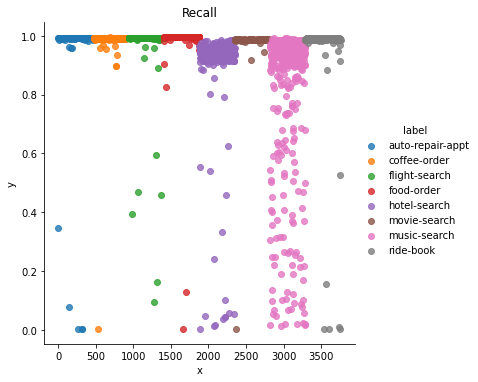

In [338]:
# graphing evaluation
recalls = pd.DataFrame(list(zip(eval_recall, eval_label)), columns=['y', 'label'])
recalls['x'] = recalls.index
print(recalls.head(5))
recall_graph = sns.lmplot(data=recalls, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)
ax_recalls = plt.gca()
ax_recalls.set_title("Recall")

          y             label  x
0  0.991489  auto-repair-appt  0
1  0.991489  auto-repair-appt  1
2  0.346809  auto-repair-appt  2
3  0.991489  auto-repair-appt  3
4  0.991489  auto-repair-appt  4


[Text(0.5, 6.79999999999999, 'i-th utterance'),
 Text(17.784999999999997, 0.5, 'F1 score')]

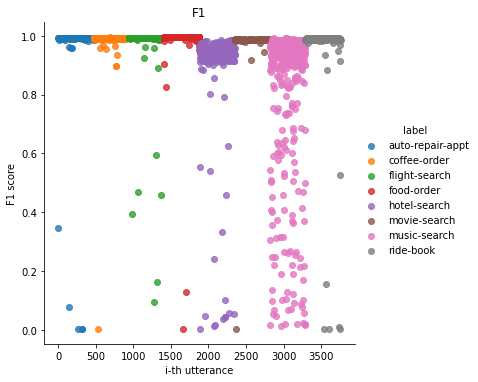

In [339]:
f1 = pd.DataFrame(list(zip(eval_f1, eval_label)), columns=['y', 'label'])
f1['x'] = f1.index
print(f1.head(5))
f1_graph = sns.lmplot(data=f1, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)
ax_f1 = plt.gca()
ax_f1.set_title("F1")
ax_f1.set(xlabel = 'i-th utterance', ylabel = 'F1 score')

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'auto-repair-appt'),
  Text(1, 0, 'coffee-order'),
  Text(2, 0, 'flight-search'),
  Text(3, 0, 'food-order'),
  Text(4, 0, 'hotel-search'),
  Text(5, 0, 'movie-search'),
  Text(6, 0, 'music-search'),
  Text(7, 0, 'ride-book')])

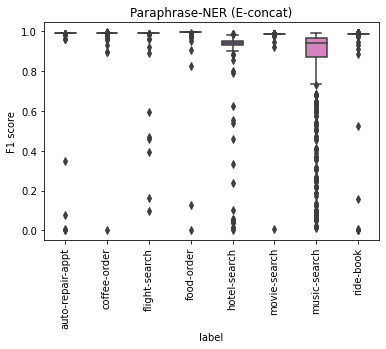

In [344]:
ax_test = sns.boxplot(data=f1, x='label', y='y', width = 0.5)
plt.title("Paraphrase-NER (E-concat)")
plt.ylabel("F1 score")
plt.xticks(rotation=90)

In [341]:
f1.head(5)

,y,label,x
0,0.991489,auto-repair-appt,0
1,0.991489,auto-repair-appt,1
2,0.346809,auto-repair-appt,2
3,0.991489,auto-repair-appt,3
4,0.991489,auto-repair-appt,4


In [342]:
eval_f1_means, eval_f1_stds = [], []
for label in test_data_labels:
    eval_f1_means.append((label, f1[f1['label'] == label]['y'].mean()))
    eval_f1_stds.append((label, f1[f1['label'] == label]['y'].std()))
print("f1 means by label: ", eval_f1_means)
print("f1 STD by label: ", eval_f1_stds)

f1 means by label:  [('auto-repair-appt', 0.9815663196016297), ('coffee-order', 0.9885287460389315), ('flight-search', 0.9829153463105476), ('food-order', 0.9908827523766413), ('hotel-search', 0.9162426437301947), ('movie-search', 0.9849207786328659), ('music-search', 0.83208239022182), ('ride-book', 0.9776459936622905)]
f1 STD by label:  [('auto-repair-appt', 0.09392977523595006), ('coffee-order', 0.04616650766330193), ('flight-search', 0.07359063242083798), ('food-order', 0.06145028642169207), ('hotel-search', 0.14220487248727504), ('movie-search', 0.04549269928214822), ('music-search', 0.2507921812707544), ('ride-book', 0.10069594641726758)]


          y             label  x
0  0.991489  auto-repair-appt  0
1  0.991489  auto-repair-appt  1
2  0.346809  auto-repair-appt  2
3  0.991489  auto-repair-appt  3
4  0.991489  auto-repair-appt  4


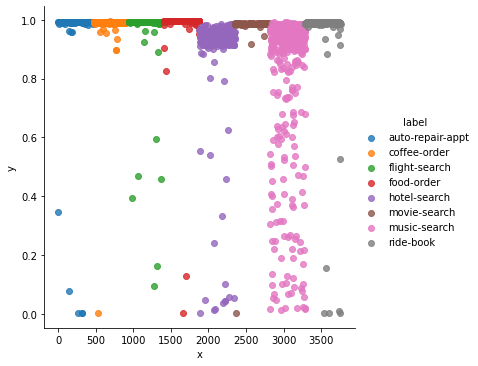

In [343]:
precision = pd.DataFrame(list(zip(eval_precision, eval_label)), columns=['y', 'label'])
precision['x'] = precision.index
print(f1.head(5))
f1_graph = sns.lmplot(data=precision, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)

### Appendix: previous data cleaning attempts

In [183]:
# # train_dev_test_split = [0.6, 0.2, 0.2]
# train_corpus, dev_corpus, test_corpus = [], [], []
# for idx in corpus_label_counts.index.tolist():
#     label = idx[0]
#     all_data = dataset[dataset['label'] == label].reset_index(drop=True)
#     train_corpus.append(all_data[:int(len(all_data) * 0.6)])
#     dev_corpus.append(all_data[int(len(all_data) * 0.6) : int(len(all_data) * 0.7)])
#     test_corpus.append(all_data[int(len(all_data) * 0.7):])
# train_corpus = pd.concat(train_corpus)
# dev_corpus = pd.concat(dev_corpus)
# test_corpus = pd.concat(test_corpus)
# print("train data size: ", len(train_corpus), ", dev data size: ", len(dev_corpus), ", test data size: ", len(test_corpus))

train data size:  10228 , dev data size:  1706 , test data size:  5121


In [184]:
# print("train:\n")
# print(train_corpus['label'].value_counts())
# print("\n dev: \n")
# print(dev_corpus['label'].value_counts())
# print("\n test: \n")
# print(test_corpus['label'].value_counts())

train:

restaurant-search    1825
movie-search         1601
flight-search        1375
music-search          916
pizza-order           825
coffee-order          756
movie-ticket          727
auto-repair-appt      658
food-order            605
ride-book             598
restaurant-book       342
Name: label, dtype: int64

 dev: 

restaurant-search    304
movie-search         267
flight-search        230
music-search         152
pizza-order          138
coffee-order         126
movie-ticket         122
auto-repair-appt     110
food-order           101
ride-book             99
restaurant-book       57
Name: label, dtype: int64

 test: 

restaurant-search    913
movie-search         801
flight-search        688
music-search         459
pizza-order          413
coffee-order         378
movie-ticket         364
auto-repair-appt     330
food-order           303
ride-book            300
restaurant-book      172
Name: label, dtype: int64


In [4]:
# import flair
# from flair.data import Sentence, Label
# from flair.models import SequenceTagger
# ner_tagger = SequenceTagger.load('ner')

In [ ]:
# def make_ner_tagged_input(u):
#     rest = ""
#     sent = Sentence(u)
#     ner_tagger.predict(sent)
#     print(sent.to_dict('ner'))
#     for token in sent:
#         label = token.get_tag('ner')
#         if label.value != "O":
#             value = label.value
#     for span in sent.get_spans('ner'):
#         print(span)
#     sent.add_span()